## Hospital Beds - Data Cleaning & EDA

___
### Packages

In [1]:
import sys
from pathlib import Path
import re

import missingno as msno
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore


### Set Up Pathing

In [2]:
HOME = Path.cwd()
PROJECT_HOME = HOME.parent
sys.path.insert(1, str(PROJECT_HOME))

### Import ```.py``` Modules

In [3]:
import utils

### Pamameters

In [4]:
DATA_FOLDER = PROJECT_HOME / "survey_data" / "CSV"
DATA_FILE = "response_data_clean.csv"

column_missing_threshold = 1.00 # Used to find empty columns

## Load Data

In [5]:
df = pd.read_csv(str(DATA_FOLDER / DATA_FILE))
df

,Unnamed: 0,Respondent ID,Collector ID,Start Date,End Date,IP Address,Respondent Contact Information: Name:,Respondent Contact Information: Title/Role:,Respondent Contact Information: E-mail:,Respondent Contact Information: Phone Number:,...,"Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other",What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 1:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 2:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 3:,hospital_address,county,region
0,0,1.186802e+11,457316537.0,08/28/2024 11:28:25 PM,08/28/2024 11:38:51 PM,73.16.24.7,John Alexander,Chief Operating Officer,alexanjo@cmhc.org,2074025140,...,2.0,NaN,NaN,NaN,Hospital inpatient beds,Psych hospital beds,NaN,"300 Main Street, Lewiston, ME 04240)",Androscoggin,3
1,1,1.186788e+11,457316537.0,08/27/2024 05:55:57 AM,08/27/2024 06:34:34 AM,192.159.150.62,Lisa Oliver,Nursing Director of Emergency/Inpatient/SWING/UR,loliver@pvhme.org,2077947332,...,NaN,NaN,NaN,NaN,Lack of psychiatric inpatient beds and care,Lack of acute beds statewide along with transp...,"Families ""dumping"" elderly patients in ED and ...","7 Transalpine Road, P.O. Box 368, Lincoln, ME ...",Penobscot,6
2,2,1.186787e+11,457316537.0,08/27/2024 02:44:14 AM,08/27/2024 06:09:22 AM,71.254.100.90,Barbara Sergio,President,barbara.sergio@mainehealth.org,207-779-2686,...,0.0,0.0,0.0,0.0,community resources,acceptance of goals of care by family,bed availability local SNF,"111 Franklin Health Commons, Farmington, ME 04938",Franklin,2
3,3,1.186787e+11,457316537.0,08/27/2024 04:01:30 AM,08/27/2024 04:02:43 AM,198.160.5.13,Denise M. Scuderi,Vice President of Nursing and Patient Care Ser...,dscuderi@northernlight.org,2075644252,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"897 West Main Street, Dover-Foxcroft, ME 04426)",Piscataquis,6
4,4,1.186787e+11,457316537.0,08/27/2024 03:45:30 AM,08/27/2024 03:45:57 AM,206.208.206.55,Stephany L. Jacques,President,jacquest@cmhc.org,2073691034,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"420 Franklin Street, Rumford, ME 04276)",Oxford,2
5,5,1.186787e+11,457316537.0,08/27/2024 02:47:52 AM,08/27/2024 03:09:29 AM,192.159.146.18,RACHEL MANZO,RN CASE MANAGER,RMANZO@MRHME.ORG,2077237217,...,0.0,0.0,0.0,0.0,PSYCH BEDS,MEDICAL BEDS,TRANSFER TO TERTIARY,"200 Somerset Street, Millinocket, ME 04462)",Penobscot,6
6,6,1.186786e+11,457316537.0,08/27/2024 12:19:18 AM,08/27/2024 12:19:52 AM,198.160.5.14,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"P.O. Box 422, 268 Stillwater Avenue, Bangor, M...",Penobscot,6
7,7,1.186781e+11,457316537.0,08/26/2024 07:56:16 AM,08/26/2024 08:25:21 AM,71.254.100.82,Brenda Prisco,Director of Case management and UR for Pen Bay...,NaN,NaN,...,1.0,1.0,0.0,0.0,Lack of outpatient mental health and residenti...,Lack of housing,Lack of long-term care beds within the state,"Six Glen Cove Drive, Rockport, ME 04856)",Knox,4
8,8,1.186780e+11,457316537.0,08/26/2024 06:20:07 AM,08/26/2024 06:49:25 AM,71.254.100.82,Brenda Prisco,Coastal Director for Waldo County General Hosp...,Brenda.Prisco@mainehealth.org,207-505-4694,...,0.0,3.0,0.0,0.0,Increasing homelessness with lack of housing,Lack of long term care bed availability,Difficulty in obtaining emergency guardianship,"118 Northport Avenue, P.O. Box 287, Belfast, M...",Waldo,4
9,9,1.186698e+11,457316537.0,08/14/2024 06:19:37 AM,08/14/2024 07:19:05 AM,192.159.144.50,"Mary E. Thomsen, R

#### Assigning Datatypes

In [6]:
df.dtypes.value_counts()

float64    137
object      22
int64        2
Name: count, dtype: int64

#### COnvert all numericals to float dtype

In [7]:
def convert_object_to_float(df):
    '''
    Convert any eligible object columns to float while keeping NaN values.
    
    Input:
        df (pd.DataFrame): Dataframe with object columns containing numeric values and NaNs.
    
    Output:
        pd.DataFrame: Modified fataframe
    '''
    for col in df.columns:
        try:
            df[col] = pd.to_numeric(df[col], errors='raise').astype(float)
        except ValueError:
            pass

    return df

single_index_df = convert_object_to_float(df)

#### Recheck distribution

In [8]:
df.dtypes.value_counts()

float64    139
object      22
Name: count, dtype: int64

### Get columns with long form response:

In [9]:
# Filter columns where any value in that column has string length > 6
def has_long_string(series):
    """Check if any string in the column has length > 4."""
    return series.apply(lambda x: isinstance(x, str) and len(x) > 6).any()

long_form_response_df = df.loc[:, df.apply(has_long_string, axis=0)]
long_form_cols = long_form_response_df.columns
long_form_response_df

,Start Date,End Date,IP Address,Respondent Contact Information: Name:,Respondent Contact Information: Title/Role:,Respondent Contact Information: E-mail:,Respondent Contact Information: Phone Number:,hospital_name,"What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Comments:","Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Comments:",Is there anything else you would like to share regarding the process of discharging patients to post-acute care settings? Open-Ended Response,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 1:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 2:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 3:,hospital_address,county
0,08/28/2024 11:28:25 PM,08/28/2024 11:38:51 PM,73.16.24.7,John Alexander,Chief Operating Officer,alexanjo@cmhc.org,2074025140,Central Maine Medical Center,Uber Van purchased services,Not Helpful - Unresponsive to request/ no plac...,NaN,No help,NaN,Hospital inpatient beds,Psych hospital beds,NaN,"300 Main Street, Lewiston, ME 04240)",Androscoggin
1,08/27/2024 05:55:57 AM,08/27/2024 06:34:34 AM,192.159.150.62,Lisa Oliver,Nursing Director of Emergency/Inpatient/SWING/UR,loliver@pvhme.org,2077947332,Penobscot Valley Hospital,We work closely with area EMS to provide trans...,NaN,We have not used DHHS to help with placement.,NaN,no,Lack of psychiatric inpatient beds and care,Lack of acute beds statewide along with transp...,"Families ""dumping"" elderly patients in ED and ...","7 Transalpine Road, P.O. Box 368, Lincoln, ME ...",Penobscot
2,08/27/2024 02:44:14 AM,08/27/2024 06:09:22 AM,71.254.100.90,Barbara Sergio,President,barbara.sergio@mainehealth.org,207-779-2686,Franklin Memorial Hospital,Community transport-Western Maine Taxi vouche...,Mostly Helpful - Assistance provided and Place...,NaN,NaN,NaN,community resources,acceptance of goals of care by family,bed availability local SNF,"111 Franklin Health Commons, Farmington, ME 04938",Franklin
3,08/27/2024 04:01:30 AM,08/27/2024 04:02:43 AM,198.160.5.13,Denise M. Scuderi,Vice President of Nursing and Patient Care Ser...,dscuderi@northernlight.org,2075644252,Northern Light Mayo Hospital,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"897 West Main Street, Dover-Foxcroft, ME 04426)",Piscataquis
4,08/27/2024 03:45:30 AM,08/27/2024 03:45:57 AM,206.208.206.55,Stephany L. Jacques,President,jacquest@cmhc.org,2073691034,Rumford Hospital,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"420 Franklin Street, Rumford, ME 04276)",Oxford
5,08/27/2024 02:47:52 AM,08/27/2024 03:09:29 AM,192.159.146.18,RACHEL MANZO,RN CASE MANAGER,RMANZO@MRHME.ORG,2077237217,Millinocket Regional Hospital,VOUCHERS,Not Helpful - Unresponsive to request/ no plac...,DHHS RATHER RECOMMENDS PATIENT BE BROUGHT TO O...,NO ASSISTANCE PROVIDED.,LACK OF STAFFING = LACK OF BEDS AVAILABLE,PSYCH BEDS,MEDICAL BEDS,TRANSFER TO TERTIARY,"200 Somerset Street, Millinocket, ME 04462)",Penobscot
6,08/27/2024 12:19:18 AM,08/27/2024 12:19:52 AM,198.160.5.14,NaN,NaN,NaN,NaN,Northern Light Acadia Hospital,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"P.O. Box 422, 268 Stillwater Avenue, Bangor, M...",Penobscot
7,08/26/2024 07:56:16 AM,08/26/2024 08:25:21 AM,71.254.100.82,Brenda Prisco,Director of Case management and 

### Column Types and NaN Ratios

In [10]:
def check_column_types_and_nans(df, threshold=0.2):
    '''
    Checks each column of a dataframe and returns a list of numerical attributes and nominal attributes, 
    along with NaN counts for each column
    
    Inputs:
        df(pd.DataFrame): Dataframe to be checked.
        threhsold(float): NAN ratio threshold to add cols to exclusion list. Default is 0.20.
    Out:
        dict{
            'numerical_cols': numerical_cols,     
            'nominal_cols': non_numerical_cols,       
            }
    '''
    
    numerical_cols = []
    num_nan_count = []
    non_numerical_cols = []
    nom_nan_count = []
    nan_above_thresold = []
    
    # Iterate through each column in the DataFrame
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            numerical_cols.append(col)
            nan_count = df[col].isna().sum()
            num_nan_count.append(nan_count) # Count NaN values for the column
            nan_above_thresold.append(col) if nan_count/df.shape[0] > threshold else None
        else:
            non_numerical_cols.append(col)
            nan_count = df[col].isna().sum()
            nom_nan_count.append(nan_count)  
            nan_above_thresold.append(col) if nan_count/df.shape[0] > threshold else None

    
    # Print out the results with Dtype and NaN counts
    print("*"*50)
    print(f"Numerical Columns: {len(numerical_cols)}")
    if not numerical_cols:
        print("**NONE**")
    else:    
        for col, nan_count in zip(numerical_cols, num_nan_count):
            print(f"{col} \n - dtype: {df[col].dtype} \n - NaN count: {nan_count} \n - NaN ratio: {nan_count/df.shape[0]}")
    
    print("*"*50)    
    print(f"Non-Numerical Columns: {len(non_numerical_cols)}")
    if not non_numerical_cols:
        print("**NONE**")
    else:
        for col, nan_count in zip(non_numerical_cols, nom_nan_count):
            print(f"{col} \n - dtype: {df[col].dtype} \n - NaN count: {nan_count} \n - NaN ratio: {nan_count/df.shape[0]}")

    print("*"*50)
    print(f"Columns with NAN ration greather than {threshold * 100}%: {len(nan_above_thresold)}")
    if not nan_above_thresold:
        print("**NONE**")
    else:
        for col in nan_above_thresold:
            print(col)
            
    return {'numerical_cols': numerical_cols, 'nominal_cols': non_numerical_cols, 'nan_above_threshold': nan_above_thresold}

col_info_dict = check_column_types_and_nans(df, threshold=.99)

**************************************************
Numerical Columns: 139
Unnamed: 0 
 - dtype: float64 
 - NaN count: 0 
 - NaN ratio: 0.0
Respondent ID 
 - dtype: float64 
 - NaN count: 0 
 - NaN ratio: 0.0
Collector ID 
 - dtype: float64 
 - NaN count: 0 
 - NaN ratio: 0.0
Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF): 
 - dtype: float64 
 - NaN count: 5 
 - NaN ratio: 0.2
Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC): 
 - dtype: float64 
 - NaN count: 4 
 - NaN ratio: 0.16
Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF): 
 - dtype: float64 
 - NaN count: 4 
 - NaN ratio: 0.16
Total number of patients awaiting discharge to the following settings: Home Health: 
 - dtype: float64 
 - NaN count: 5 
 - NaN ratio: 0.2
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing 

In [11]:
def separate_unique_columns(df):
    """
    This function separates columns of a DataFrame into those with 100% unique values and those with less than 100% unique values.

    Args:
    df (pd.DataFrame): The DataFrame containing the data.

    Returns:
    dict: A dictionary with two keys: '100% unique' and '<100% unique'. Each contains a list of column names.
    """
    unique_cols = []
    non_unique_cols = []

    for column in df.columns:
        num_unique = df[column].nunique()
        total_values = df[column].size
        
        if num_unique == total_values:
            unique_cols.append(column)
        else:
            non_unique_cols.append(column)
    
    print("*****************************")
    print("non_ML_attr")
    for attr in unique_cols:
        print(attr)
    print("*****************************")
    print("ML_attr")
    for attr in non_unique_cols:
        print(attr)

    return {
        'non_ML_attr': unique_cols,
        'ML_attr': non_unique_cols
    }

ml_attr_dict = separate_unique_columns(df)

*****************************
non_ML_attr
Unnamed: 0
Respondent ID
Start Date
End Date
hospital_name
hospital_address
*****************************
ML_attr
Collector ID
IP Address
Respondent Contact Information: Name:
Respondent Contact Information: Title/Role:
Respondent Contact Information: E-mail:
Respondent Contact Information: Phone Number:
Is your facility designated a Critical Access Hospital? Response
Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):
Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):
Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):
Total number of patients awaiting discharge to the following settings: Home Health:
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):
Of the total patients reported in Question 1, how many patients requir

In [12]:
# seperate nominal machine learning attributes
nominal_df = df[[col for col in col_info_dict['nominal_cols'] if col not in ml_attr_dict['non_ML_attr']]].copy()
nominal_attr = nominal_df.columns.to_list()
print(f"Nominal Features: {nominal_attr}")
nominal_df

Nominal Features: ['IP Address', 'Respondent Contact Information: Name:', 'Respondent Contact Information: Title/Role:', 'Respondent Contact Information: E-mail:', 'Respondent Contact Information: Phone Number:', 'Is your facility designated a Critical Access Hospital? Response', 'What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response', 'If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response', 'If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Comments:', 'Have you sought assistance from the LTC Ombudsman with finding a placement for 

,IP Address,Respondent Contact Information: Name:,Respondent Contact Information: Title/Role:,Respondent Contact Information: E-mail:,Respondent Contact Information: Phone Number:,Is your facility designated a Critical Access Hospital? Response,"What, if any, current strategies or workarounds does your organization have relative to securing transportation? Open-Ended Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Response","If you have sought assistance from the Maine Department of Health & Human Services (DHHS) with finding a placement for a patient, how helpful would you rate that assistance provided by DHHS? (scale of 1 - not helpful, to 5 - very helpful) Comments:","Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Response","Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Comments:",Is there anything else you would like to share regarding the process of discharging patients to post-acute care settings? Open-Ended Response,"Have any staff been injured or threatened, verbally or physically, by patients > 17 years of age your emergency department? Response","Have any staff been injured or threatened, verbally or physically, by the patients <18 years of age in your emergency department? Response",What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 1:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 2:,What are the biggest factors affecting boarding patients in your emergency department? (Please describe) Factor 3:,county
0,73.16.24.7,John Alexander,Chief Operating Officer,alexanjo@cmhc.org,2074025140,No,Uber Van purchased services,Not Helpful - Unresponsive to request/ no plac...,NaN,Yes,No help,NaN,No,No,Hospital inpatient beds,Psych hospital beds,NaN,Androscoggin
1,192.159.150.62,Lisa Oliver,Nursing Director of Emergency/Inpatient/SWING/UR,loliver@pvhme.org,2077947332,Yes,We work closely with area EMS to provide trans...,NaN,We have not used DHHS to help with placement.,No,NaN,no,Yes,Yes,Lack of psychiatric inpatient beds and care,Lack of acute beds statewide along with transp...,"Families ""dumping"" elderly patients in ED and ...",Penobscot
2,71.254.100.90,Barbara Sergio,President,barbara.sergio@mainehealth.org,207-779-2686,Yes,Community transport-Western Maine Taxi vouche...,Mostly Helpful - Assistance provided and Place...,NaN,Unsure,NaN,NaN,Yes,No,community resources,acceptance of goals of care by family,bed availability local SNF,Franklin
3,198.160.5.13,Denise M. Scuderi,Vice President of Nursing and Patient Care Ser...,dscuderi@northernlight.org,2075644252,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Piscataquis
4,206.208.206.55,Stephany L. Jacques,President,jacquest@cmhc.org,2073691034,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Oxford
5,192.159.146.18,RACHEL MANZO,RN CASE MANAGER,RMANZO@MRHME.ORG,2077237217,Yes,VOUCHERS,Not Helpful - Unresponsive to request/ no plac...,DHHS RATHER RECOMMENDS PATIENT BE BROUGHT TO O...,Yes,NO ASSISTANCE PROVIDED.,LACK OF STAFFING = LACK OF BEDS AVAILABLE,Yes,Yes,PSYCH BEDS,MEDICAL BEDS,TRANSFER TO TERTIARY,Penobscot
6,198.160.5.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Penobscot
7,71.254.100.82,Brenda Prisco,Director of Case management and UR for Pen Bay...,NaN,NaN,No,We have our own wheelchair transportation van ...,NaN,1-2,Yes,They were of little assistance other than prov...,Lack of long-term care facilities within the s...,Yes,Yes,Lack of outpatient mental health and residenti...,Lack of housing,Lack of long-term care beds within the state,Knox
8,71.254.100.82,Brenda Prisco,Coastal Direct

In [13]:
print("Cardinality of Nominal Features:")
print(nominal_df.nunique())

Cardinality of Nominal Features:
IP Address                                                                                                                                                                                                                                                  22
Respondent Contact Information: Name:                                                                                                                                                                                                                       23
Respondent Contact Information: Title/Role:                                                                                                                                                                                                                 22
Respondent Contact Information: E-mail:                                                                                                                                                                   

In [14]:
# seperate numerical machine learning attributes
numerical_df = df[[col for col in col_info_dict['numerical_cols'] if col not in ml_attr_dict['non_ML_attr']]].copy()
numerical_attr = numerical_df.columns.to_list()
print(f"Numerical Features: {numerical_attr}")
numerical_df

Numerical Features: ['Collector ID', 'Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):', 'Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):', 'Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):', 'Total number of patients awaiting discharge to the following settings: Home Health:', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):', 'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:', 'Of the total patients reported in Question 1, how many patients are 

,Collector ID,Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):,Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):,Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):,Total number of patients awaiting discharge to the following settings: Home Health:,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):",...,"Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response","If Yes, how many have been impacted in the past week?.1 Open-Ended Response","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other",region
0,457316537.0,3.0,3.0,1.0,5.0,2.0,1.0,0.0,0.0,NaN,...,0.0,0.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN,3.0
1,457316537.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,0.0,0.0,...,0.0,0.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,6.0
2,457316537.0,NaN,2.0,1.0,NaN,NaN,0.0,0.0,NaN,NaN,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3,457316537.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0
4,457316537.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
5,457316537.0,1.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
6,457316537.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0
7,457316537.0,4.0,5.0,4.0,2.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,4.0,2.0,1.0,1.0,1.0,0.0,0.0,4.0
8,457316537.0,3.0,3.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,0.0,0.0,0.0,3.0,0.0,0.0,4.0
9,457316537.0,3.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0


In [15]:
# Compute statistcs for numerical col
numerical_stats = numerical_df.describe()

print("Statistics of each column:")
numerical_stats

Statistics of each column:


,Collector ID,Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):,Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):,Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):,Total number of patients awaiting discharge to the following settings: Home Health:,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):",...,"Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response","If Yes, how many have been impacted in the past week?.1 Open-Ended Response","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other",region
count,25.0,20.00000,21.000000,21.000000,20.000000,18.000000,20.000000,19.000000,19.0,18.000000,...,18.000000,14.000000,14.000000,15.000000,13.000000,17.000000,15.000000,14.000000,13.000000,25.000000
mean,457316537.0,5.40000,3.714286,1.809524,3.700000,0.222222,0.500000,0.157895,0.0,0.055556,...,0.777778,1.785714,3.642857,0.266667,0.076923,0.882353,0.600000,0.071429,0.153846,3.720000
std,0.0,6.59665,6.309856,2.960051,7.760222,0.548319,0.888523,0.501460,0.0,0.235702,...,0.878204,3.555680,7.448357,0.593617,0.277350,1.409005,0.985611,0.267261,0.375534,2.150969
min,457316537.0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,457316537.0,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,457316537.0,3.00000,2.000000,1.000000,1.500000,0.000000,0.000000,0.000000,0.0,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,457316537.0,7.00000,3.000000,2.000000,2.250000,0.000000,1.000000,0.000000,0.0,0.000000,...,1.000000,1.750000,3.250000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,6.000000
max,457316537.0,24.00000,23.000000,12.000000,27.000000,2.000000,3.000000,2.000000,0.0,1.000000,...,3.000000,10.000000,24.000000,2.000000,1.000000,5.000000,3.000000,1.000000,1.000000,7.000000


In [16]:
# Confirm all attributes are accounted for
assert (df.shape[1] == len(numerical_attr) + len(nominal_attr) + len(ml_attr_dict['non_ML_attr']))
print(f"All attributes in the train set have been accounted for.")
print()

print()
print("ML Ignore List:")
for idx, attr in enumerate(ml_attr_dict['non_ML_attr']):
    print(f"{idx + 1}. {attr}")
print()

print("Numerical Attributes:")
for idx, attr in enumerate(numerical_attr):
    print(f"{idx + 1}. {attr}")
print()

print("Nominal Attributes:")
for idx, attr in enumerate(nominal_attr):
    print(f"{idx + 1}. {attr}")
print()

print(f"Total Number of ML Attributes: {len(nominal_attr) + len(numerical_attr)}")

All attributes in the train set have been accounted for.


ML Ignore List:
1. Unnamed: 0
2. Respondent ID
3. Start Date
4. End Date
5. hospital_name
6. hospital_address

Numerical Attributes:
1. Collector ID
2. Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):
3. Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):
4. Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):
5. Total number of patients awaiting discharge to the following settings: Home Health:
6. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):
7. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):
8. Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):
9. Of 

## Nominal EDA

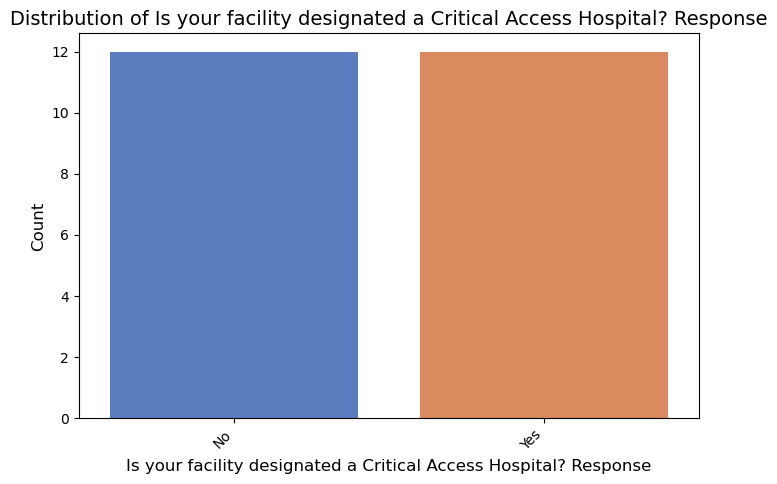


Frequency Distribution for Is your facility designated a Critical Access Hospital? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Is your facility designated a Critical Access H...                            
No                                                     12                 50.0
Yes                                                    12                 50.0 



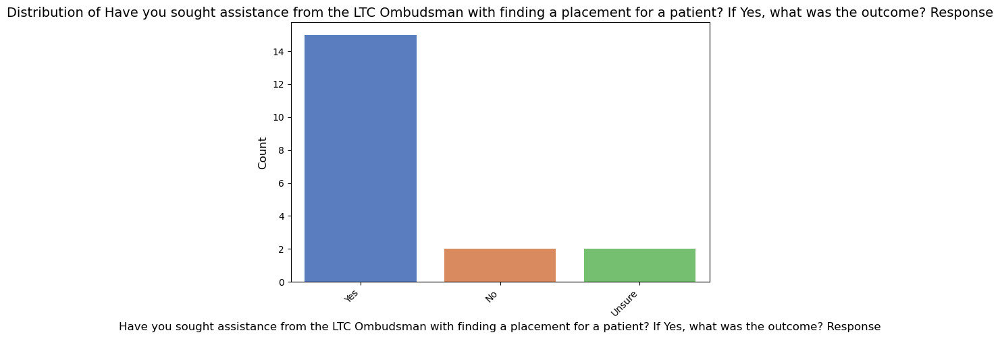


Frequency Distribution for Have you sought assistance from the LTC Ombudsman with finding a placement for a patient? If Yes, what was the outcome? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Have you sought assistance from the LTC Ombudsm...                            
Yes                                                    15                 78.9
No                                                      2                 10.5
Unsure                                                  2                 10.5 



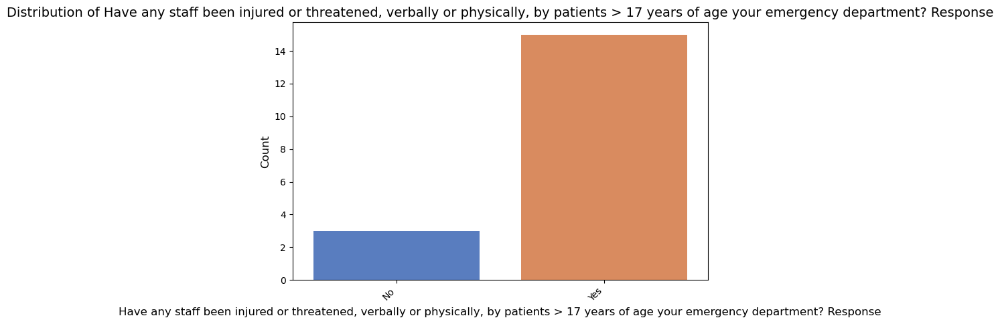


Frequency Distribution for Have any staff been injured or threatened, verbally or physically, by patients > 17 years of age your emergency department? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Have any staff been injured or threatened, verb...                            
Yes                                                    15                 83.3
No                                                      3                 16.7 



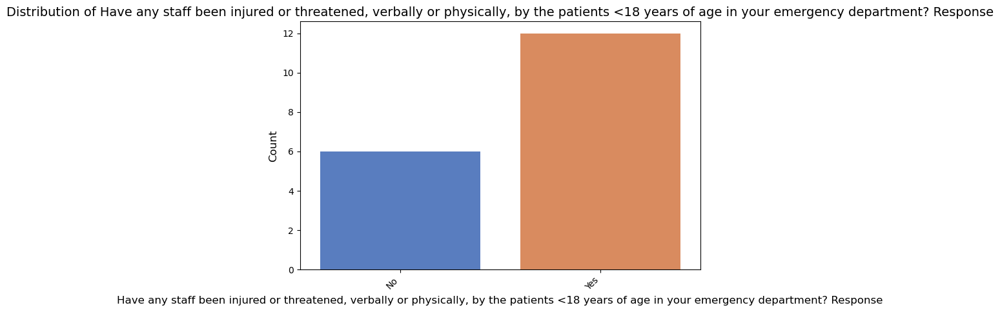


Frequency Distribution for Have any staff been injured or threatened, verbally or physically, by the patients <18 years of age in your emergency department? Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Have any staff been injured or threatened, verb...                            
Yes                                                    12                 66.7
No                                                      6                 33.3 



In [17]:
nominal_filtered_df = nominal_df[[col for col in nominal_df.columns if col not in long_form_cols]]

utils.nominal_eda(nominal_filtered_df)

### Longform Responses

In [18]:
for col in long_form_response_df:
    print("***"*50)
    print(f"Question: {col}")
    # Filter out NaNs
    non_nan_values = long_form_response_df[col].dropna()
    print("Responses:")
    for num, row in enumerate(non_nan_values):
        print(f"{num}. {row}")
    print("***"*50)

# Save to seperate csv
DATA_FOLDER = PROJECT_HOME / "survey_data" / "CSV"
DATA_FILE = "longform_responses.csv"
long_form_response_df.to_csv(str(DATA_FOLDER / DATA_FILE))

******************************************************************************************************************************************************
Question: Start Date
Responses:
0. 08/28/2024 11:28:25 PM
1. 08/27/2024 05:55:57 AM
2. 08/27/2024 02:44:14 AM
3. 08/27/2024 04:01:30 AM
4. 08/27/2024 03:45:30 AM
5. 08/27/2024 02:47:52 AM
6. 08/27/2024 12:19:18 AM
7. 08/26/2024 07:56:16 AM
8. 08/26/2024 06:20:07 AM
9. 08/14/2024 06:19:37 AM
10. 08/08/2024 02:08:10 AM
11. 08/05/2024 09:58:20 AM
12. 08/01/2024 08:39:20 AM
13. 07/31/2024 06:26:04 AM
14. 09/02/2024 01:50:09 PM
15. 08/27/2024 02:55:22 AM
16. 09/05/2024 07:26:18 AM
17. 08/15/2024 07:03:33 AM
18. 08/27/2024 06:10:38 AM
19. 08/30/2024 07:01:32 AM
20. 08/28/2024 04:48:07 AM
21. 08/27/2024 07:18:51 AM
22. 08/08/2024 08:16:02 AM
23. 08/01/2024 03:34:19 AM
24. 07/31/2024 07:06:15 AM
******************************************************************************************************************************************************
*

## Numerical EDA

____________________________________________________________________________________________________
Attribute: Collector ID
____________________________________________________________________________________________________
count           25.0
mean     457316537.0
std              0.0
min      457316537.0
25%      457316537.0
50%      457316537.0
75%      457316537.0
max      457316537.0
Name: Collector ID, dtype: float64


Frequency Distribution for Collector ID:
__________________________________________________
              Count  Frequency_Ratio (%)
Collector ID                            
457316537.0      25                100.0 


No significant outliers detected in Collector ID using Zscore with Threshold of 3.0 stds.

No significant outliers detected in Collector ID using IQR.

Plotting 'Collector ID' as discrete data.


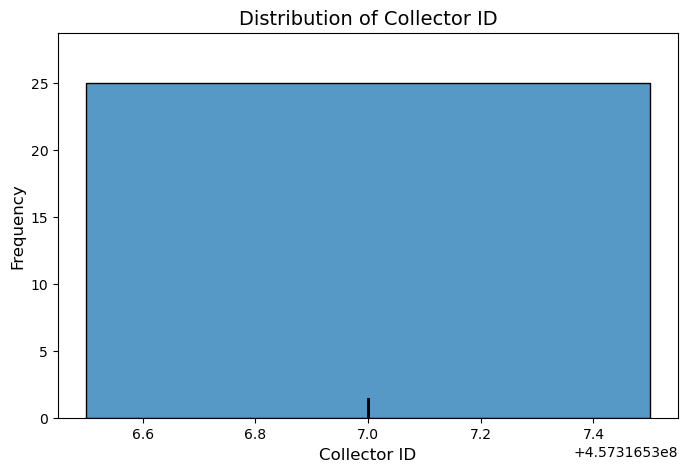

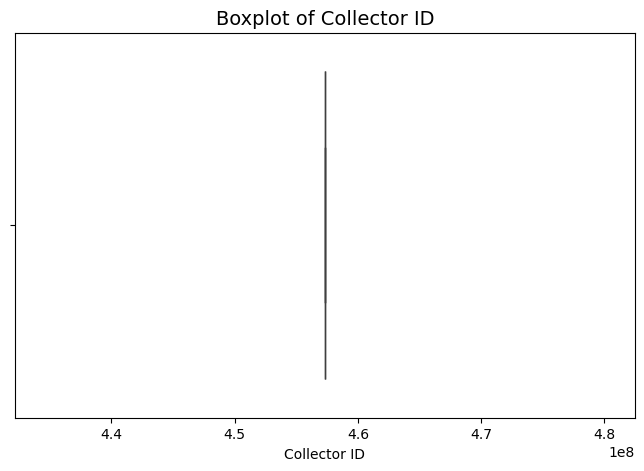

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    20.00000
mean      5.40000
std       6.59665
min       0.00000
25%       1.00000
50%       3.00000
75%       7.00000
max      24.00000
Name: Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
3.0                                                     4                

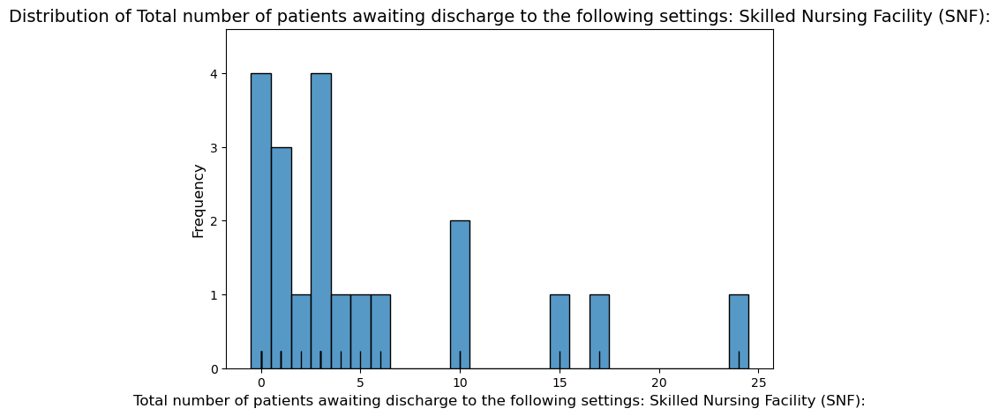

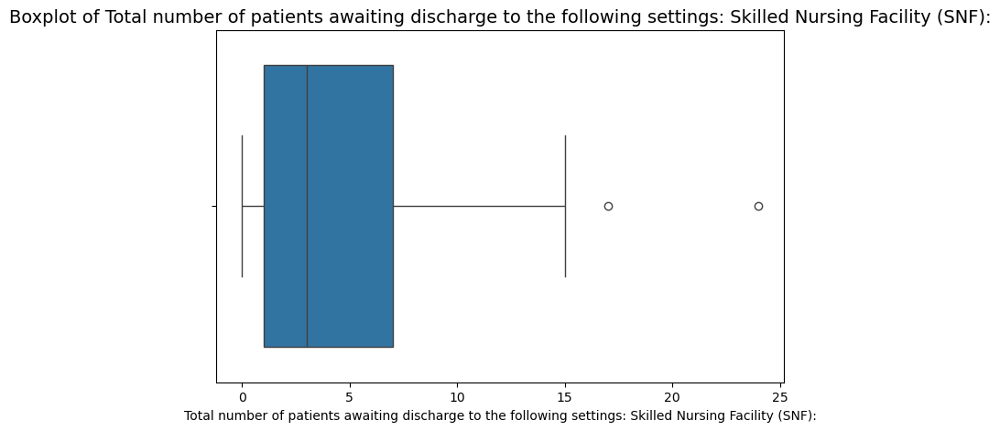

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    21.000000
mean      3.714286
std       6.309856
min       0.000000
25%       0.000000
50%       2.000000
75%       3.000000
max      23.000000
Name: Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                     6           

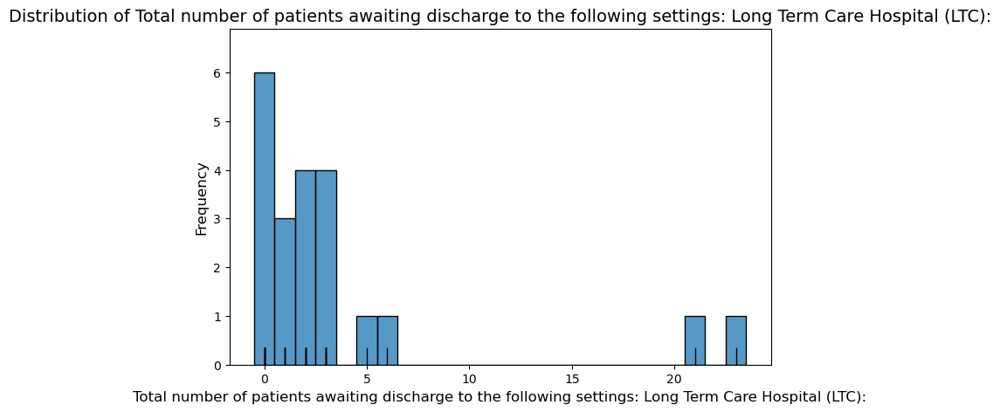

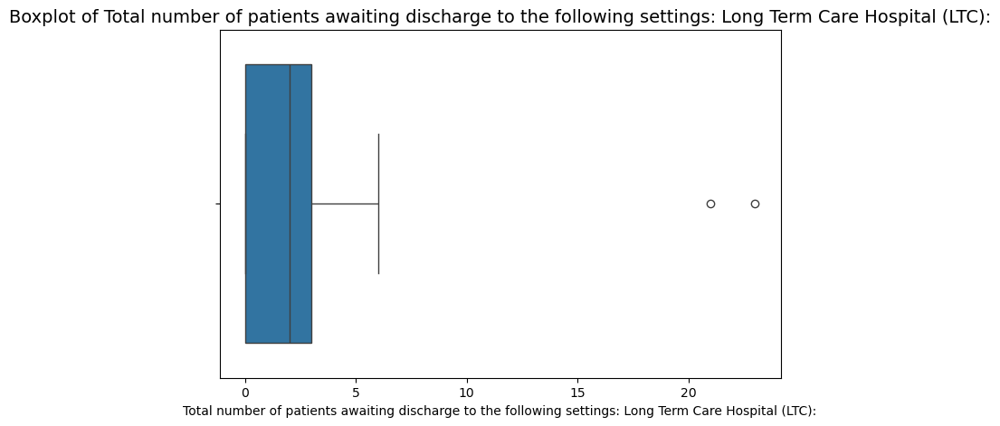

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    21.000000
mean      1.809524
std       2.960051
min       0.000000
25%       0.000000
50%       1.000000
75%       2.000000
max      12.000000
Name: Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                     9     

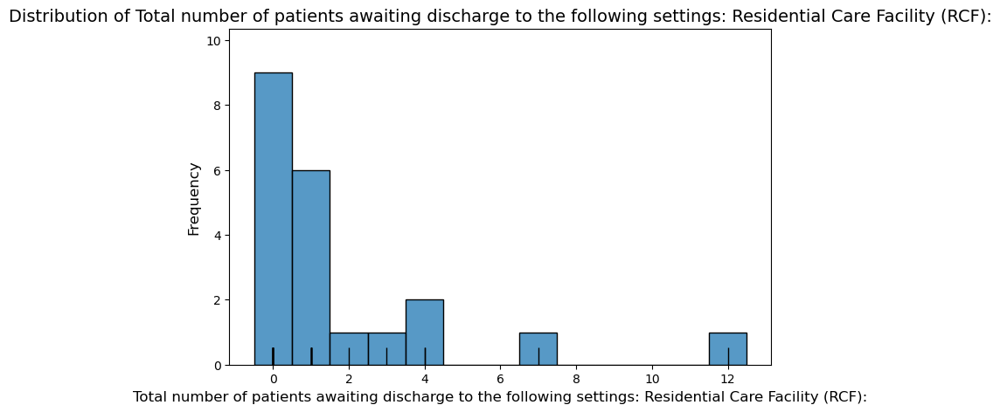

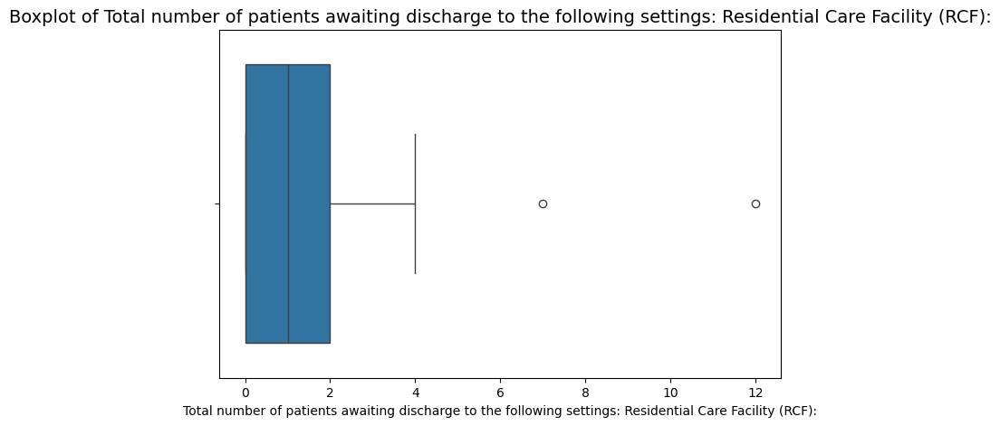

____________________________________________________________________________________________________
Attribute: Total number of patients awaiting discharge to the following settings: Home Health:
____________________________________________________________________________________________________
count    20.000000
mean      3.700000
std       7.760222
min       0.000000
25%       0.000000
50%       1.500000
75%       2.250000
max      27.000000
Name: Total number of patients awaiting discharge to the following settings: Home Health:, dtype: float64


Frequency Distribution for Total number of patients awaiting discharge to the following settings: Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Total number of patients awaiting discharge to ...                            
0.0                                                     9                 45.0
2.0                                        

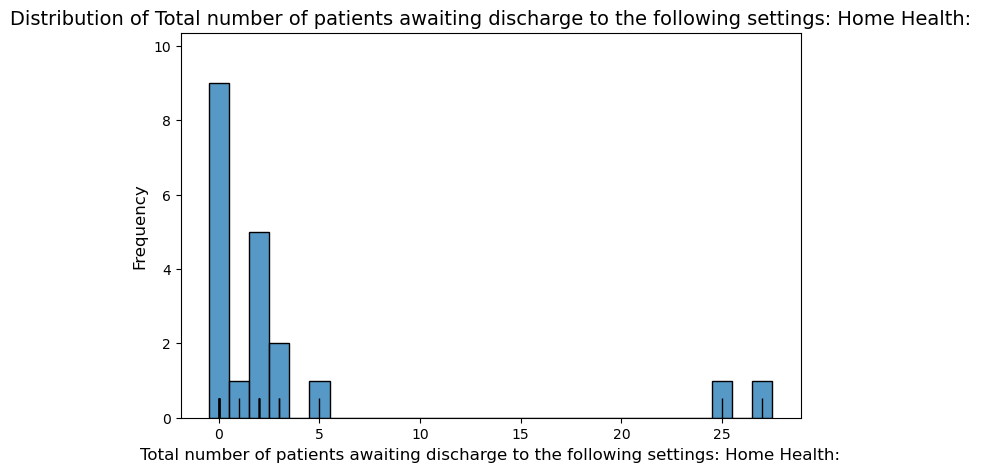

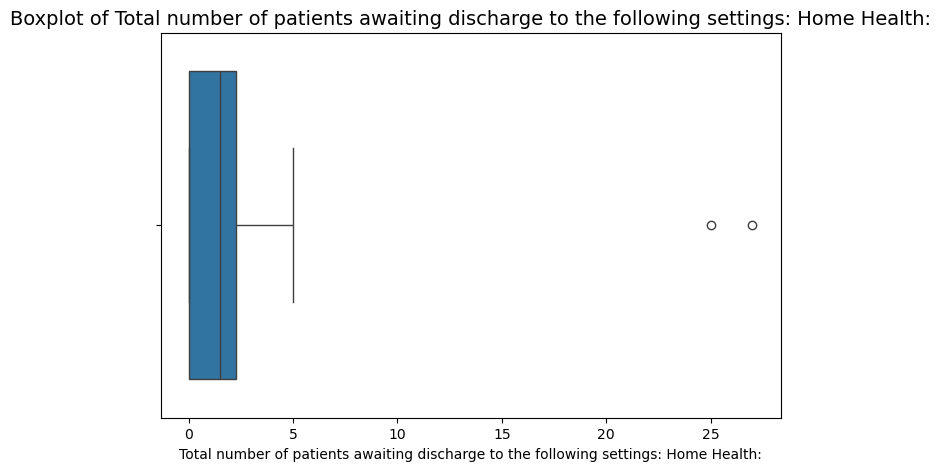

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    18.000000
mean      0.222222
std       0.548319
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.

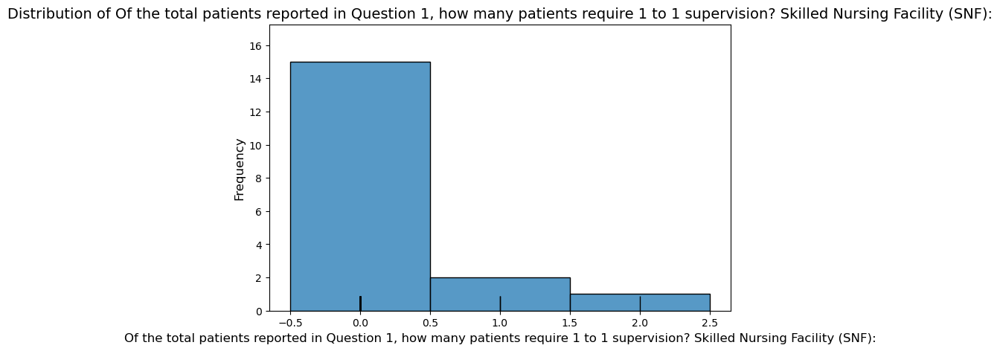

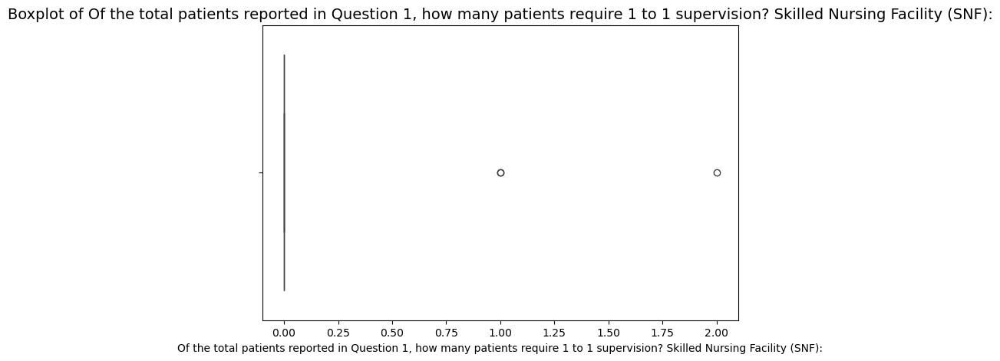

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    20.000000
mean      0.500000
std       0.888523
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0  

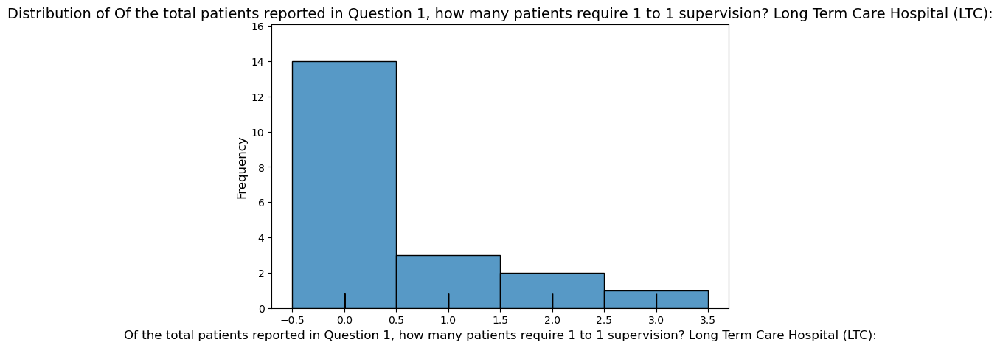

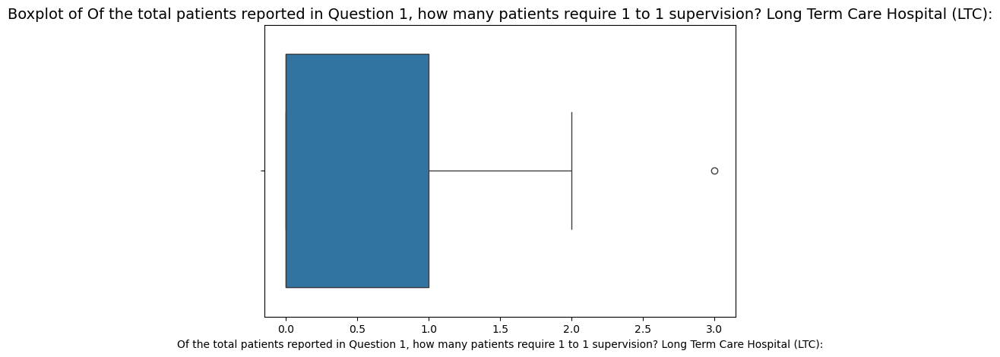

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    19.000000
mean      0.157895
std       0.501460
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            

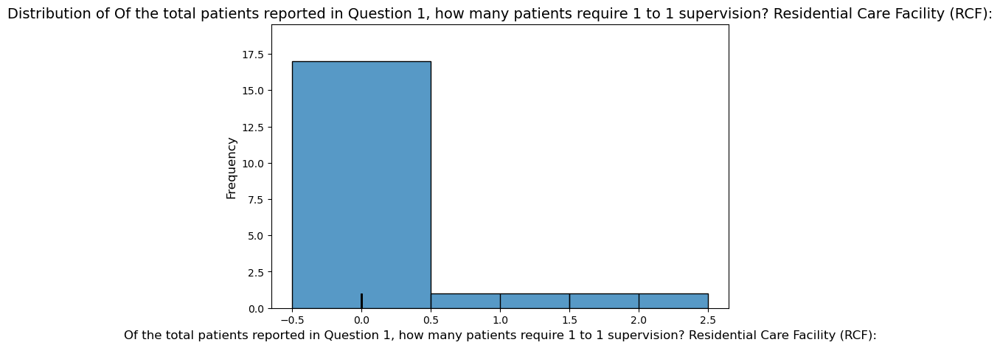

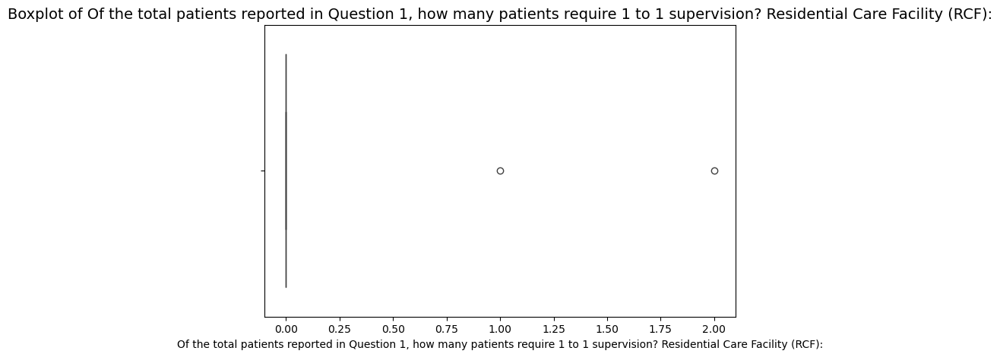

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:
____________________________________________________________________________________________________
count    19.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0                                                    19                100.0 


No significant ou

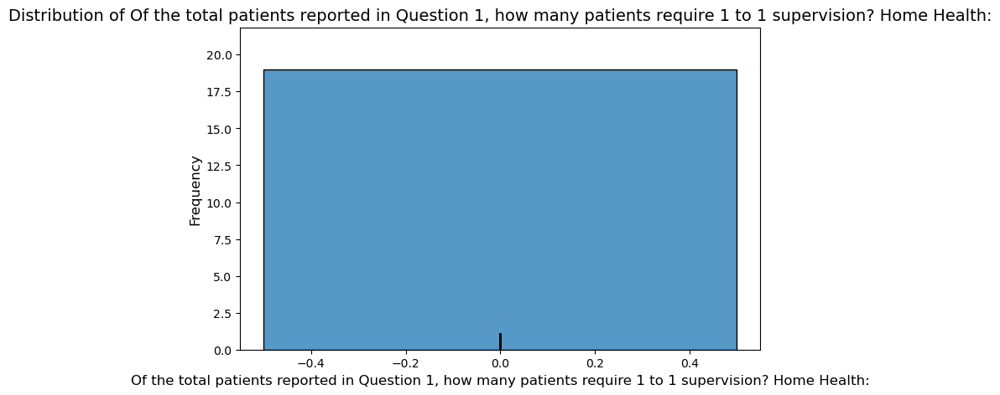

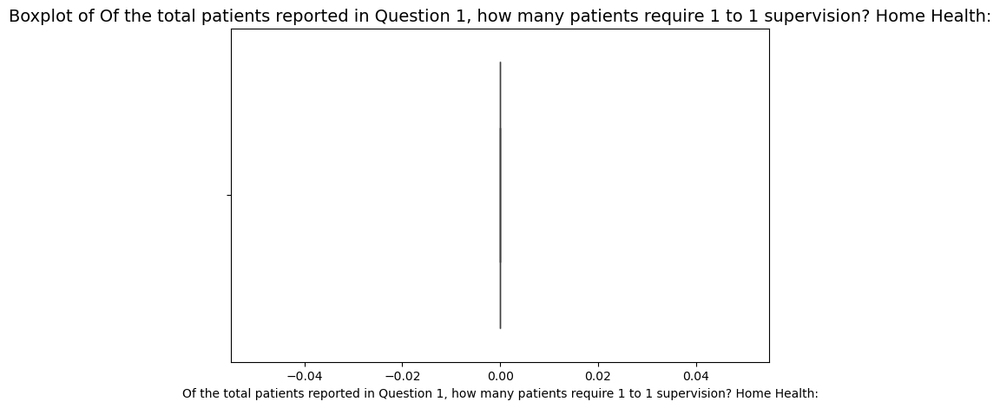

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    18.000000
mean      0.055556
std       0.235702
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled

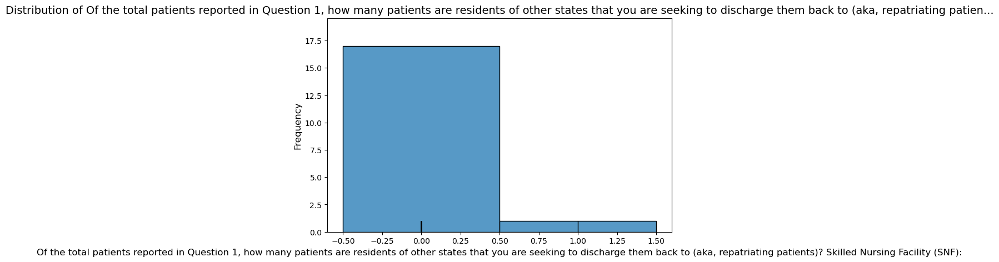

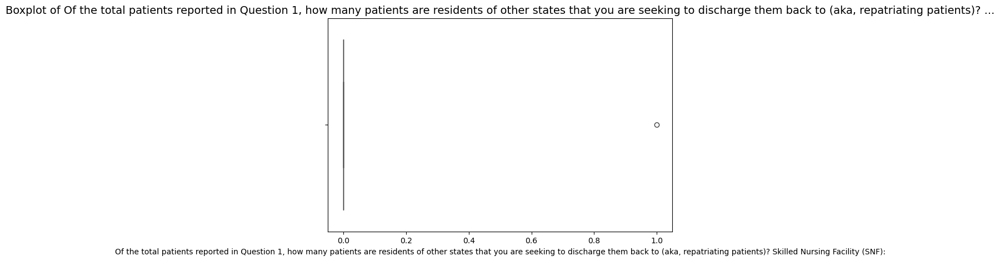

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    19.000000
mean      0.052632
std       0.229416
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Long Term

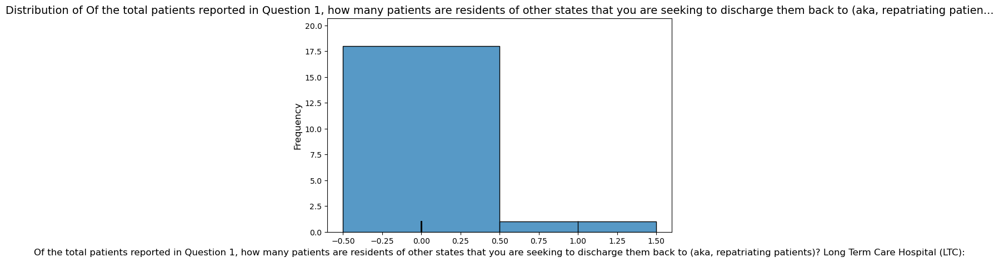

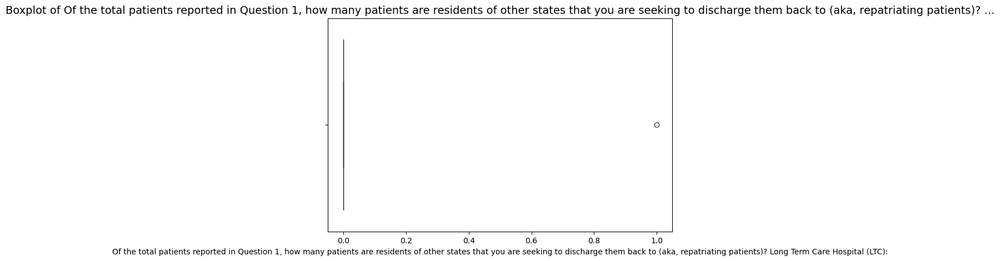

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    18.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Residential Care Facility (RCF)::
___________

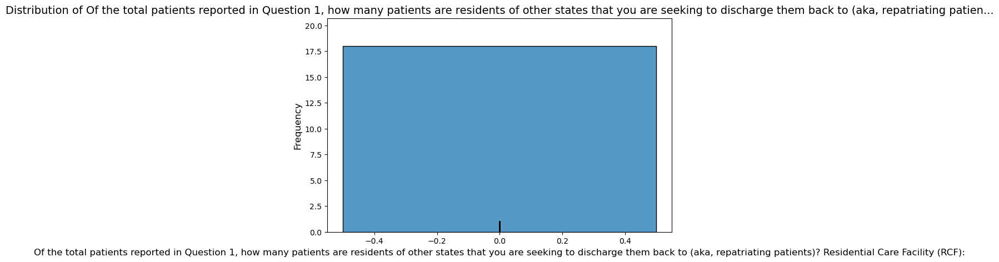

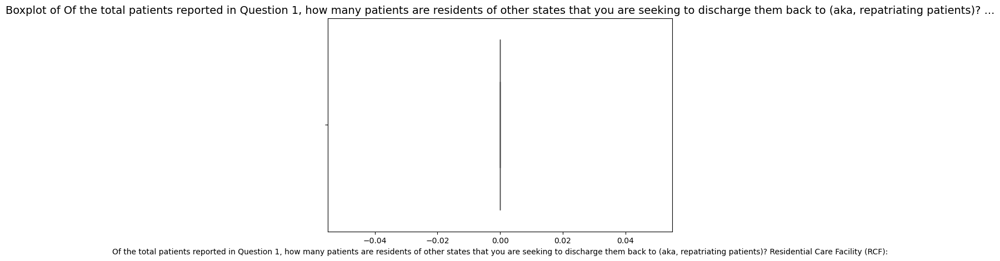

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Home Health:
____________________________________________________________________________________________________
count    18.000000
mean      0.166667
std       0.514496
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Home Health::
_______________________________

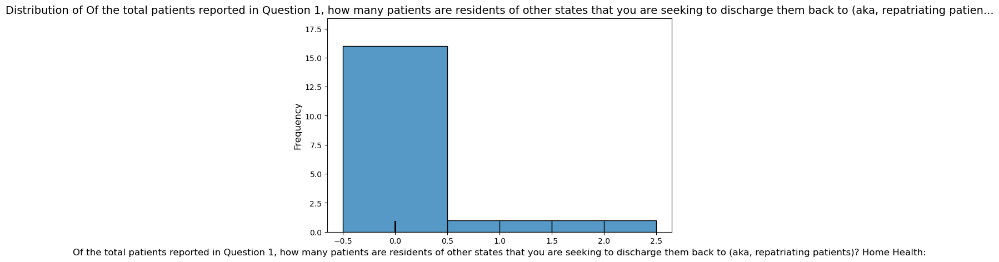

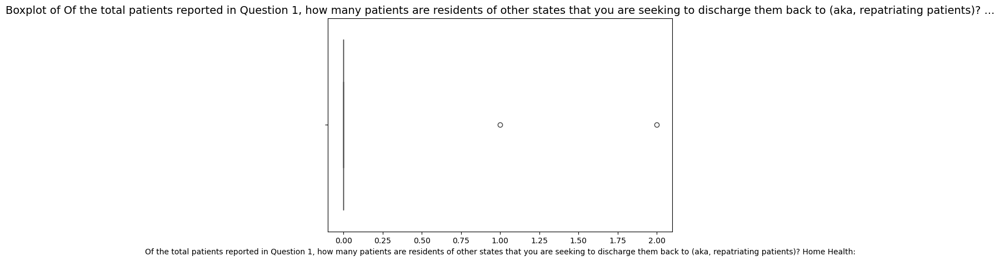

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    18.000000
mean      1.666667
std       2.786522
min       0.000000
25%       0.000000
50%       0.500000
75%       1.750000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in

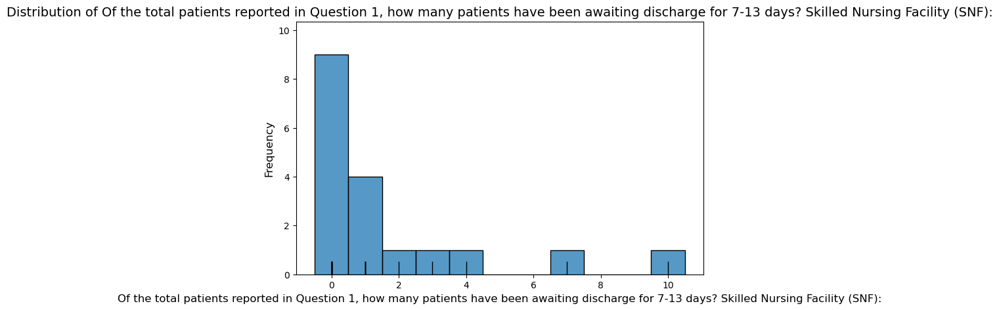

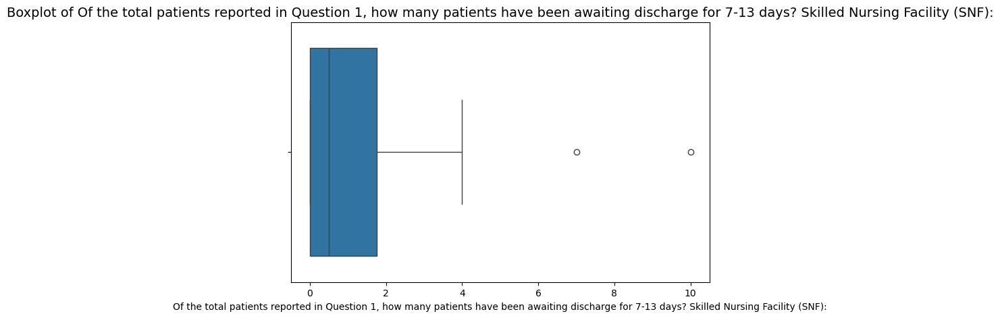

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    18.00000
mean      1.00000
std       1.53393
min       0.00000
25%       0.00000
50%       0.50000
75%       1.00000
max       6.00000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1

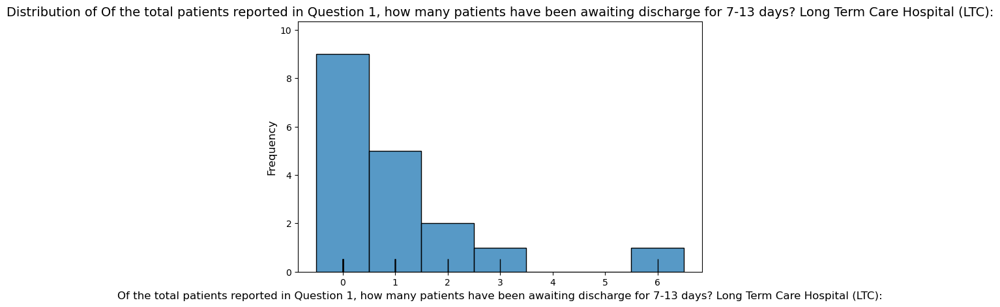

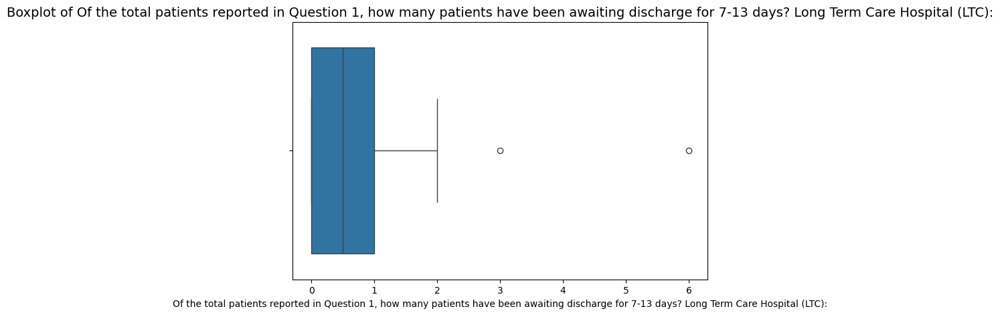

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    17.000000
mean      1.294118
std       2.543735
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported

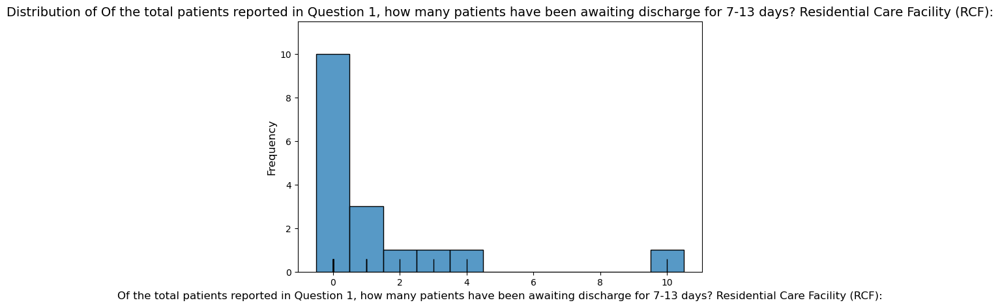

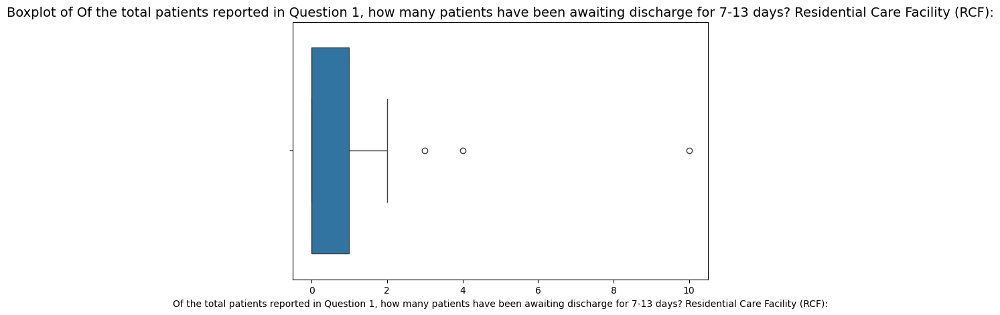

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health:
____________________________________________________________________________________________________
count    17.000000
mean      1.529412
std       4.597794
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      19.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0        

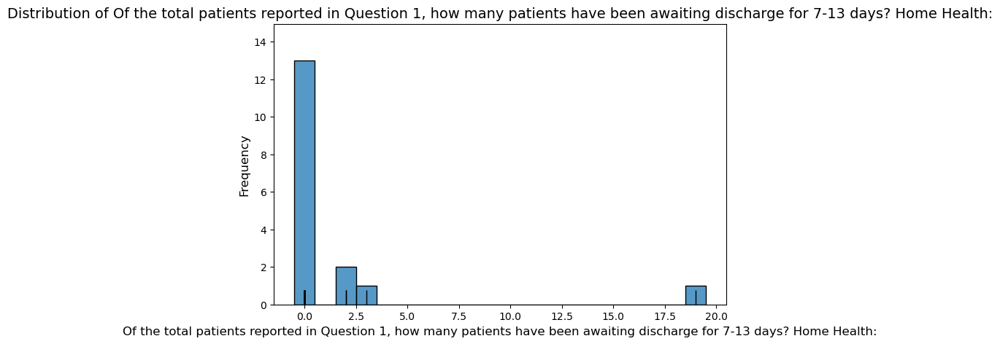

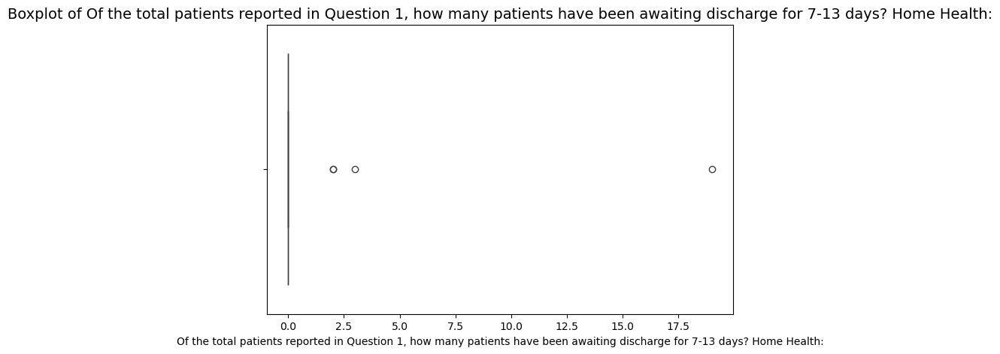

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    17.000000
mean      1.058824
std       2.461468
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported

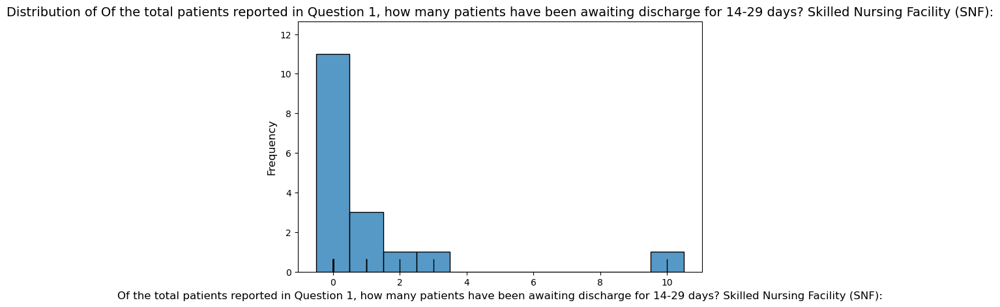

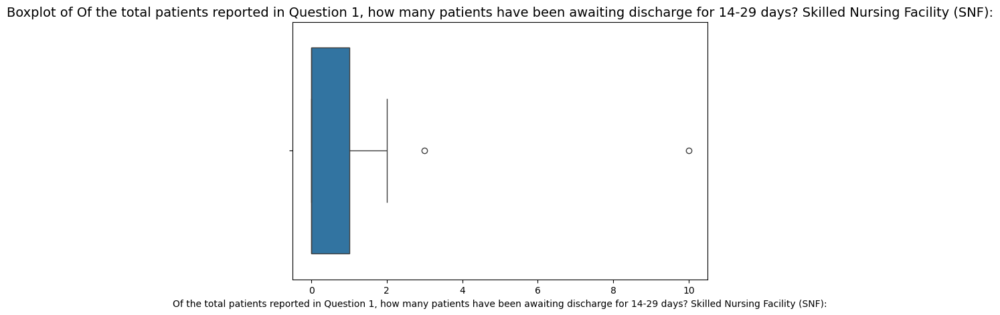

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    18.00000
mean      1.00000
std       1.57181
min       0.00000
25%       0.00000
50%       0.00000
75%       1.75000
max       6.00000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Questio

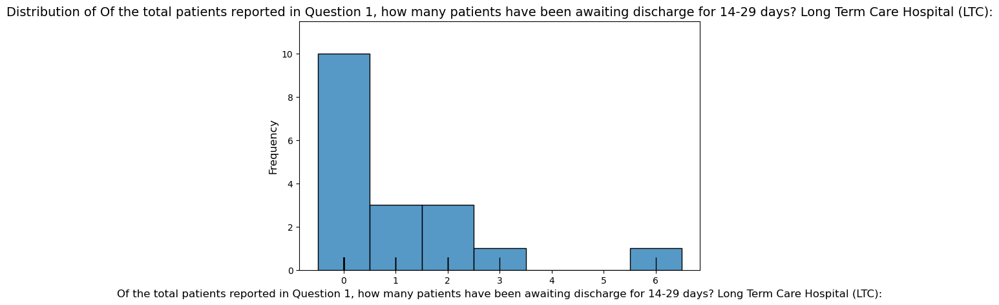

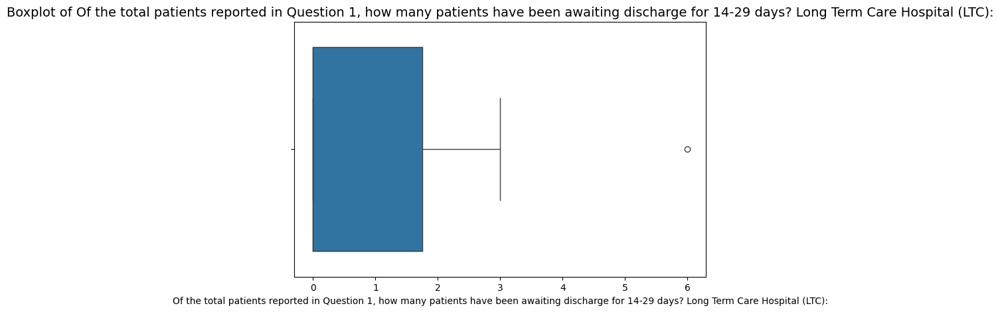

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    17.000000
mean      1.235294
std       2.537947
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      10.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients repor

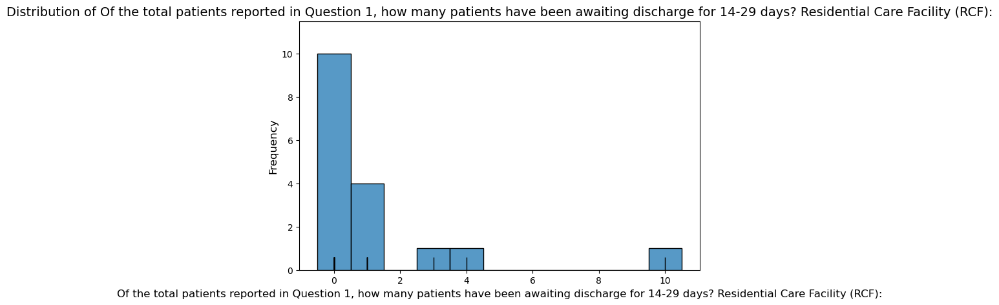

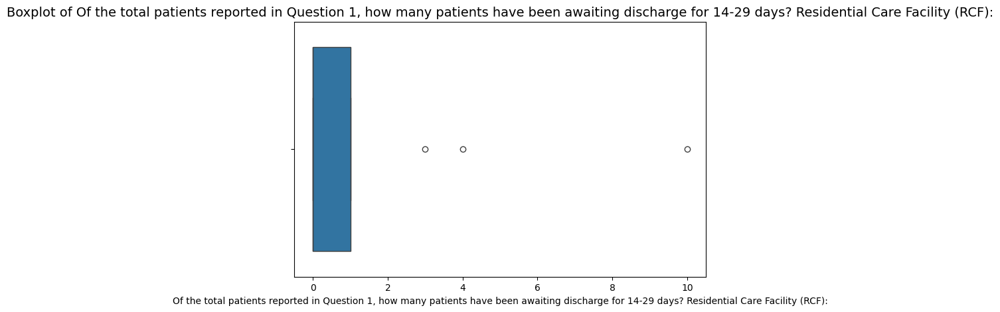

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Home Health:
____________________________________________________________________________________________________
count    17.000000
mean      0.352941
std       0.785905
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for 14-29 days? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0     

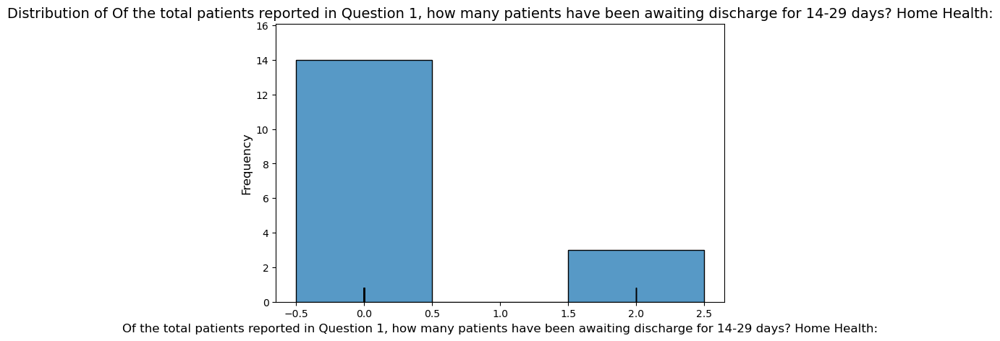

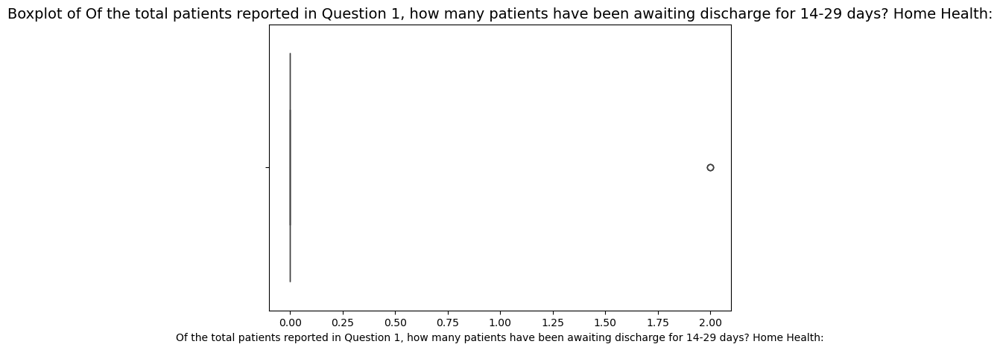

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    16.000000
mean      1.062500
std       2.205108
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       8.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Skilled Nursing Facility (SNF)::
__________________________________________________
                   

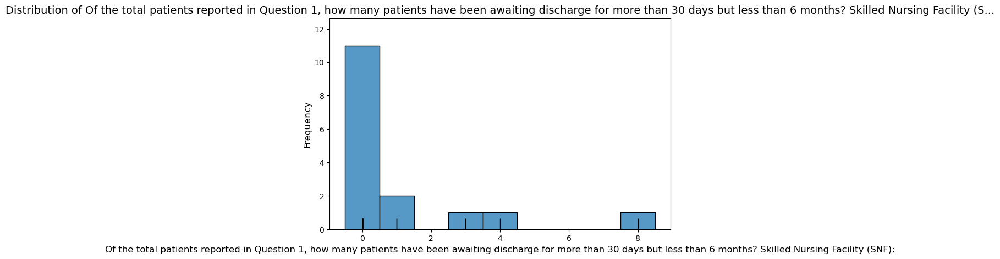

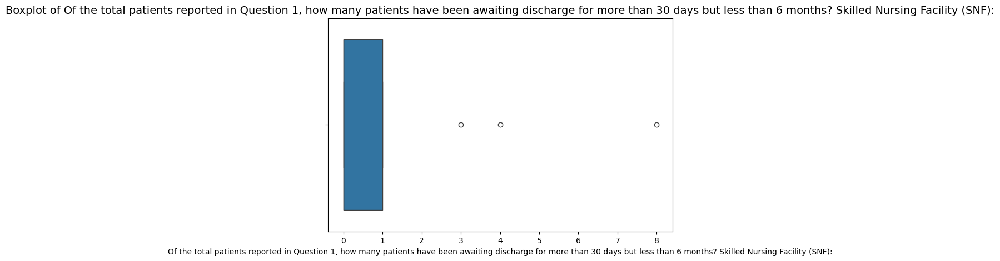

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    19.000000
mean      2.105263
std       4.241262
min       0.000000
25%       0.000000
50%       1.000000
75%       2.000000
max      18.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Long Term Care Hospital (LTC)::
__________________________________________________
                      

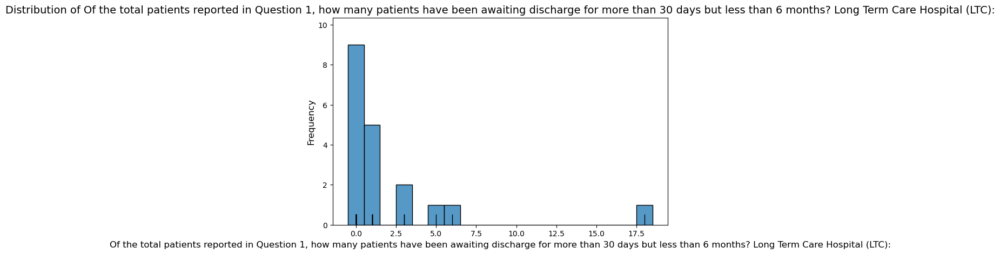

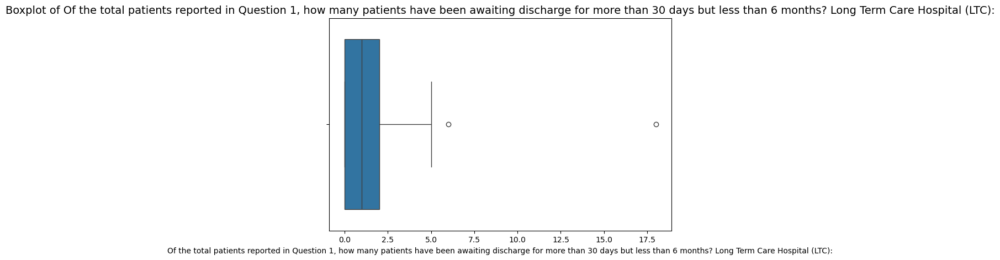

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    17.000000
mean      1.235294
std       2.165912
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       8.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Residential Care Facility (RCF)::
__________________________________________________
                

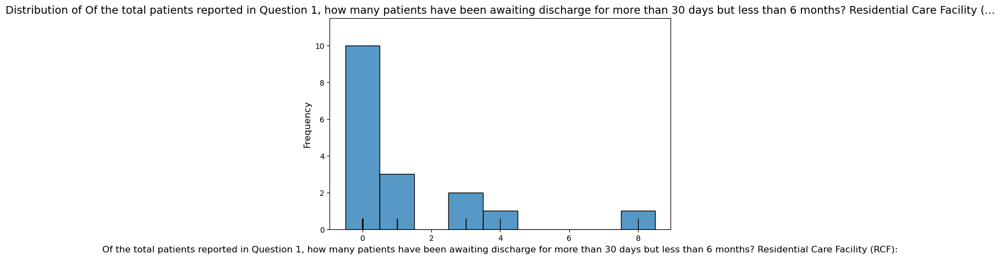

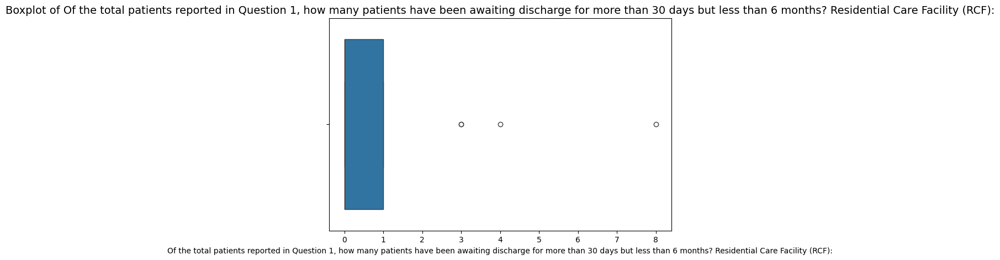

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Home Health:
____________________________________________________________________________________________________
count    17.000000
mean      0.117647
std       0.485071
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 30 days but less than 6 months? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (

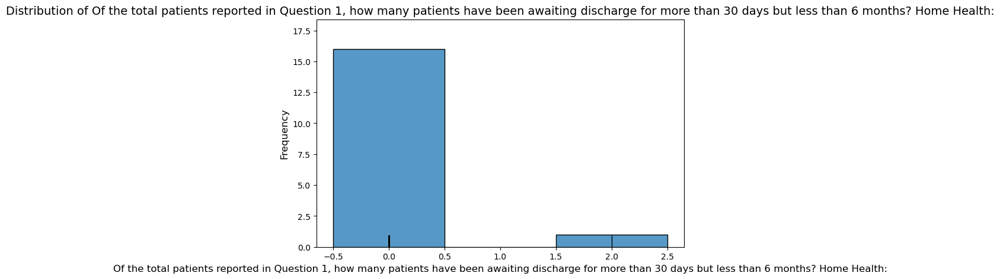

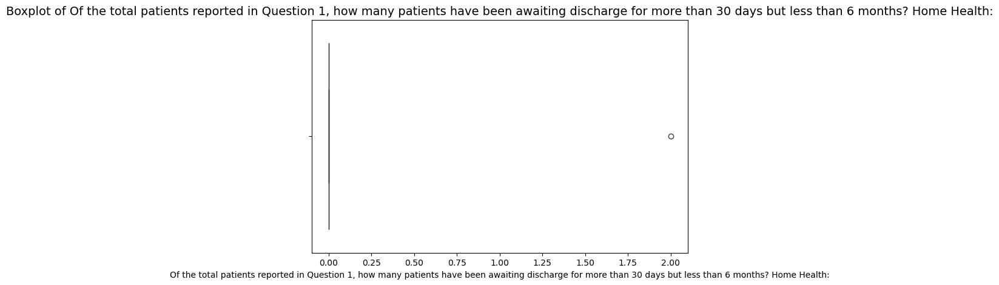

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    17.000000
mean      0.117647
std       0.332106
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Skilled Nursing Facility (SNF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the

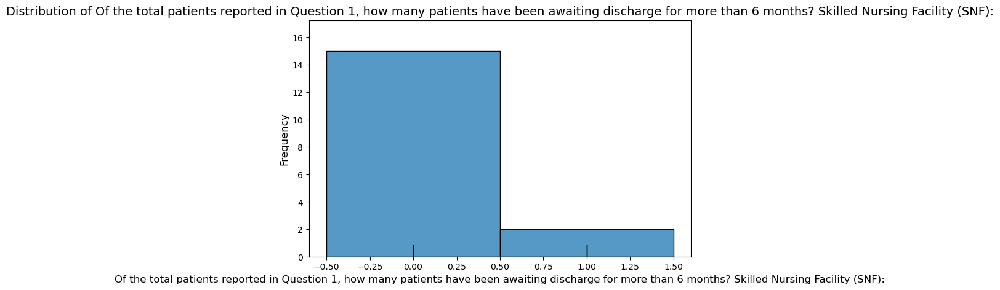

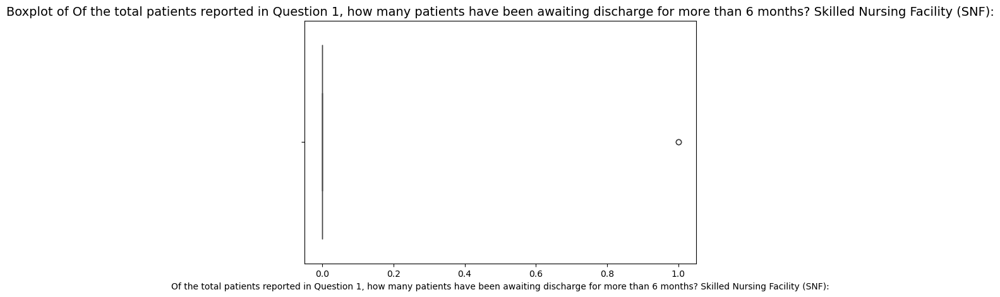

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    18.000000
mean      0.277778
std       0.826442
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Long Term Care Hospital (LTC)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the to

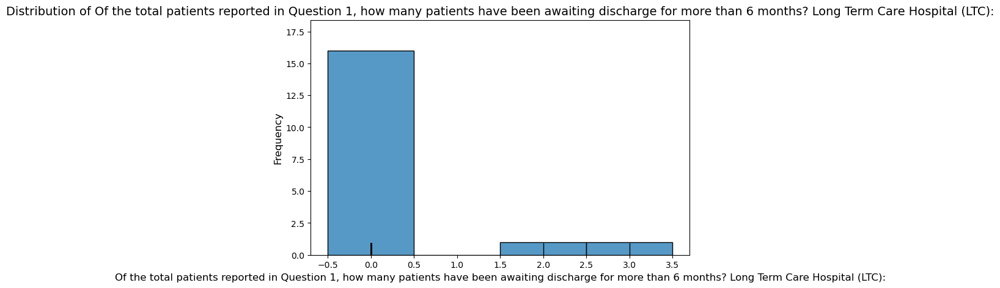

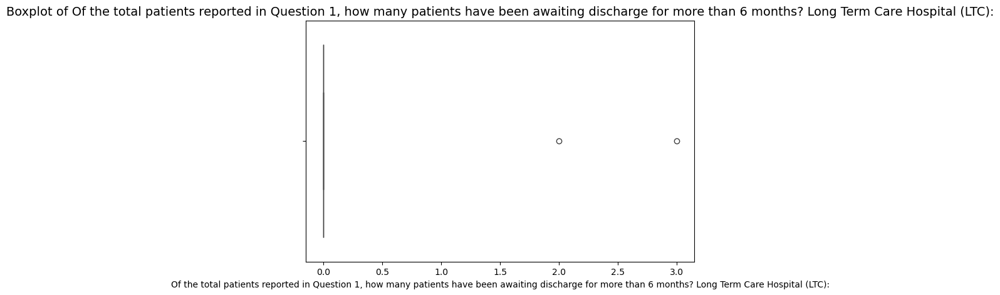

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    18.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Residential Care Facility (RCF)::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 

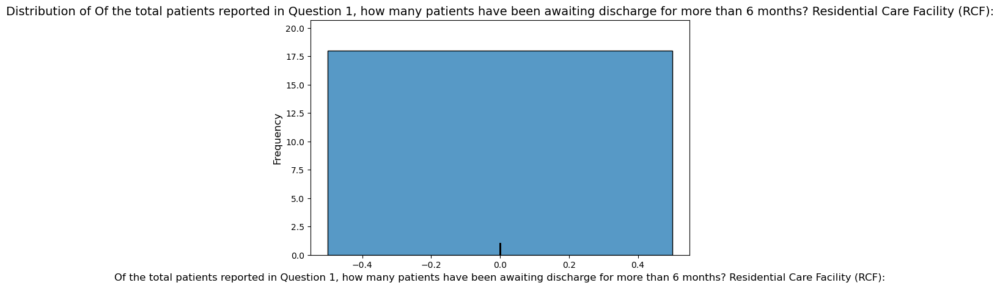

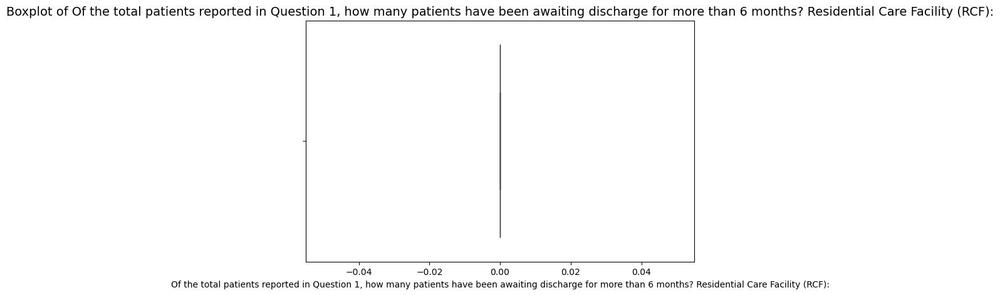

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Home Health:
____________________________________________________________________________________________________
count    18.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Home Health:, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many patients have been awaiting discharge for more than 6 months? Home Health::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0                     

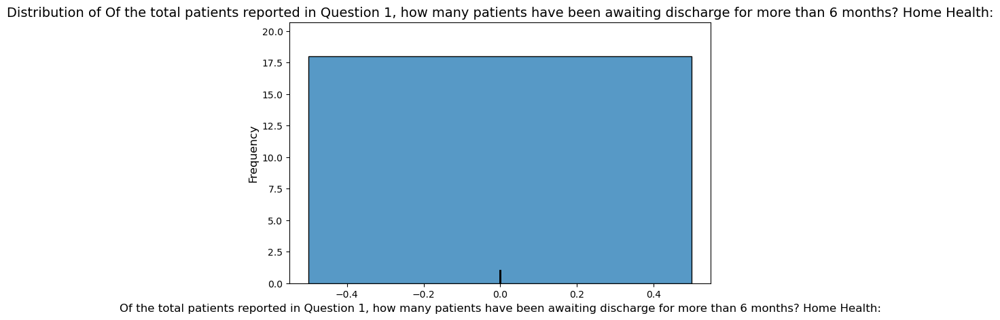

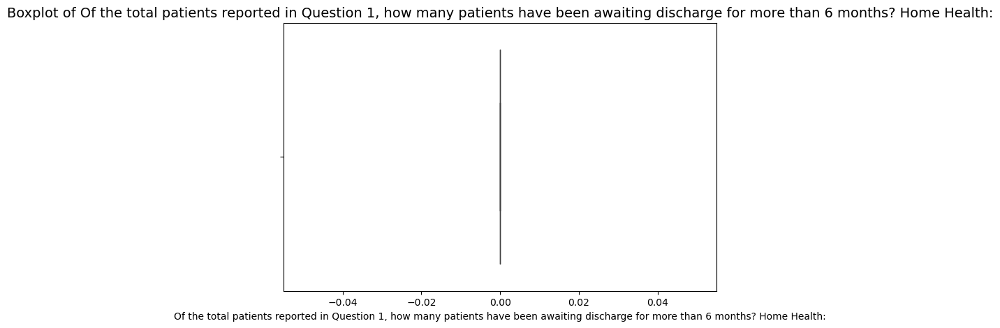

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      3.500000
std       5.482028
min       0.000000
25%       0.000000
50%       2.000000
75%       4.000000
max      24.000000
Name: Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many require short-term rehabilitation beds in SNFs? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0  

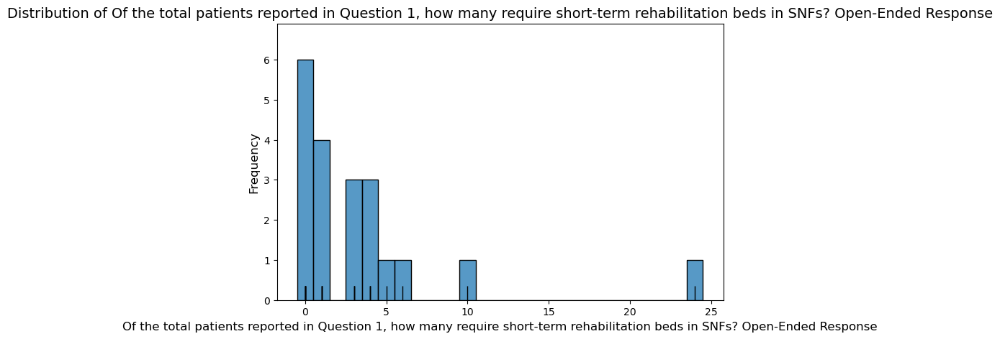

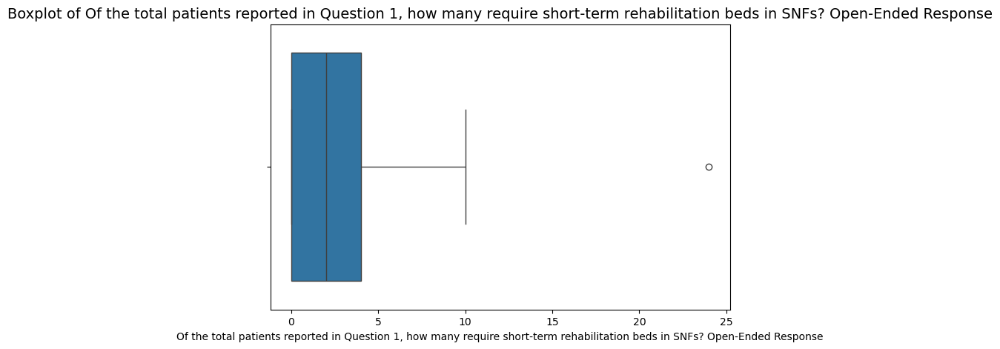

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      5.684211
std      12.360567
min       0.000000
25%       0.000000
50%       3.000000
75%       5.500000
max      55.000000
Name: Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many require the additional PT/OT before they can be discharged to a SNF/LTC/RCF/Home Care? Open-Ended Response:
__________________________________________________
                                              

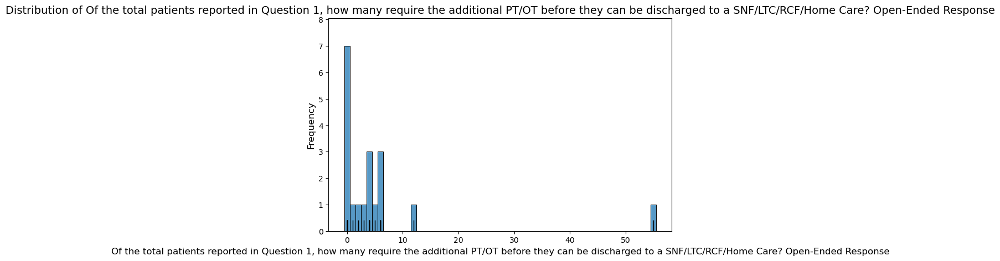

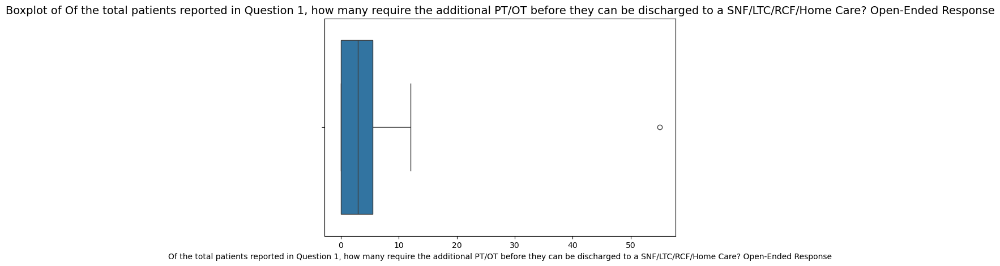

____________________________________________________________________________________________________
Attribute: Of the total patients reported in Question 1, how many require long-term care beds in SNFs? Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      2.105263
std       2.884725
min       0.000000
25%       0.000000
50%       1.000000
75%       3.000000
max      11.000000
Name: Of the total patients reported in Question 1, how many require long-term care beds in SNFs? Open-Ended Response, dtype: float64


Frequency Distribution for Of the total patients reported in Question 1, how many require long-term care beds in SNFs? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of the total patients reported in Question 1, h...                            
0.0                                   

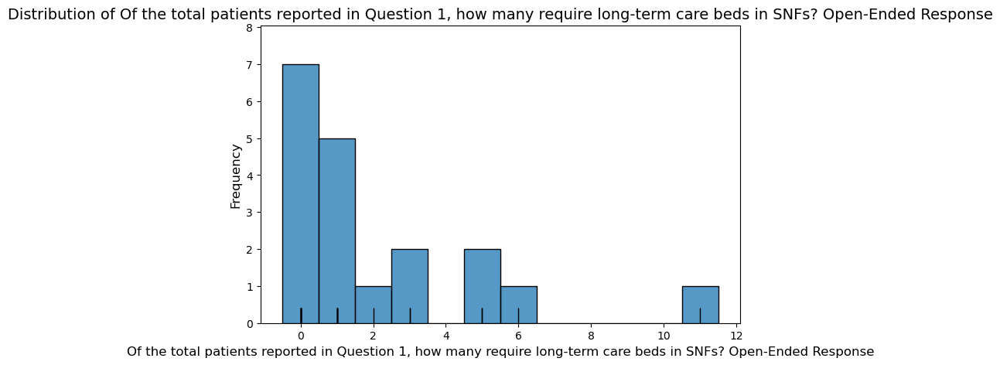

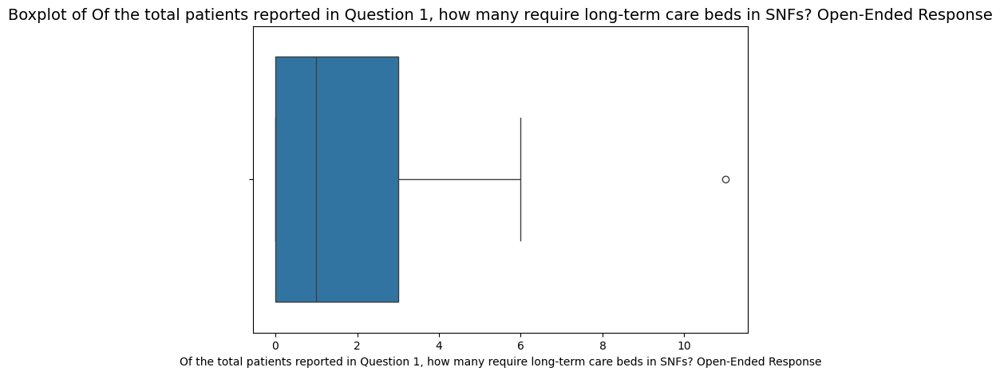

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to SNF beds with geri-psych capabilities: Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.736842
std       1.284182
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       5.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to SNF beds with geri-psych capabilities: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number awaiting discharge to SNF beds with geri-psych capabilities: Open-Ended Response:
__________________________________________________
                                           

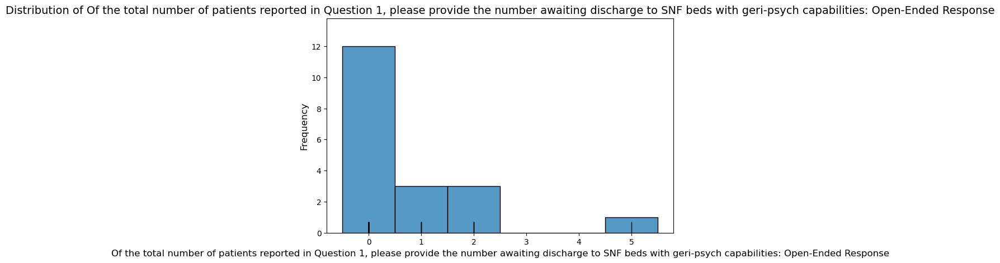

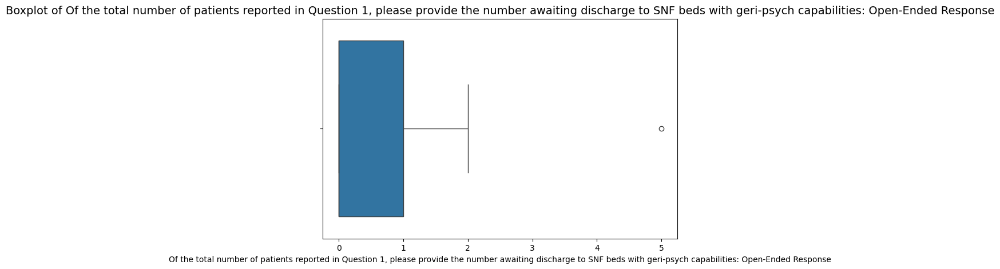

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge who require SNF care and tracheostomy and percutaneous endoscopic gastrostomy (ie. "trached & peged"): Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.315789
std       0.582393
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       2.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge who require SNF care and tracheostomy and percutaneous endoscopic gastrostomy (ie. "trached & peged"): Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge

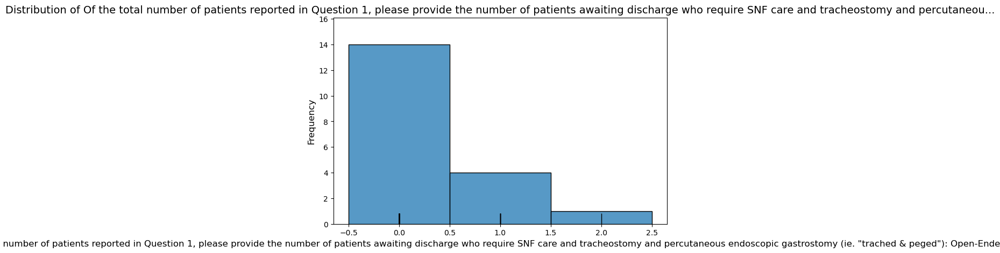

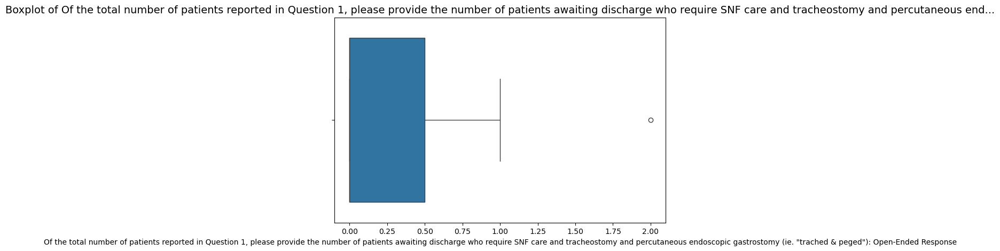

____________________________________________________________________________________________________
Attribute: Of the total number of patients report in Question 1, please provide the number of patients awaiting discharge who require SNF care and long-term management of a vent. Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.210526
std       0.535303
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total number of patients report in Question 1, please provide the number of patients awaiting discharge who require SNF care and long-term management of a vent. Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients report in Question 1, please provide the number of patients awaiting discharge who require SNF care and long-term management of a vent. Open-Ended Response:
___________________

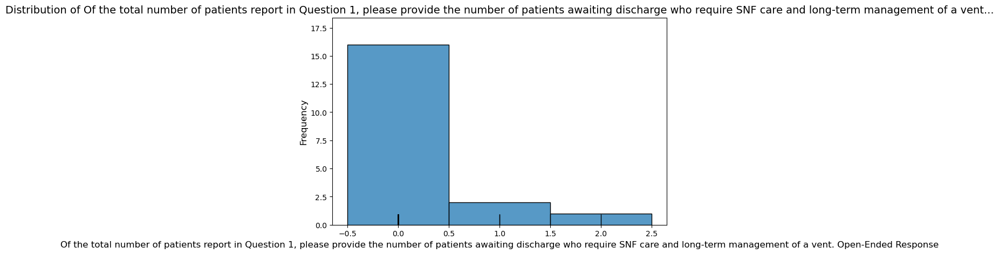

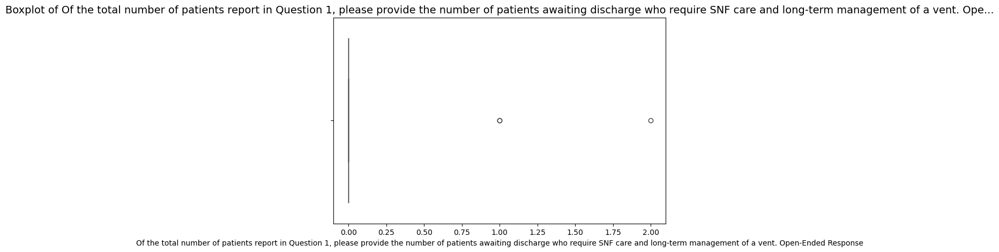

____________________________________________________________________________________________________
Attribute: Of the the total number of patients reported in Question 1, please provide the number of patients with bariatric concerns (>300lbs) awaiting discharge who require SNF care: Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.368421
std       1.011628
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       4.000000
Name: Of the the total number of patients reported in Question 1, please provide the number of patients with bariatric concerns (>300lbs) awaiting discharge who require SNF care: Open-Ended Response, dtype: float64


Frequency Distribution for Of the the total number of patients reported in Question 1, please provide the number of patients with bariatric concerns (>300lbs) awaiting discharge who require SNF care: Open-Ended Response:
____

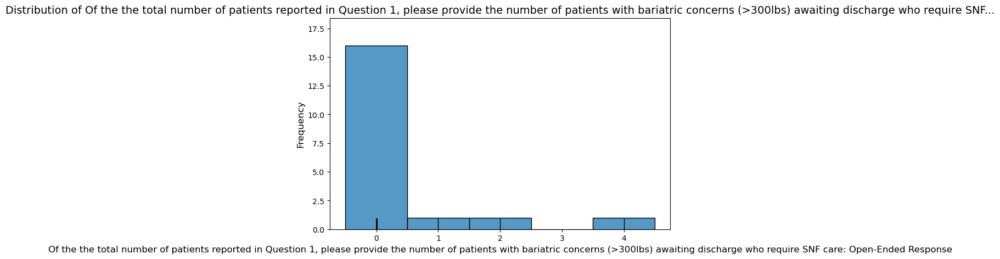

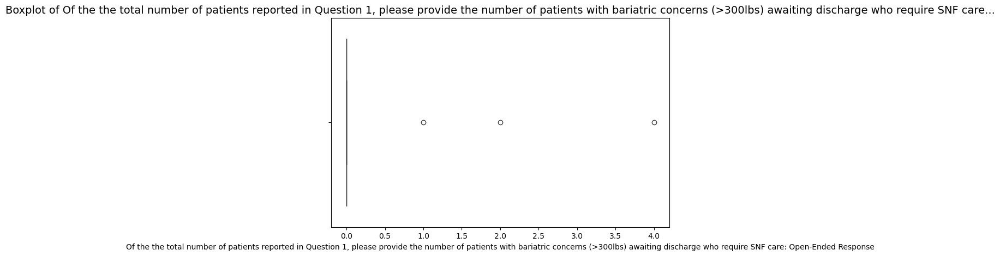

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients with dementia diagnoses awaiting discharge who require SNF care in a secure facility: Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      1.473684
std       1.711673
min       0.000000
25%       0.000000
50%       1.000000
75%       2.500000
max       5.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients with dementia diagnoses awaiting discharge who require SNF care in a secure facility: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients with dementia diagnoses awaiting discharge who require SNF care in a secure facility: Open

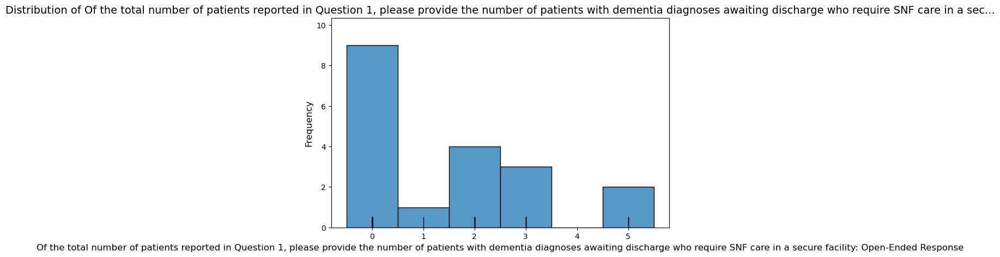

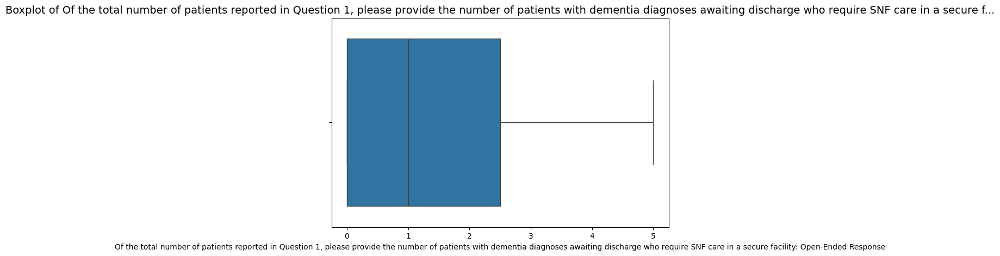

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients who are waiting for placement due to an inability to find an appropriate facility within their geographic area: Open-Ended Response
____________________________________________________________________________________________________
count    20.000000
mean      4.750000
std       7.173599
min       0.000000
25%       0.000000
50%       1.000000
75%       8.250000
max      24.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients who are waiting for placement due to an inability to find an appropriate facility within their geographic area: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients who are waiting for placement due to a

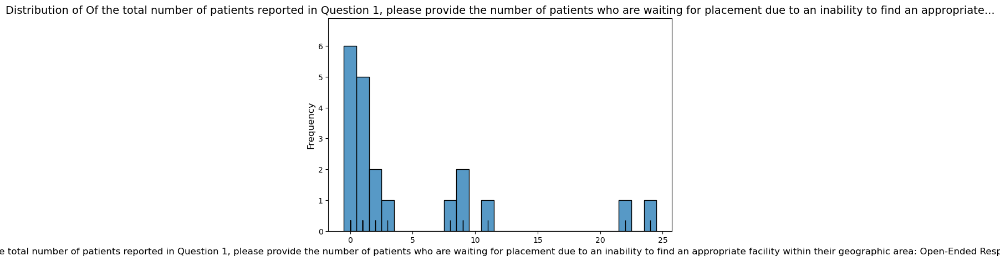

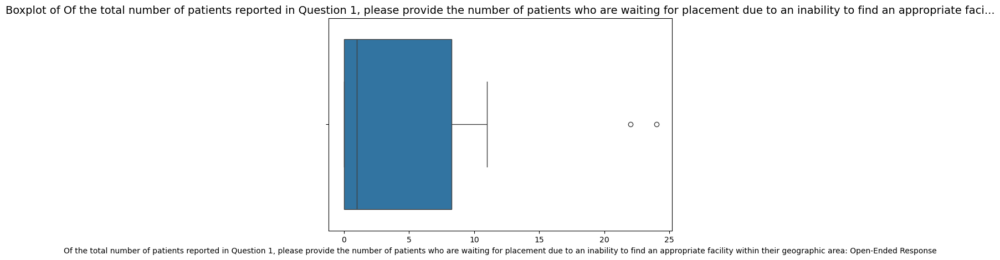

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    19.000000
mean      0.105263
std       0.315302
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Skilled Nursing Facility (SNF):, dtype: float64


Frequency

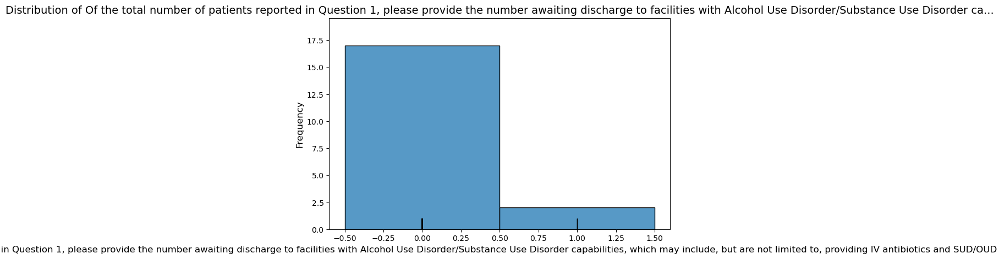

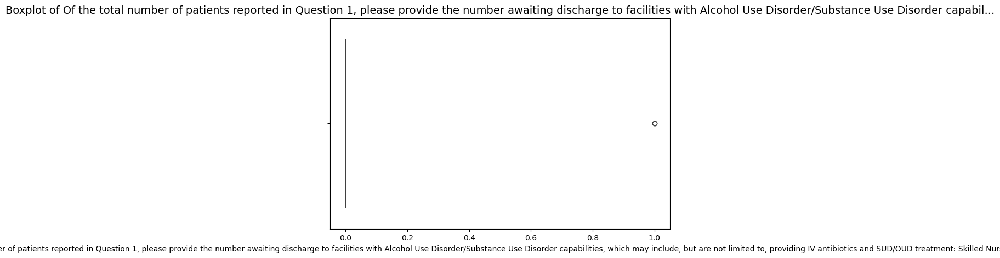

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    18.000000
mean      0.166667
std       0.514496
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Long Term Care Hospital (LTC):, dtype: float64


Frequency D

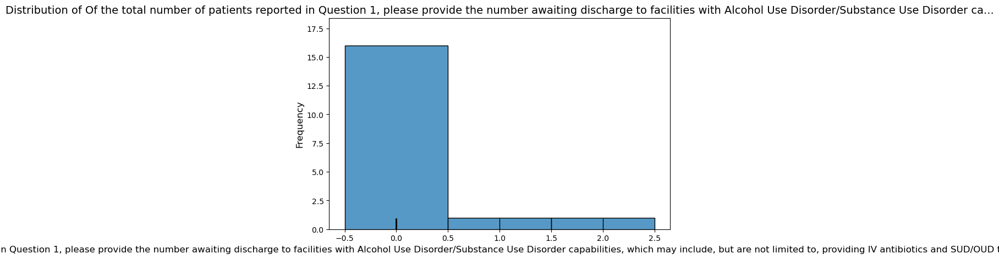

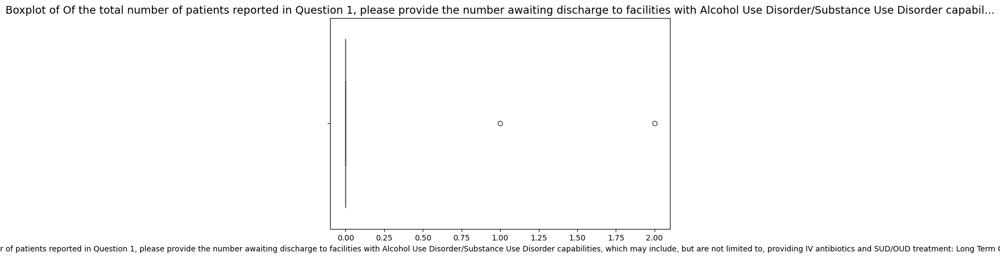

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    18.000000
mean      0.333333
std       0.840168
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Residential Care Facility (RCF):, dtype: float64


Frequen

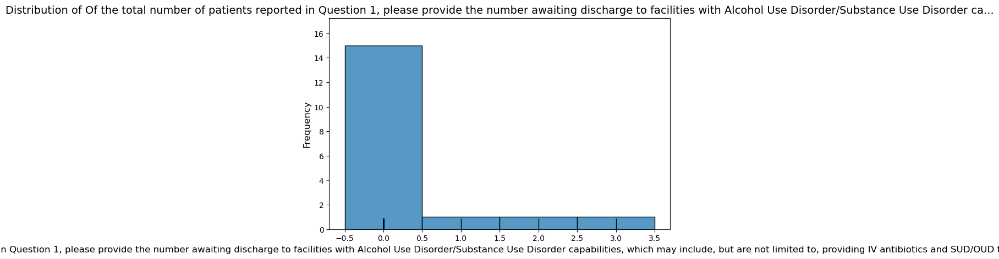

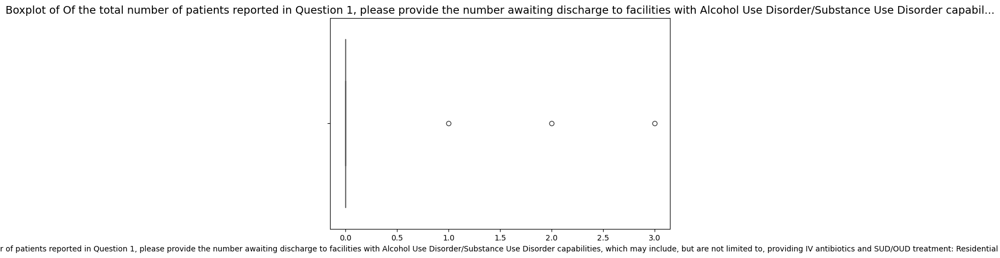

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Home Health:
____________________________________________________________________________________________________
count    18.000000
mean      0.055556
std       0.235702
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment: Home Health:, dtype: float64


Frequency Distribution for Of the total number 

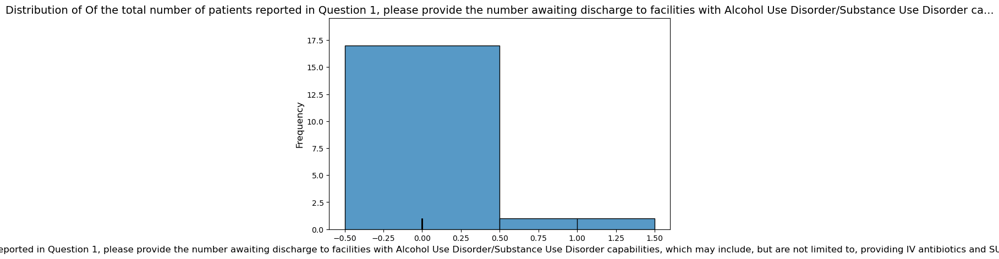

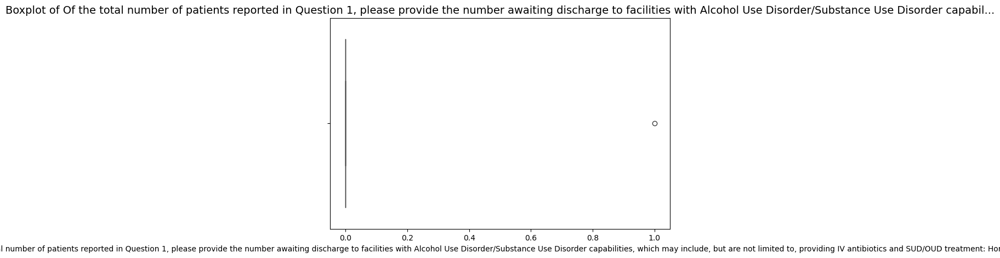

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Skilled Nursing Facility (SNF):
____________________________________________________________________________________________________
count    19.000000
mean      0.105263
std       0.315302
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Skilled Nursing Facility (SNF):, dtype: float64


Frequency Distribution for Of the total number of p

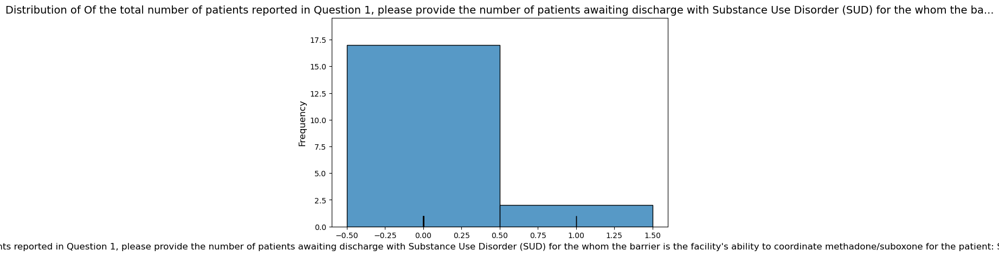

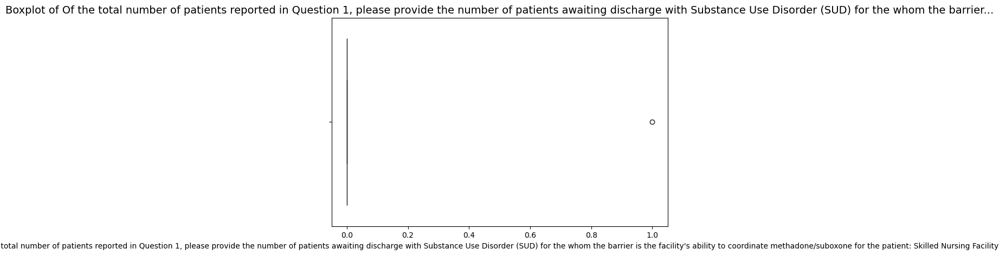

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Long Term Care Hospital (LTC):
____________________________________________________________________________________________________
count    18.000000
mean      0.055556
std       0.235702
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Long Term Care Hospital (LTC):, dtype: float64


Frequency Distribution for Of the total number of pat

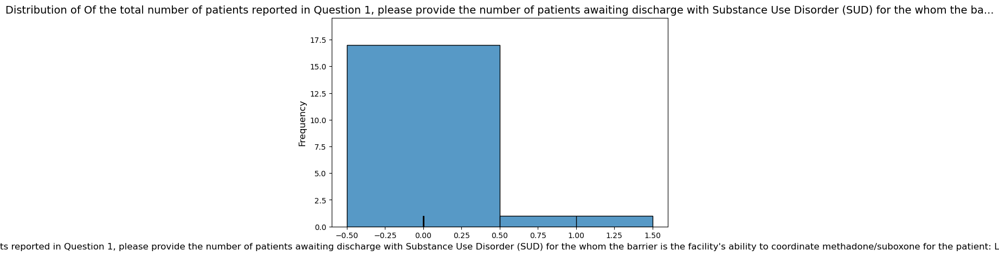

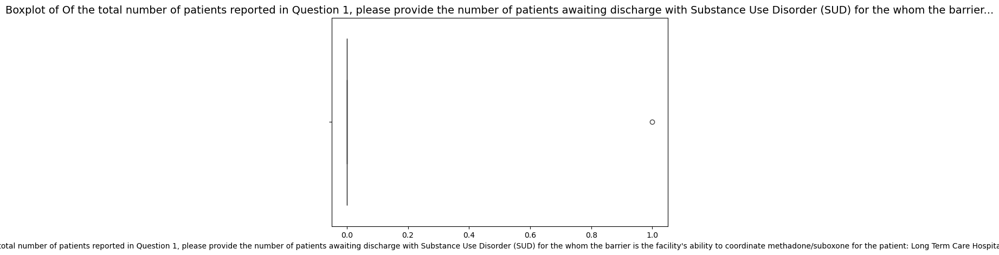

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Residential Care Facility (RCF):
____________________________________________________________________________________________________
count    18.000000
mean      0.055556
std       0.235702
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Residential Care Facility (RCF):, dtype: float64


Frequency Distribution for Of the total number of

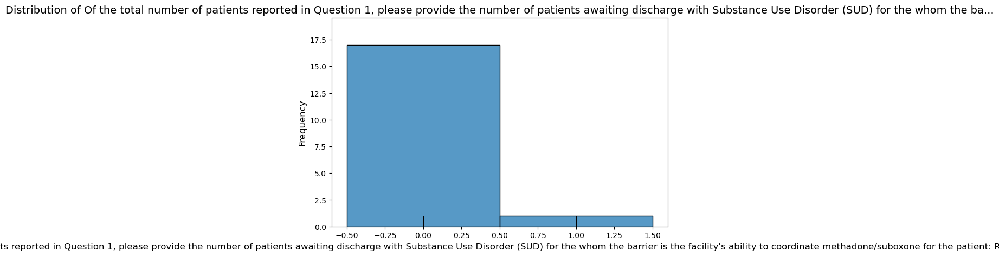

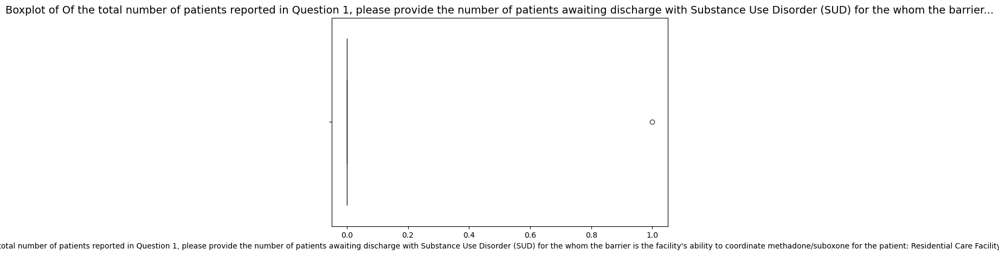

____________________________________________________________________________________________________
Attribute: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Home Health:
____________________________________________________________________________________________________
count    18.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient: Home Health:, dtype: float64


Frequency Distribution for Of the total number of patients reported in Question 1, please provide the number of patients awaiting

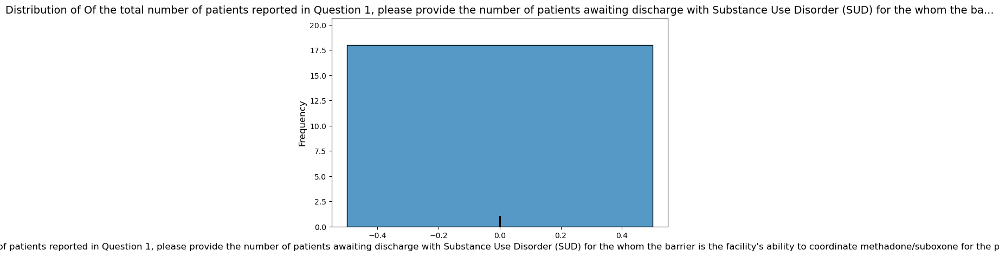

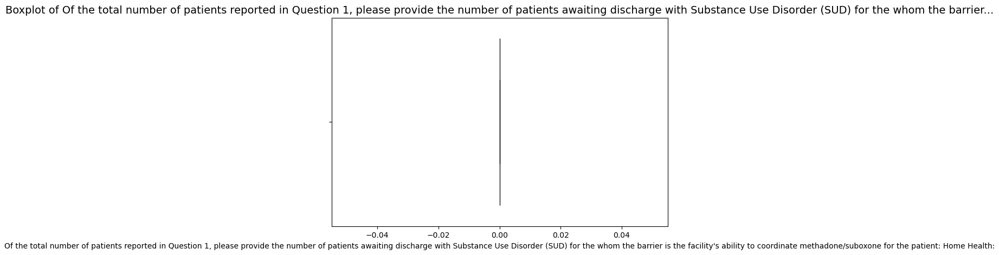

____________________________________________________________________________________________________
Attribute: Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the number of patients with confirmed* COVID-19?* Confirmed COVID-19: Patients who had a positive COVID-19 PCR test or antigen test. Please include both patients who were admitted with a primary COVID-19 diagnosis, as well as patients with an incidental COVID diagnosis (i.e., admitted for a Maine Hospital Association Patient Throughput Survey Section 1: Questions Related to Patients Awaiting Discharge to SNF, LTC, RCF, and Home Health different reason but subsequently tested positive). Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.421053
std       0.961237
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       3.000000
Name: Of the number of patients awaitin

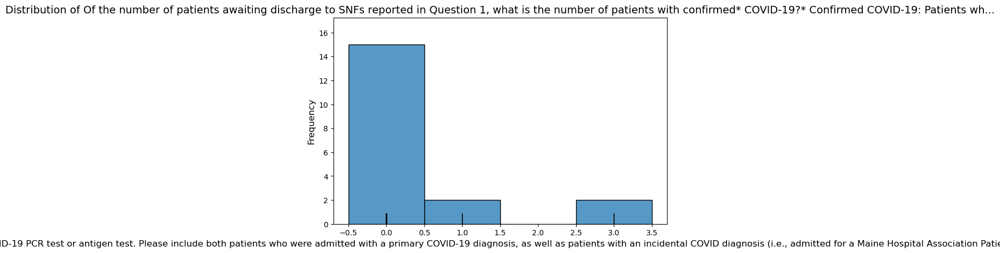

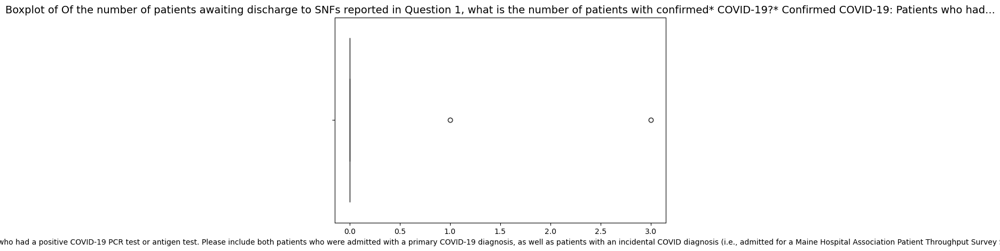

____________________________________________________________________________________________________
Attribute: Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the total number of patients who are COVID-19 recovered awaiting discharge to SNFs: Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.263158
std       0.452414
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       1.000000
Name: Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the total number of patients who are COVID-19 recovered awaiting discharge to SNFs: Open-Ended Response, dtype: float64


Frequency Distribution for Of the number of patients awaiting discharge to SNFs reported in Question 1, what is the total number of patients who are COVID-19 recovered awaiting discharge to SNFs: Open-Ended Response:
________________

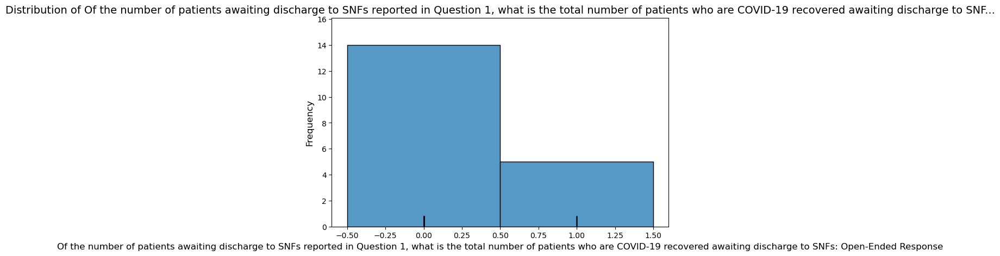

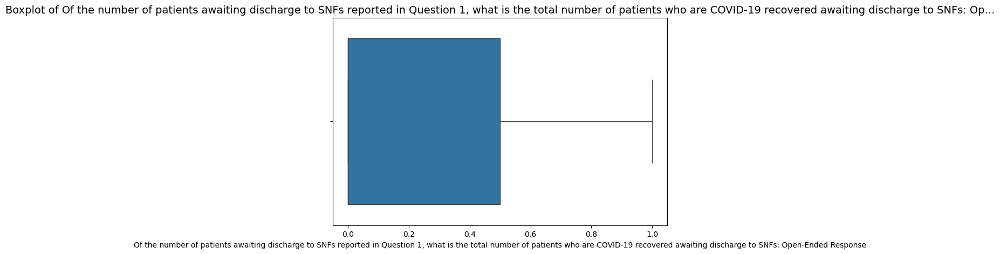

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Denial of request for authorization from insurer
____________________________________________________________________________________________________
count    21.000000
mean      5.142857
std       3.350906
min       1.000000
25%       2.000000
50%       4.000000
75%       9.000000
max      11.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Denial of request fo

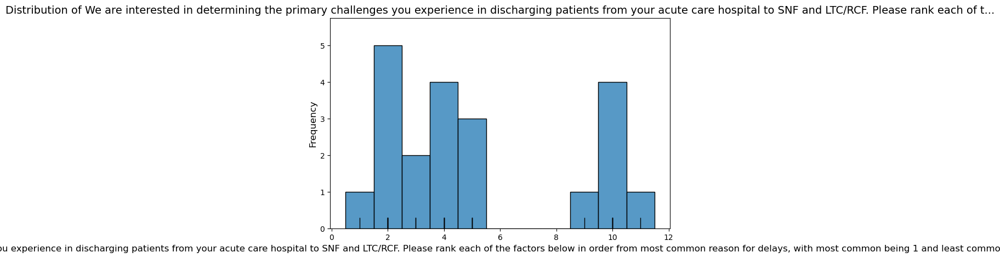

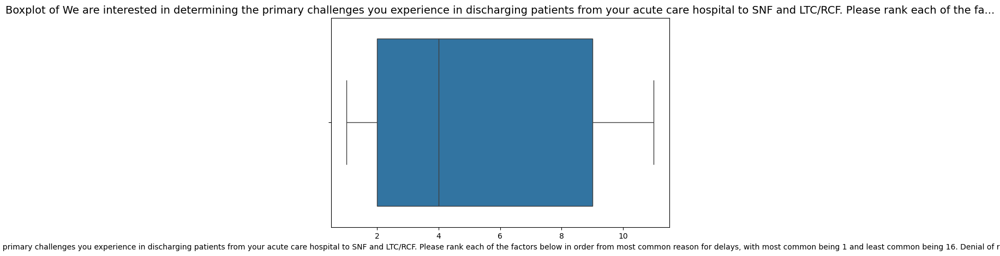

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Delayed response from insurer
____________________________________________________________________________________________________
count    21.000000
mean      5.523810
std       4.285079
min       1.000000
25%       2.000000
50%       4.000000
75%       8.000000
max      14.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Delayed response from insurer, dtype: f

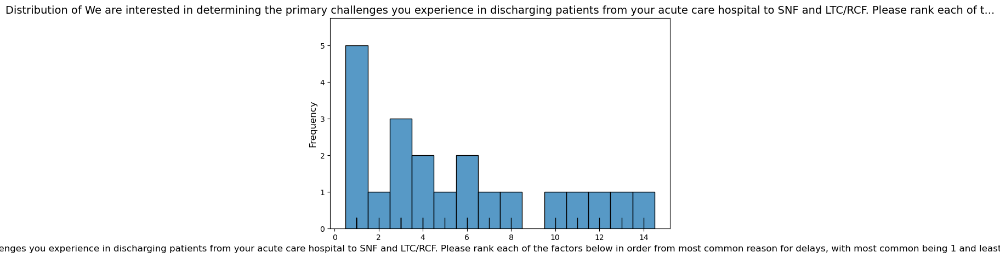

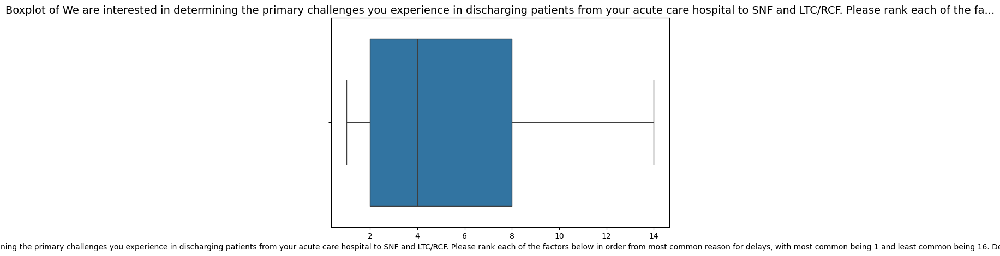

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Inadequate post-acute network
____________________________________________________________________________________________________
count    21.000000
mean      5.714286
std       3.164536
min       2.000000
25%       3.000000
50%       5.000000
75%       8.000000
max      12.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Inadequate post-acute network, dtype: f

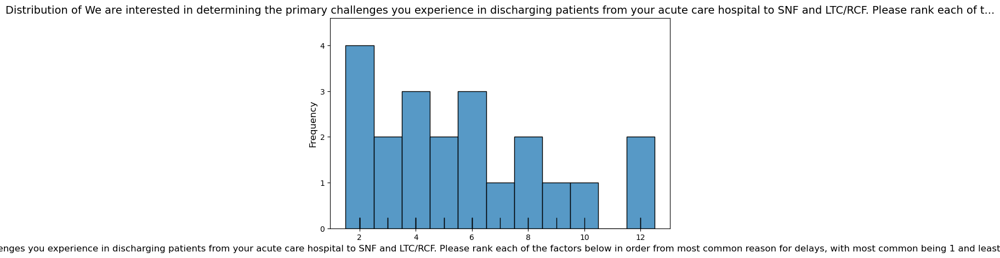

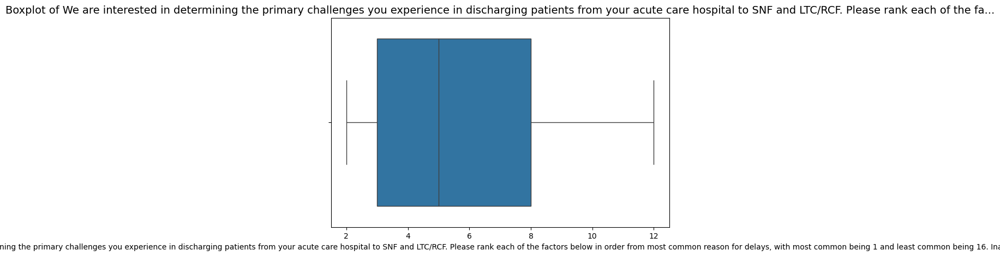

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Insurer does not provide post-acute coverage
____________________________________________________________________________________________________
count    21.000000
mean      8.904762
std       3.871754
min       1.000000
25%       7.000000
50%       9.000000
75%      11.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Insurer does not provide

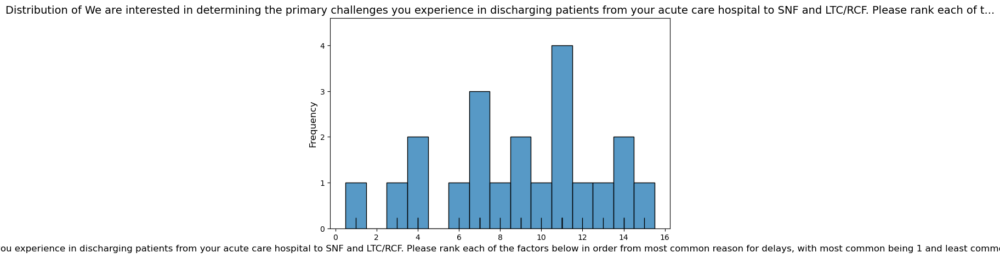

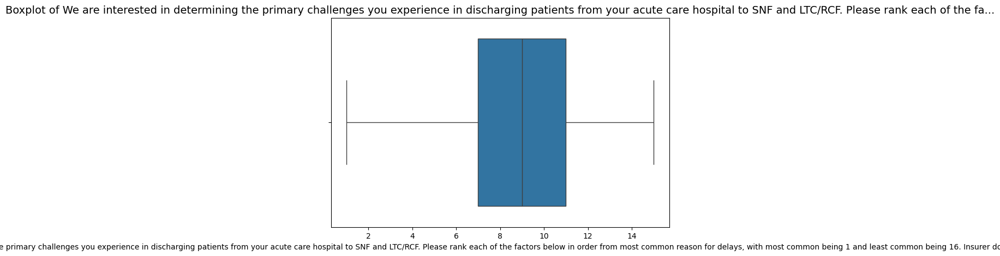

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID+ status
____________________________________________________________________________________________________
count    21.000000
mean     11.333333
std       3.979112
min       4.000000
25%      10.000000
50%      12.000000
75%      15.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID+ status, dtype: float64


Frequency Distribution 

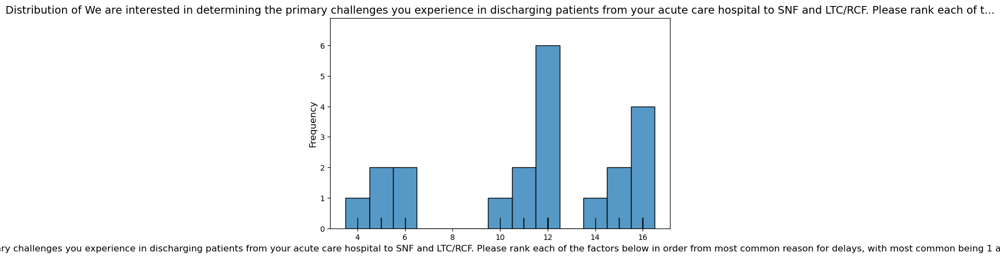

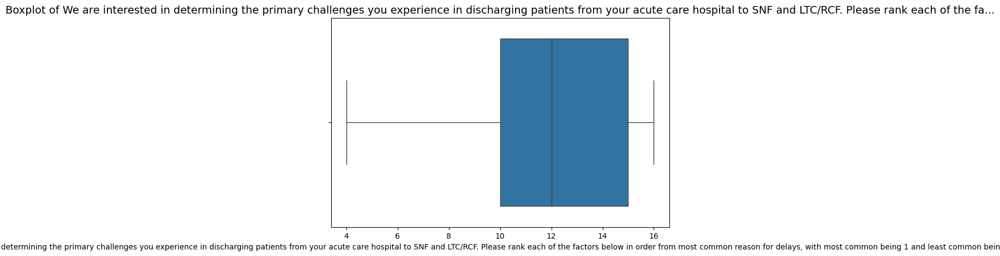

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID recovered status
____________________________________________________________________________________________________
count    21.000000
mean     12.619048
std       2.991257
min       6.000000
25%      12.000000
50%      13.000000
75%      15.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. COVID recovered status, dtype: float64


Frequ

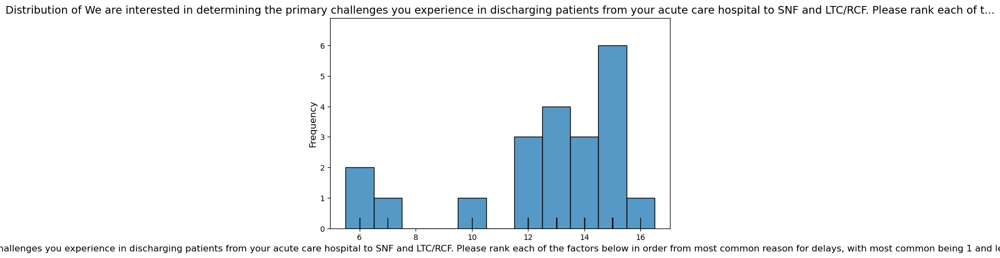

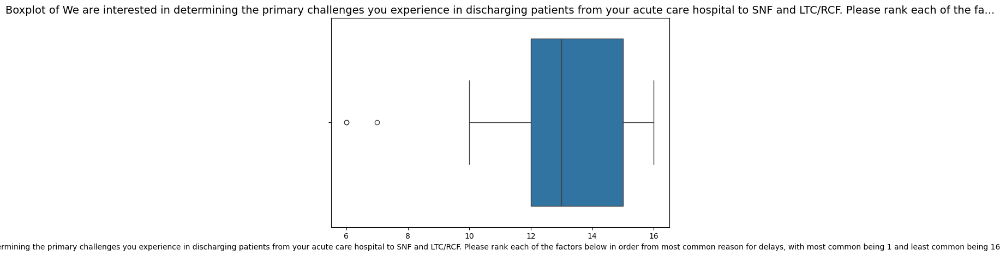

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Unvaccinated status
____________________________________________________________________________________________________
count    21.000000
mean     13.619048
std       2.616796
min       7.000000
25%      13.000000
50%      14.000000
75%      16.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Unvaccinated status, dtype: float64


Frequency D

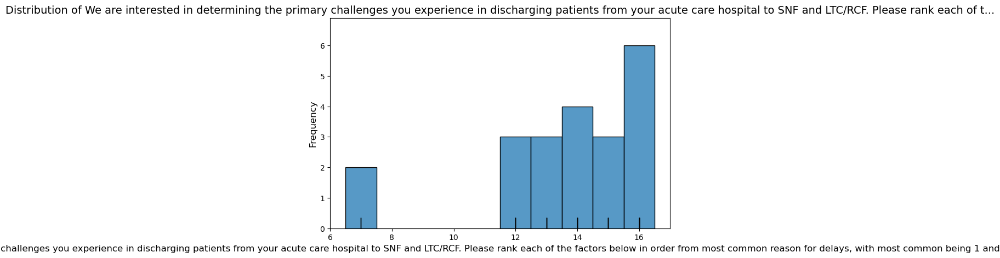

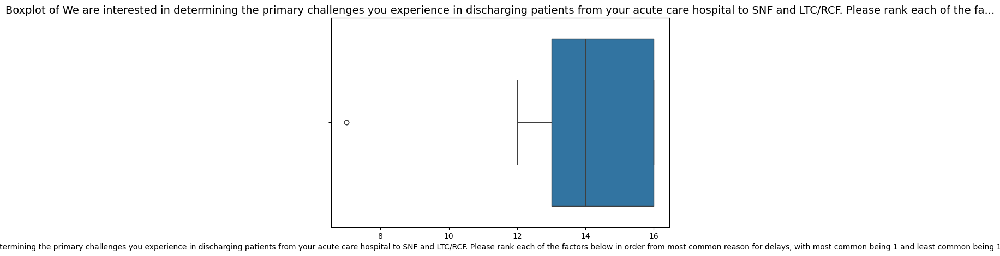

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Staffing/capacity constraints at post-acute care facilities
____________________________________________________________________________________________________
count    21.000000
mean      5.619048
std       3.721239
min       1.000000
25%       3.000000
50%       4.000000
75%       8.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Staffing/

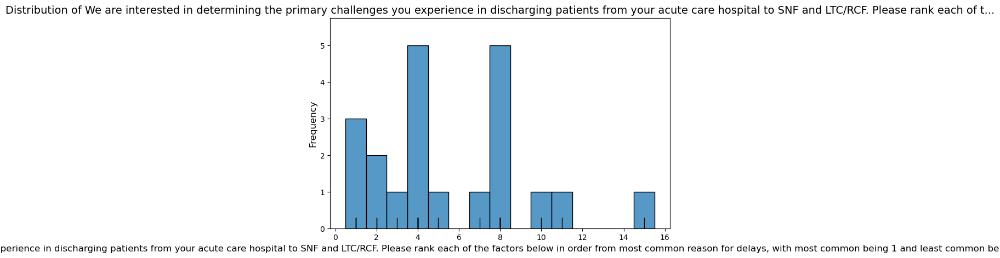

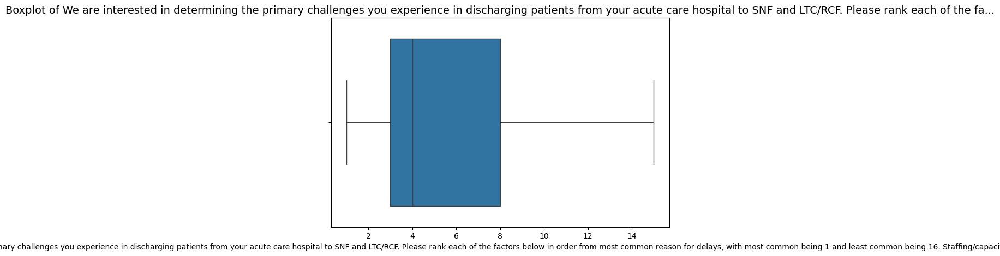

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Need for specialized BH/SUD services
____________________________________________________________________________________________________
count    21.000000
mean      8.428571
std       3.775863
min       1.000000
25%       6.000000
50%       9.000000
75%      11.000000
max      14.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Need for specialized BH/SUD serv

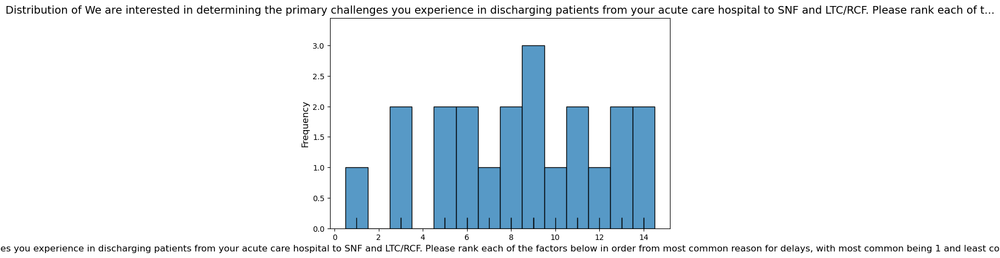

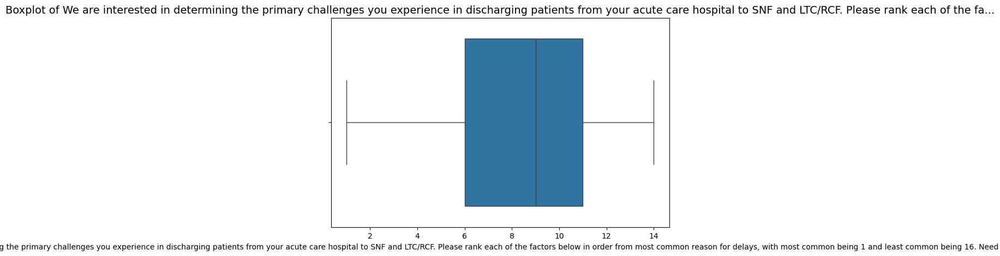

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Transportation unavailable
____________________________________________________________________________________________________
count    21.000000
mean      9.523810
std       3.280534
min       4.000000
25%       7.000000
50%       9.000000
75%      11.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Transportation unavailable, dtype: float64

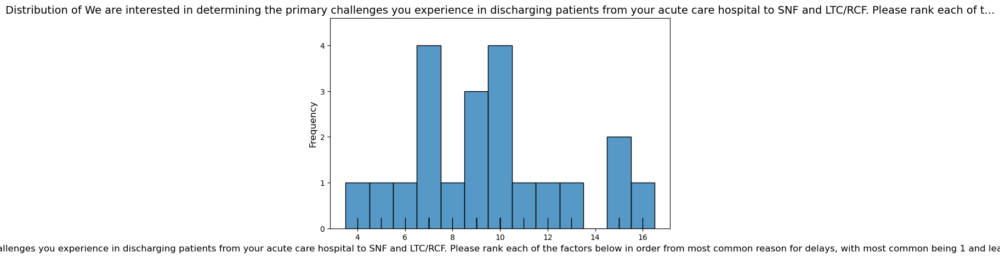

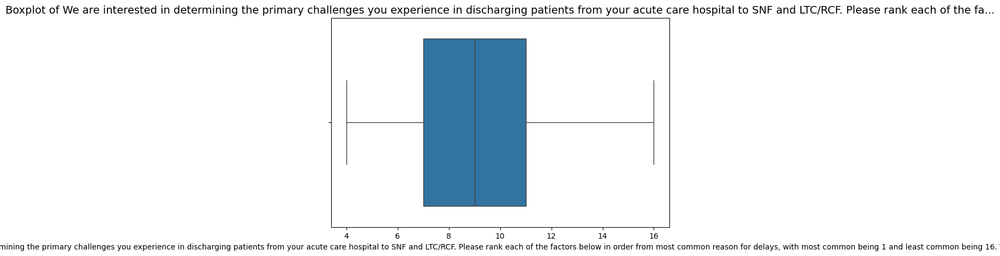

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of facility within patients desired geographic area.
____________________________________________________________________________________________________
count    21.000000
mean      5.619048
std       3.801002
min       1.000000
25%       3.000000
50%       4.000000
75%       9.000000
max      13.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of fac

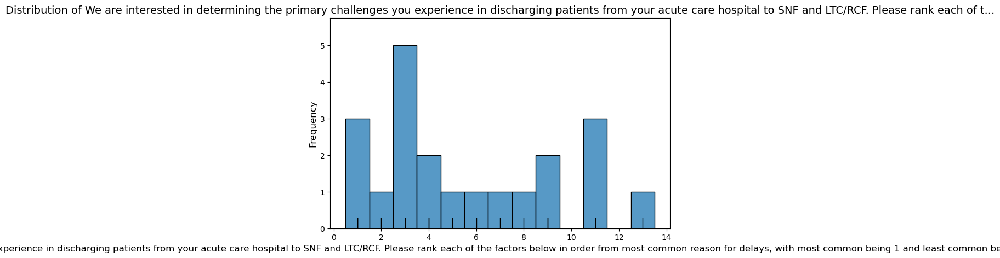

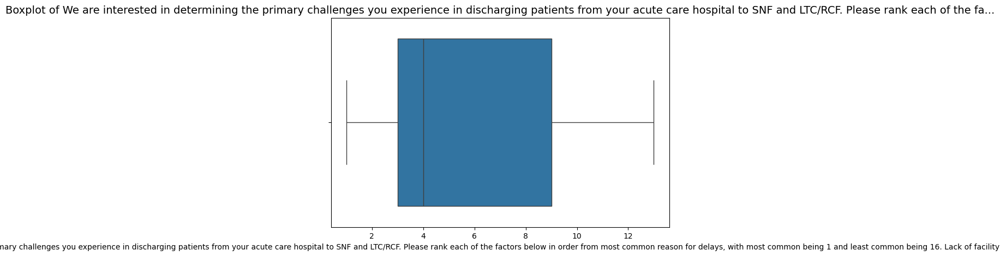

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of access to necessary community services
____________________________________________________________________________________________________
count    21.000000
mean      7.476190
std       3.530142
min       1.000000
25%       5.000000
50%       8.000000
75%      10.000000
max      13.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of access to nece

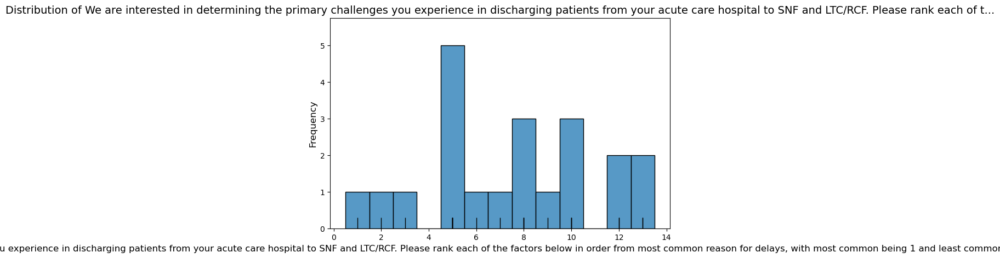

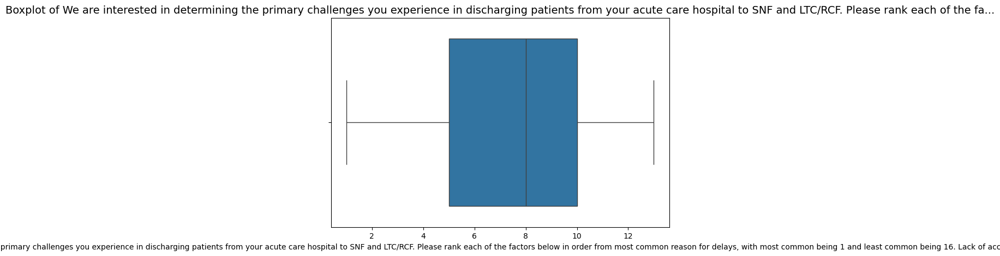

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of guardianship/conservatorship/healthcare proxy
____________________________________________________________________________________________________
count    21.000000
mean      7.238095
std       3.462727
min       2.000000
25%       5.000000
50%       8.000000
75%       9.000000
max      13.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of guardia

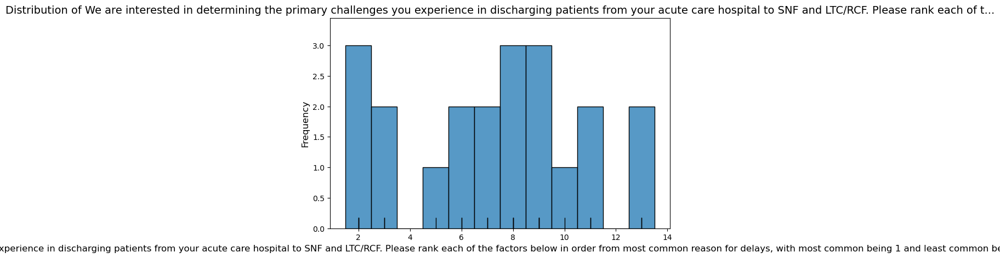

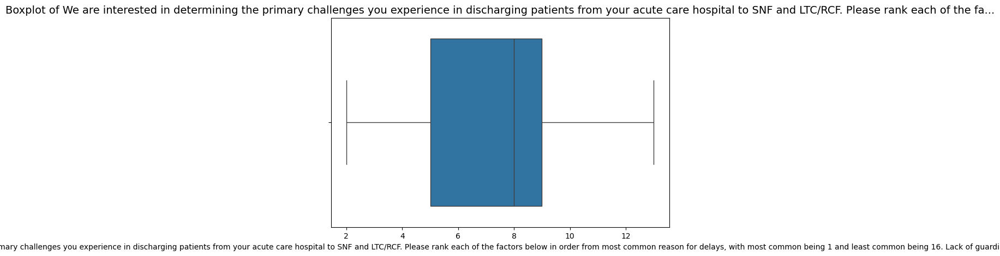

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of secondary insurance
____________________________________________________________________________________________________
count    21.000000
mean     11.857143
std       3.213809
min       3.000000
25%      10.000000
50%      12.000000
75%      14.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Lack of secondary insurance, dtype: float

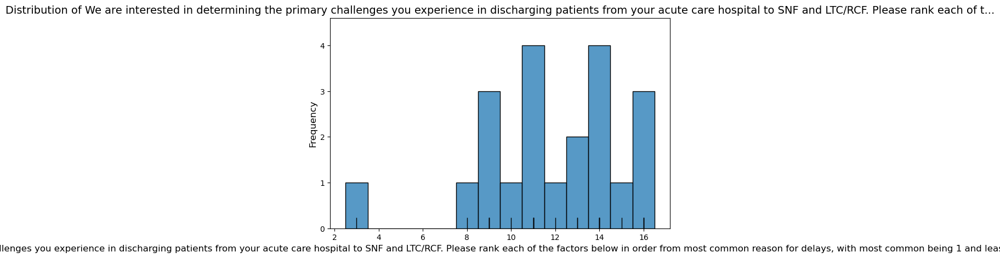

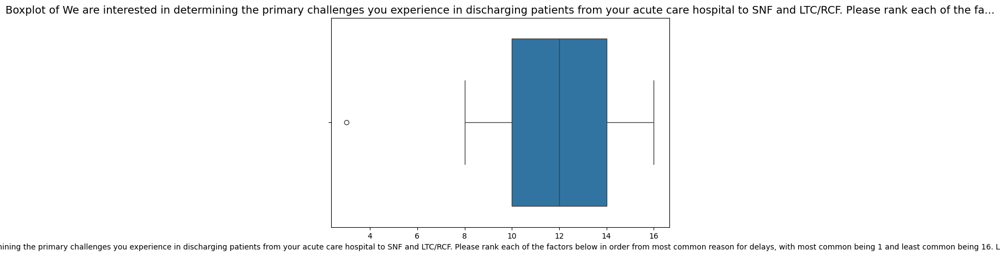

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Waiting for LTC Maine Care (Medicaid) approval
____________________________________________________________________________________________________
count    21.000000
mean      4.714286
std       4.088311
min       1.000000
25%       2.000000
50%       4.000000
75%       6.000000
max      15.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Waiting for LTC Maine 

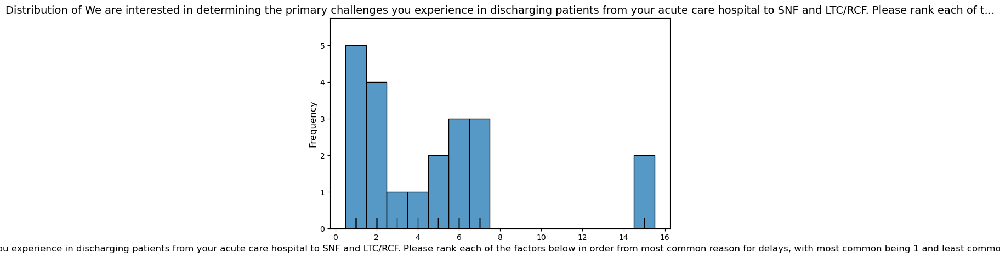

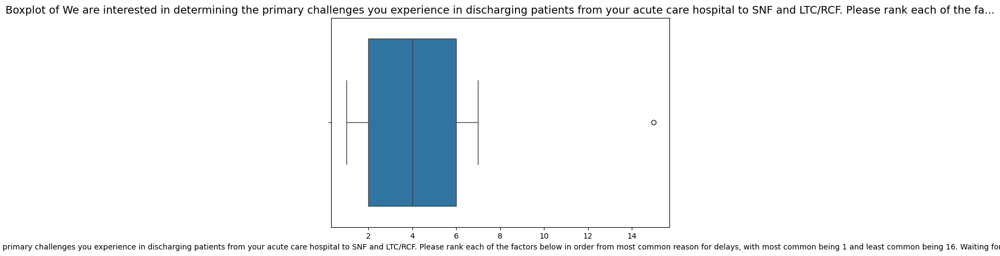

____________________________________________________________________________________________________
Attribute: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Patient has criminal history and/or is a registered sex offender
____________________________________________________________________________________________________
count    21.000000
mean     12.666667
std       4.041452
min       1.000000
25%      10.000000
50%      14.000000
75%      16.000000
max      16.000000
Name: We are interested in determining the primary challenges you experience in discharging patients from your acute care hospital to SNF and LTC/RCF. Please rank each of the factors below in order from most common reason for delays, with most common being 1 and least common being 16. Pati

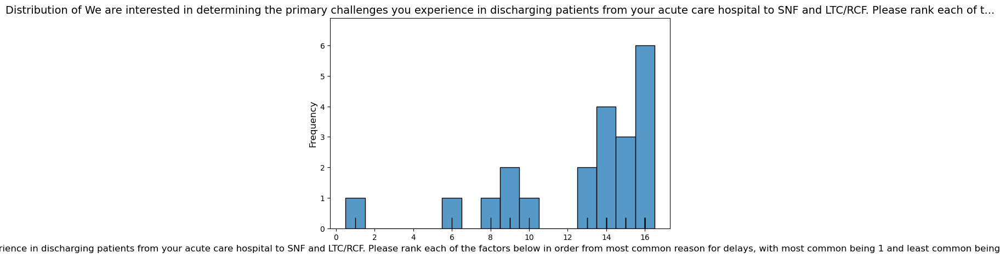

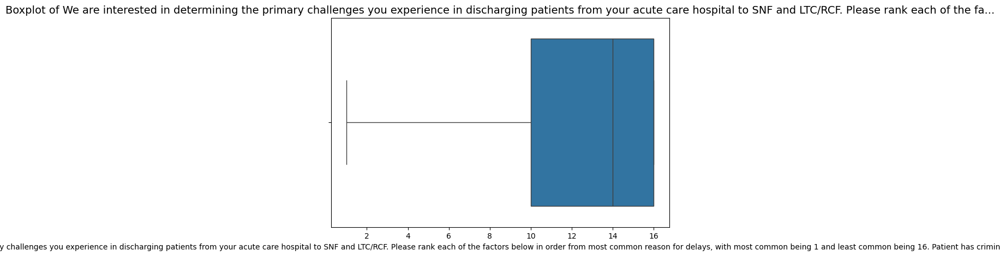

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

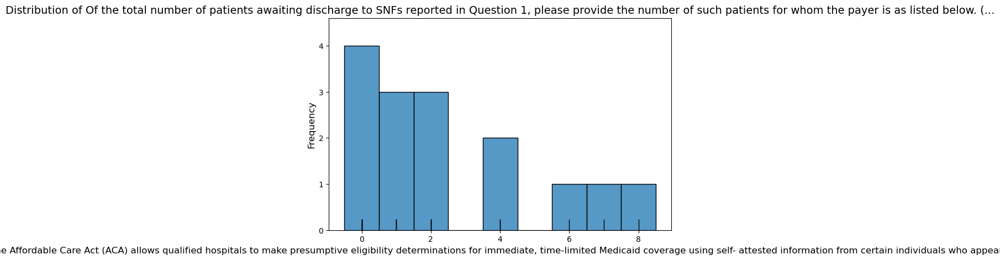

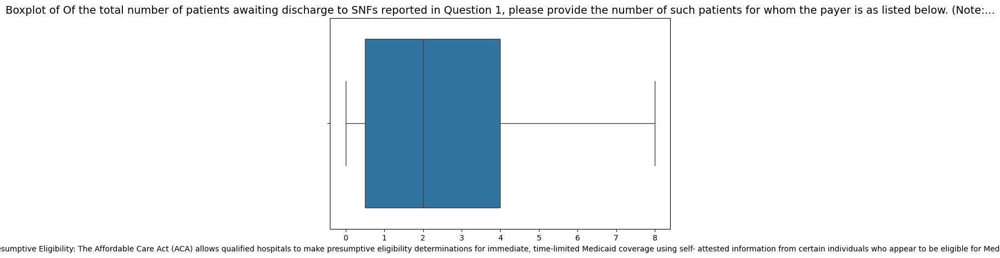

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

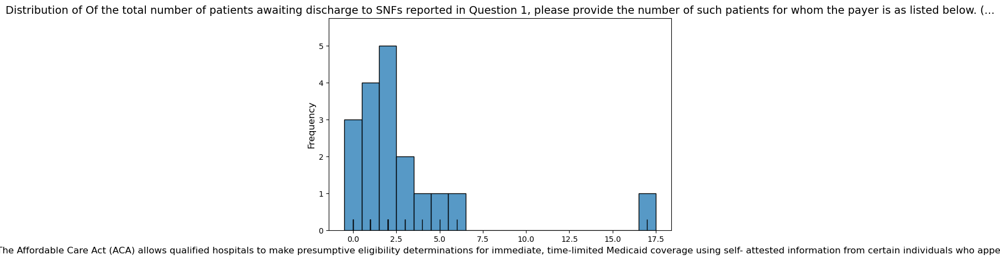

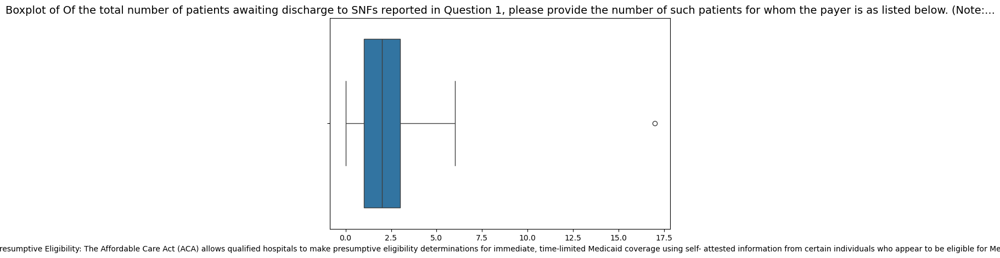

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

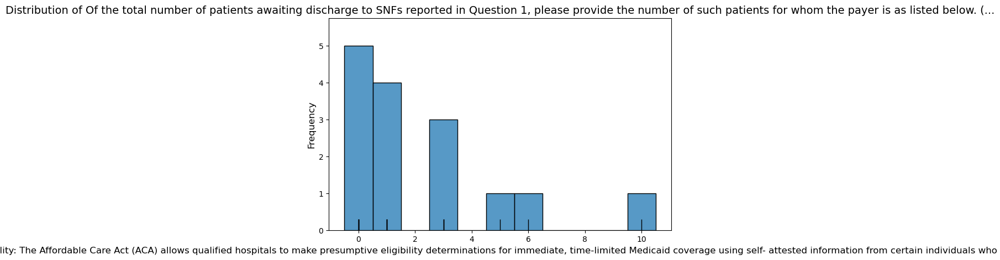

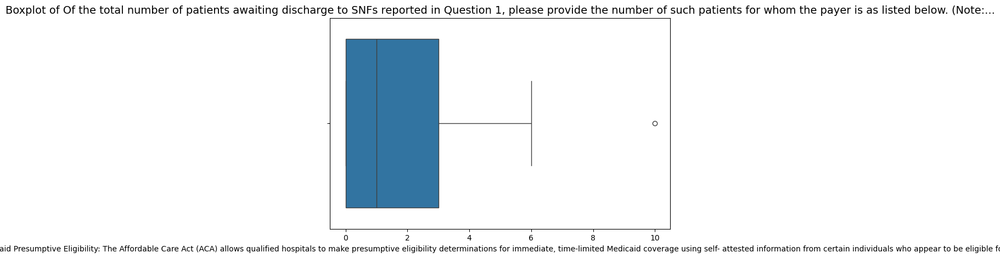

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

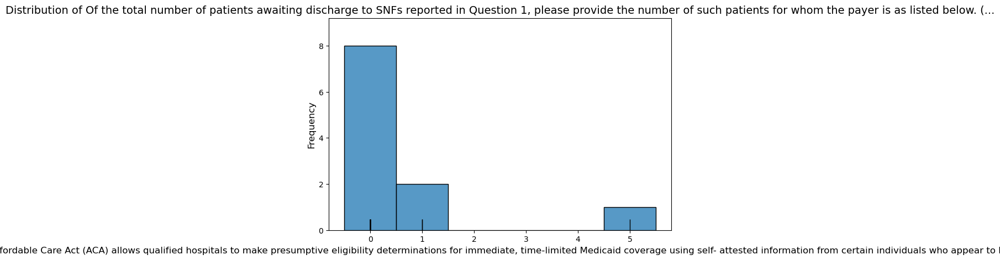

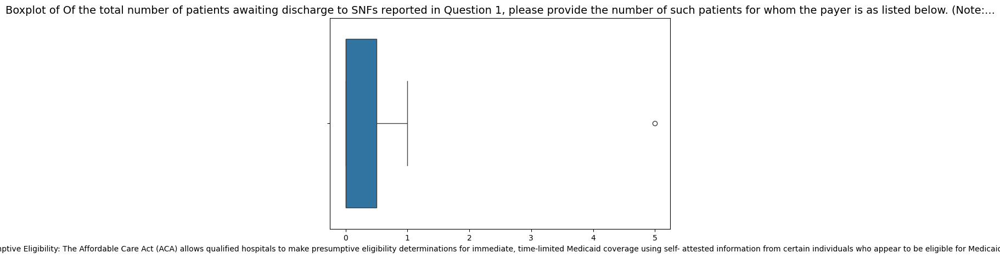

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

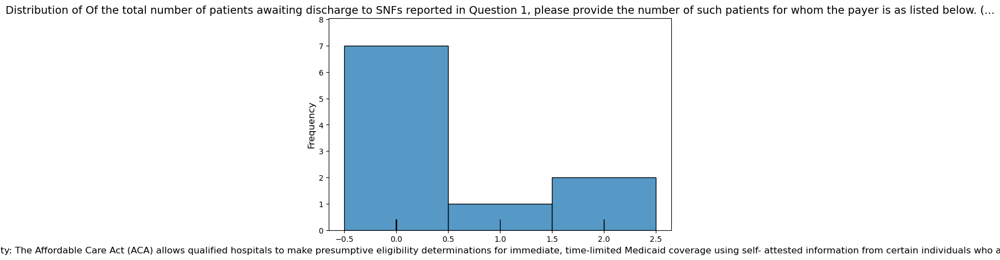

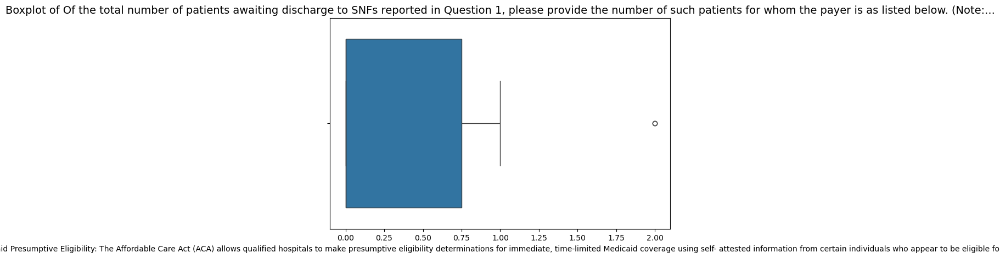

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

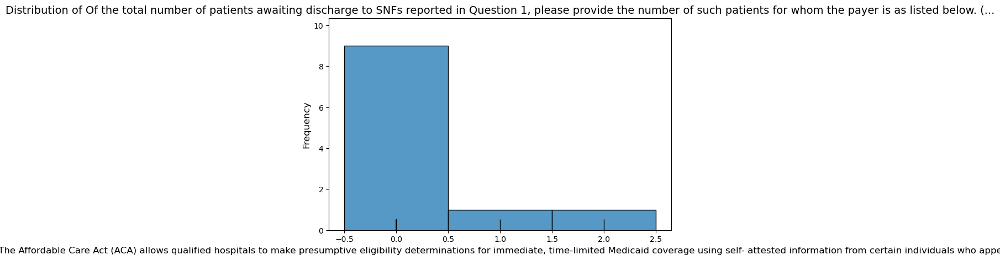

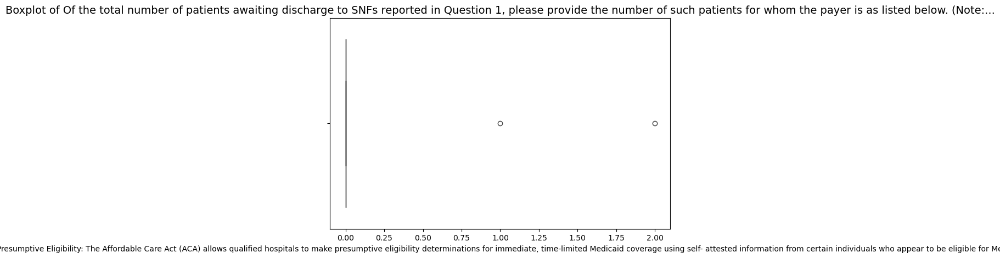

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

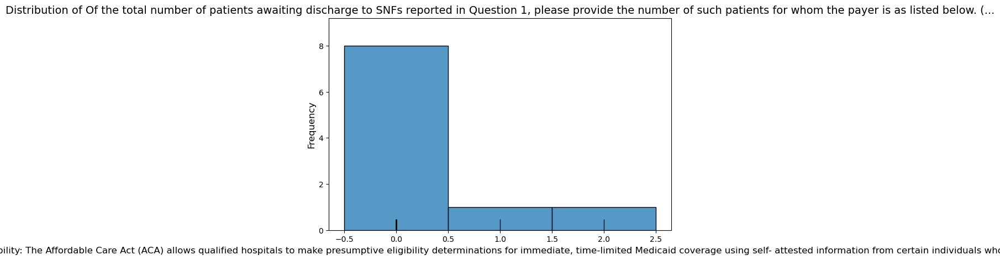

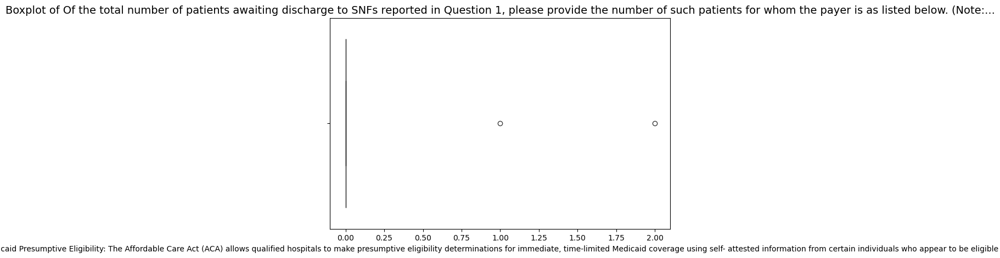

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

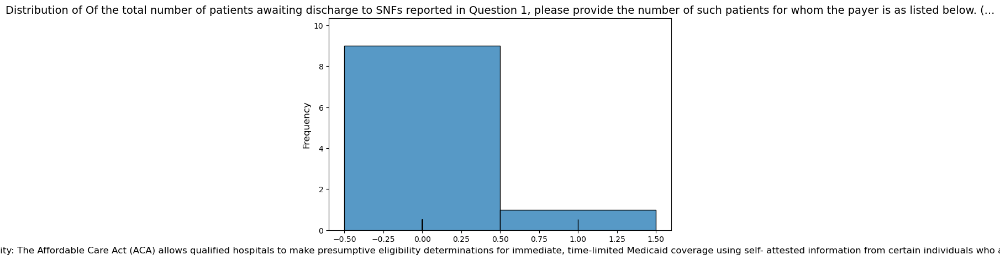

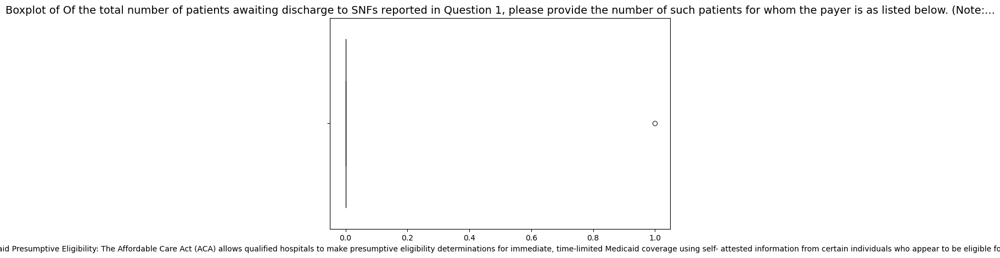

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to SNFs reported in Question 1, please provide the number of such patients for whom the payer is as listed below. (Note: the total should add up to the number of patients awaiting discharge to SNFs reported in Question 1.) 1. Medicare Non-Managed: Medicare Non-Managed populations only2. Medicare Advantage: Medicare Advantage and Medicare Managed Care populations only3. Medicaid : Includes all MaineCare beneficiaries4. Medicaid Presumptive Eligibility: The Affordable Care Act (ACA) allows qualified hospitals to make presumptive eligibility determinations for immediate, time-limited Medicaid coverage using self- attested information from certain individuals who appear to be eligible for Medicaid coverage, but are unable to complete a full Medicaid application at that time.5. Dual Eligible: Includes all populations eligible for 

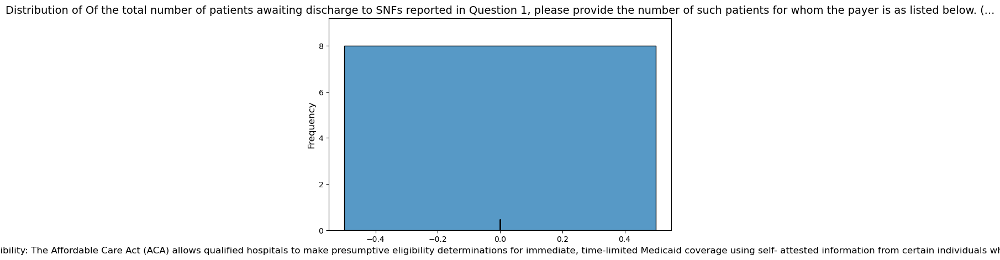

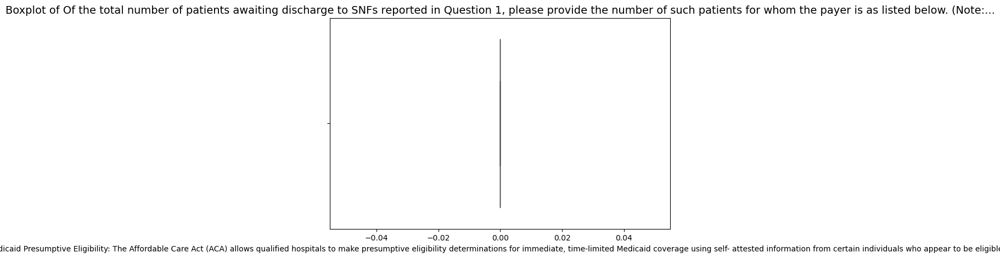

____________________________________________________________________________________________________
Attribute: Please provide the number of homeless or housing unstable inpatients awaiting discharge to shelters: Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      1.421053
std       3.501044
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max      13.000000
Name: Please provide the number of homeless or housing unstable inpatients awaiting discharge to shelters: Open-Ended Response, dtype: float64


Frequency Distribution for Please provide the number of homeless or housing unstable inpatients awaiting discharge to shelters: Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Please provide the number of homeless or housin...                            
0.0        

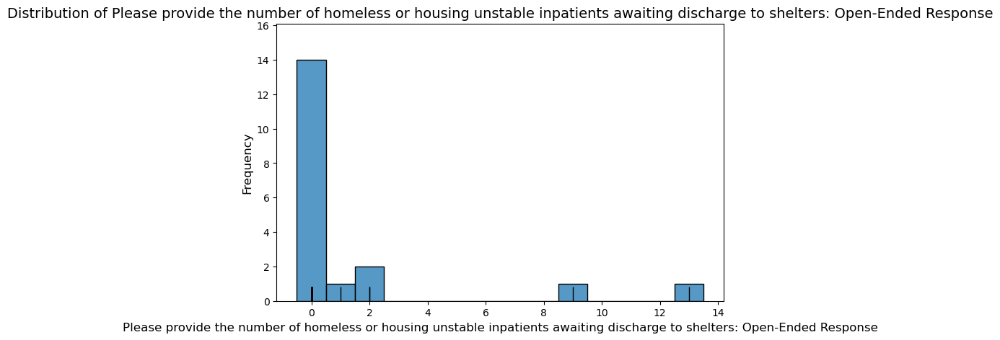

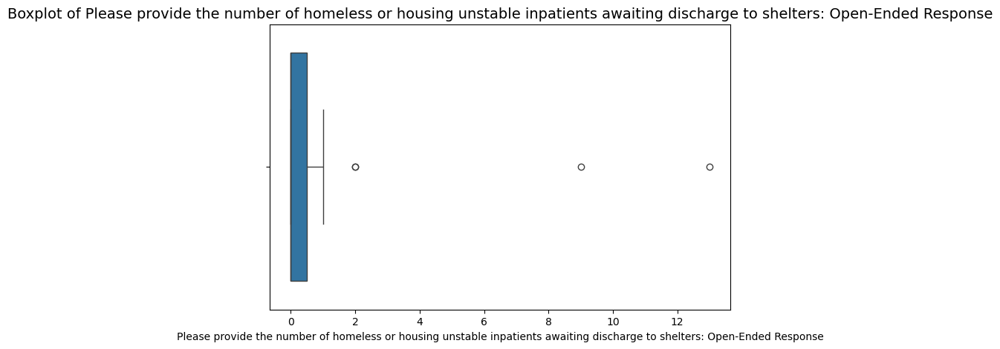

____________________________________________________________________________________________________
Attribute: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), please provide the number of patients that have been awaiting discharge for more than 7 days: Open-Ended Response
____________________________________________________________________________________________________
count    18.000000
mean      0.777778
std       1.926764
min       0.000000
25%       0.000000
50%       0.000000
75%       0.750000
max       8.000000
Name: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), please provide the number of patients that have been awaiting discharge for more than 7 days: Open-Ended Response, dtype: float64


Frequency Distribution for Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable i

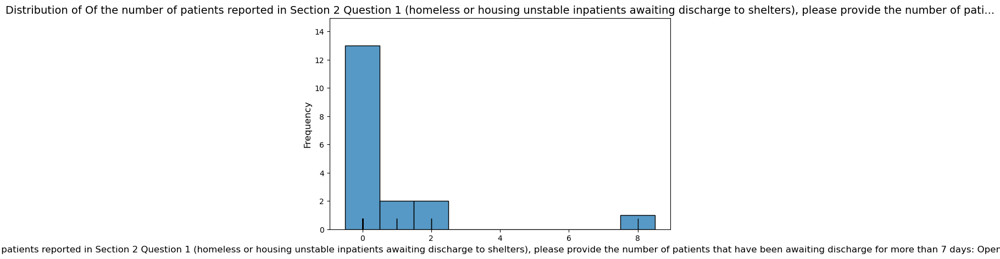

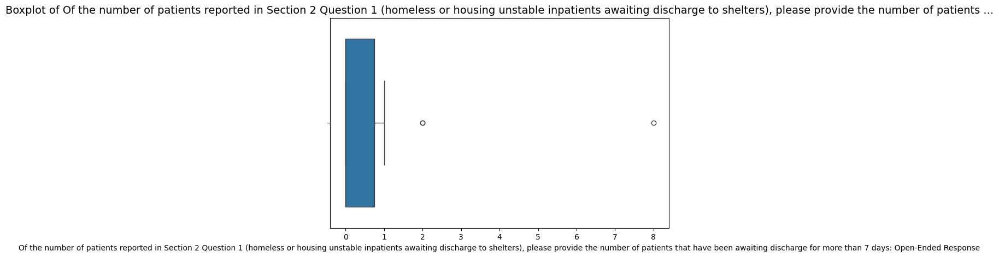

____________________________________________________________________________________________________
Attribute: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), how many patients have behavioral health issues or substance use disorder (SUD)? Open-Ended Response
____________________________________________________________________________________________________
count    18.000000
mean      1.888889
std       3.676458
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      13.000000
Name: Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting discharge to shelters), how many patients have behavioral health issues or substance use disorder (SUD)? Open-Ended Response, dtype: float64


Frequency Distribution for Of the number of patients reported in Section 2 Question 1 (homeless or housing unstable inpatients awaiting dischar

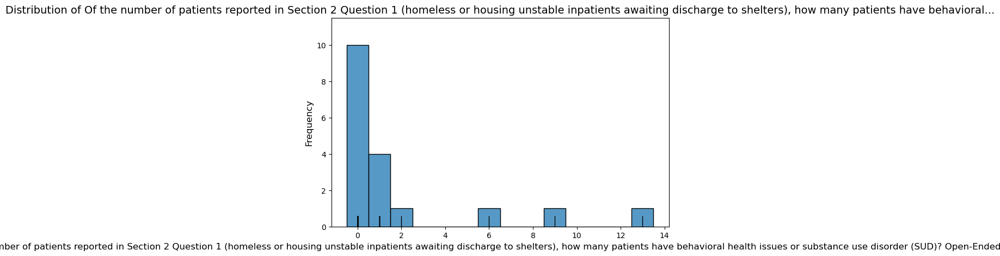

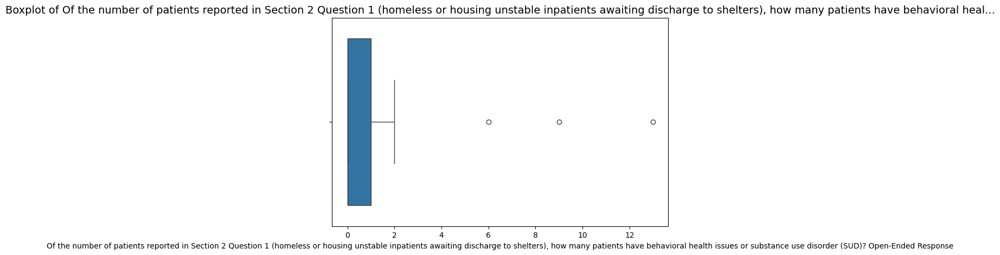

____________________________________________________________________________________________________
Attribute: Please provide the number of patients who are medically cleared for discharge (to any setting) who remain in your facility SOLELY due to lack of transportation (i.e., bed available, transportation unavailable): Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.473684
std       1.611363
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       7.000000
Name: Please provide the number of patients who are medically cleared for discharge (to any setting) who remain in your facility SOLELY due to lack of transportation (i.e., bed available, transportation unavailable): Open-Ended Response, dtype: float64


Frequency Distribution for Please provide the number of patients who are medically cleared for discharge (to any setting) who remain in your facility

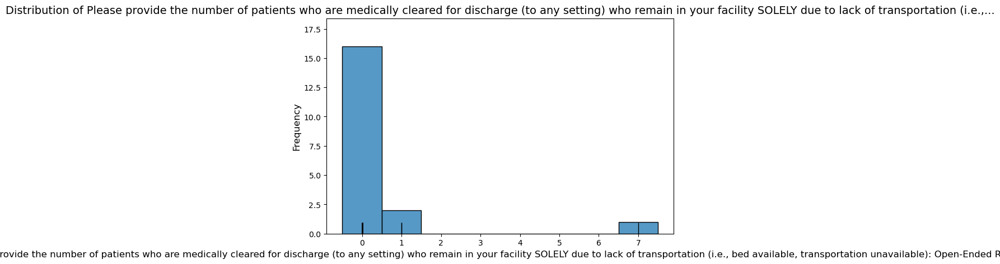

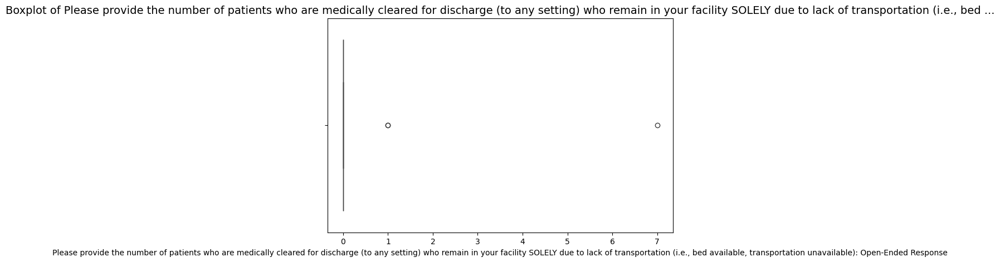

____________________________________________________________________________________________________
Attribute: For patients who are medically cleared for discharge but awaiting transportation, what is the maximum time that a patient at your facility has waited for transportation in the past two weeks? Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      1.789474
std       3.720498
min       0.000000
25%       0.000000
50%       0.000000
75%       2.000000
max      12.000000
Name: For patients who are medically cleared for discharge but awaiting transportation, what is the maximum time that a patient at your facility has waited for transportation in the past two weeks? Open-Ended Response, dtype: float64


Frequency Distribution for For patients who are medically cleared for discharge but awaiting transportation, what is the maximum time that a patient at your facility has waited for transp

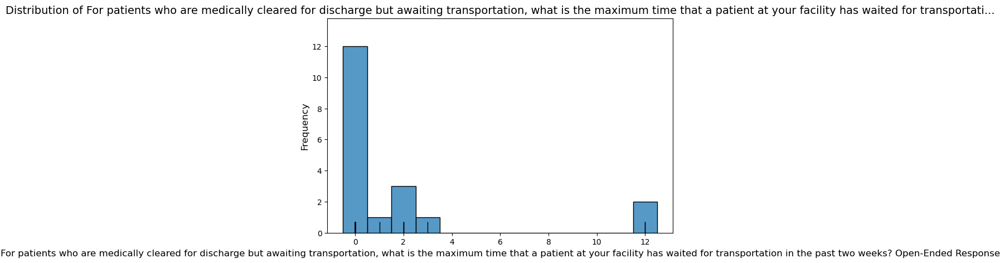

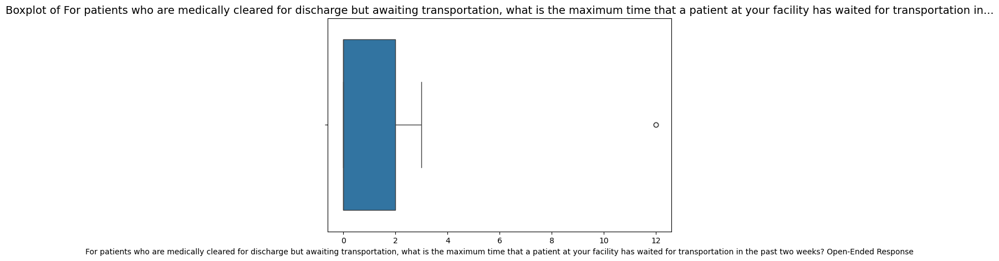

____________________________________________________________________________________________________
Attribute: Of the total number of patients awaiting discharge to any setting, please provide the number of patients unable to find a bed due to lack of reimbursement for outpatient hemodialysis transportation and/or lack of available dialysis treatment chair: Open-Ended Response
____________________________________________________________________________________________________
count    19.000000
mean      0.157895
std       0.374634
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of the total number of patients awaiting discharge to any setting, please provide the number of patients unable to find a bed due to lack of reimbursement for outpatient hemodialysis transportation and/or lack of available dialysis treatment chair: Open-Ended Response, dtype: float64


Frequency Distribution for Of the total number of patients awaiting disch

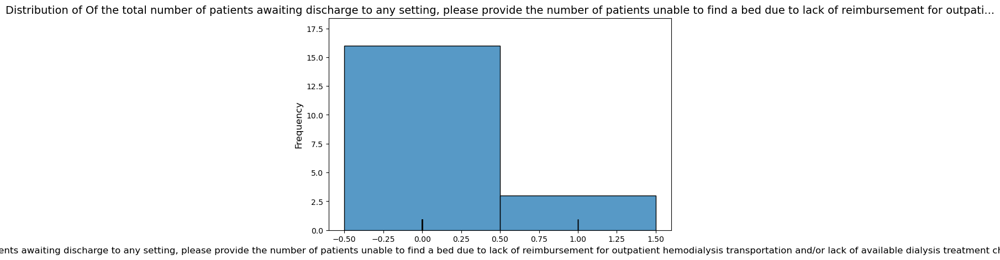

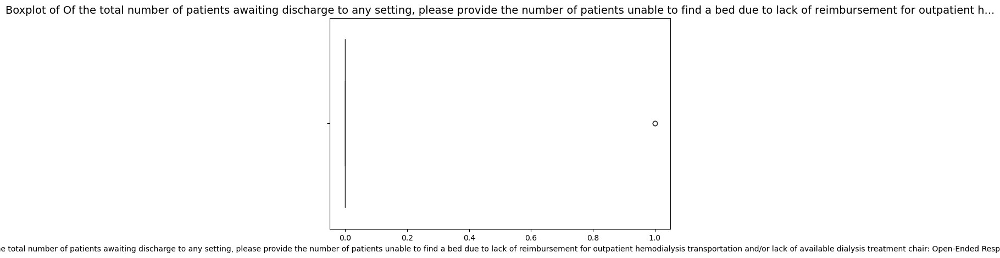

____________________________________________________________________________________________________
Attribute: How many licensed ED beds are in your hospital? Open-Ended Response
____________________________________________________________________________________________________
count    17.000000
mean     24.176471
std      23.122595
min       0.000000
25%      10.000000
50%      15.000000
75%      32.000000
max      92.000000
Name: How many licensed ED beds are in your hospital? Open-Ended Response, dtype: float64


Frequency Distribution for How many licensed ED beds are in your hospital? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
How many licensed ED beds are in your hospital?...                            
32.0                                                    2                 11.8
10.0                                                    2                 11.8
45.0        

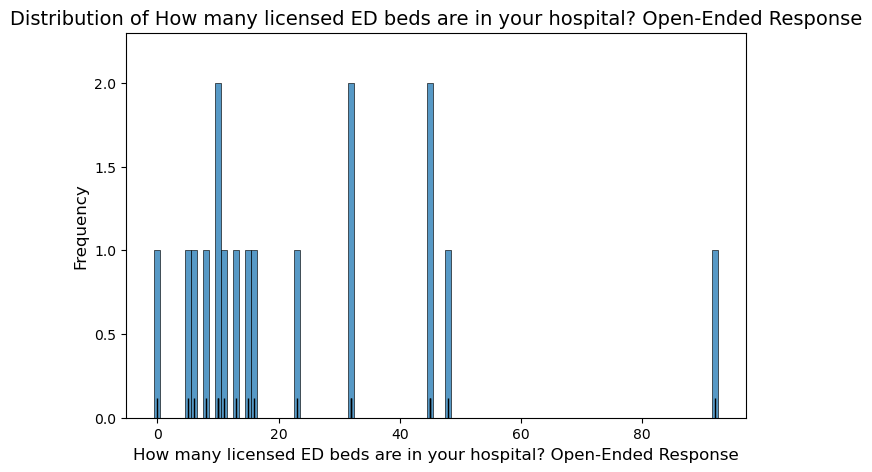

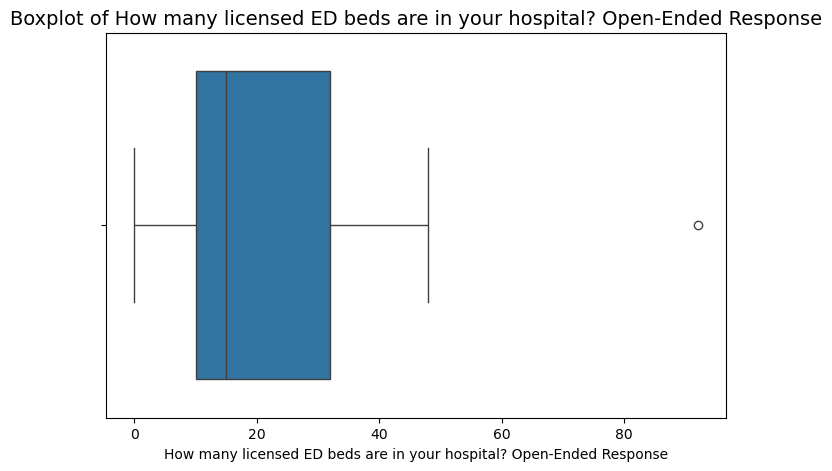

____________________________________________________________________________________________________
Attribute: How many of your licensed ED beds are staffed in your hospital? Open-Ended Response
____________________________________________________________________________________________________
count    18.000000
mean     18.944444
std      13.930382
min       0.000000
25%       8.500000
50%      14.000000
75%      30.500000
max      45.000000
Name: How many of your licensed ED beds are staffed in your hospital? Open-Ended Response, dtype: float64


Frequency Distribution for How many of your licensed ED beds are staffed in your hospital? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
How many of your licensed ED beds are staffed i...                            
8.0                                                     2                 11.1
32.0                                       

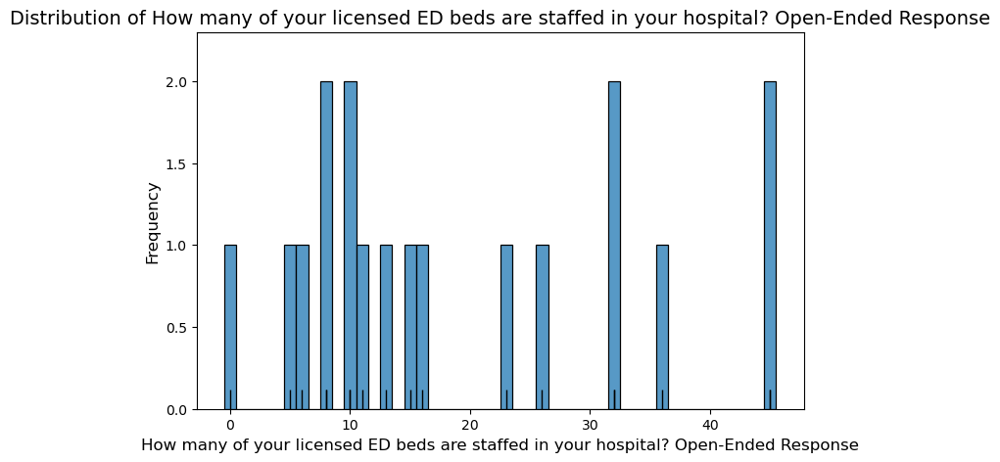

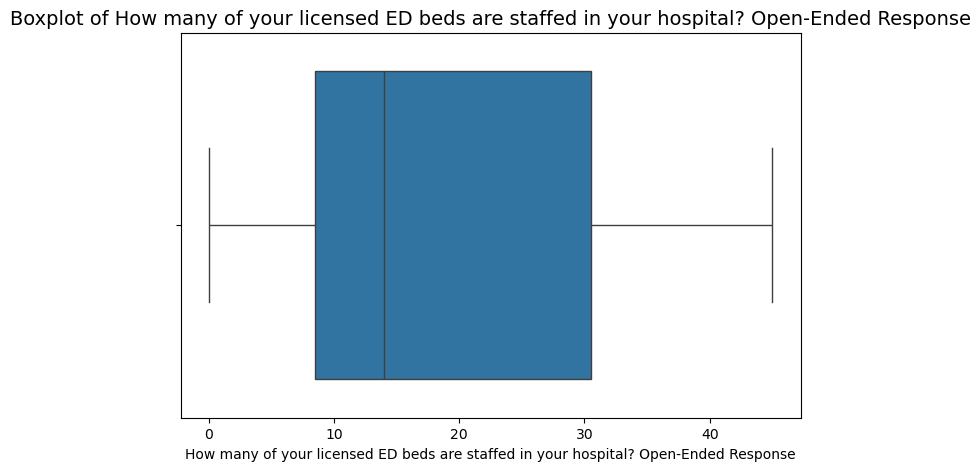

____________________________________________________________________________________________________
Attribute: How many patients are currently in your ED? Open-Ended Response
____________________________________________________________________________________________________
count    17.000000
mean     21.529412
std      18.024697
min       0.000000
25%       8.000000
50%      14.000000
75%      32.000000
max      60.000000
Name: How many patients are currently in your ED? Open-Ended Response, dtype: float64


Frequency Distribution for How many patients are currently in your ED? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
How many patients are currently in your ED? Ope...                            
14.0                                                    2                 11.8
24.0                                                    1                  5.9
6.0                     

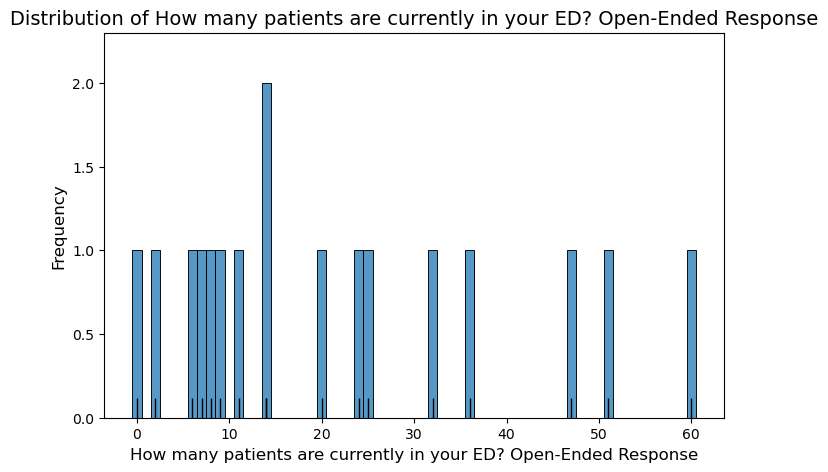

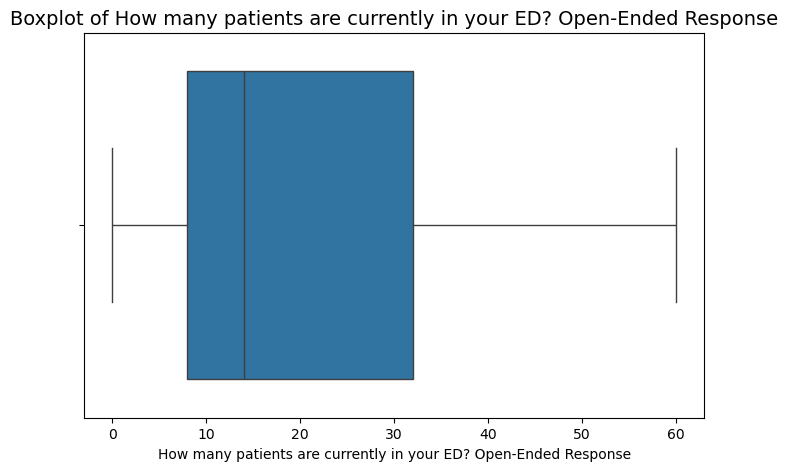

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 3, how many are age 17 or younger? Open-Ended Response
____________________________________________________________________________________________________
count    17.000000
mean      1.352941
std       1.057188
min       0.000000
25%       1.000000
50%       1.000000
75%       2.000000
max       3.000000
Name: Of those patients reported in question 3, how many are age 17 or younger? Open-Ended Response, dtype: float64


Frequency Distribution for Of those patients reported in question 3, how many are age 17 or younger? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 3, how m...                            
1.0                                                     6                 35.3
2.0          

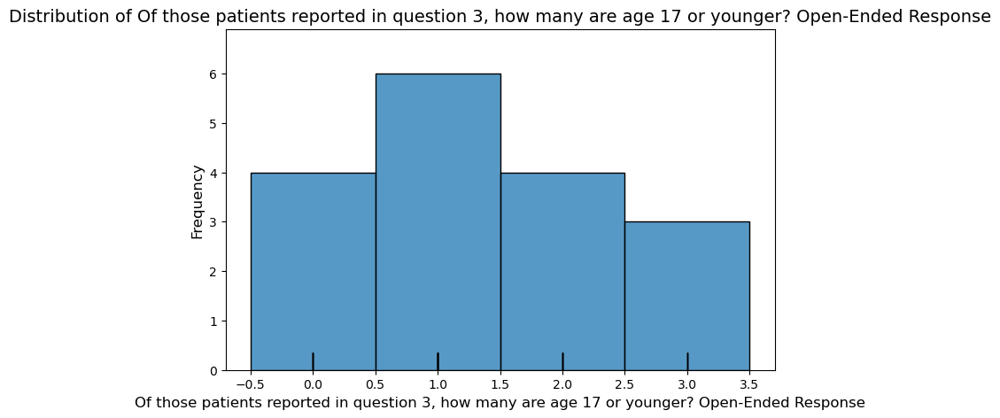

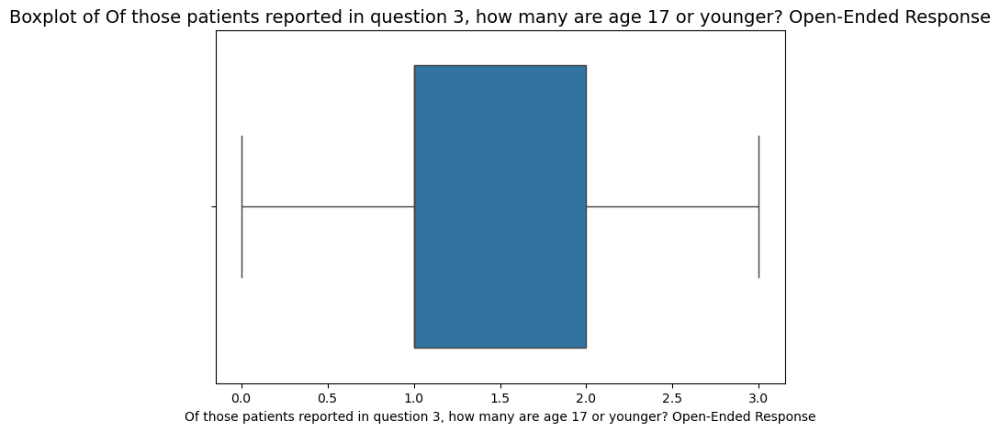

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 48 hours
____________________________________________________________________________________________________
count    16.00000
mean      0.25000
std       0.57735
min       0.00000
25%       0.00000
50%       0.00000
75%       0.00000
max       2.00000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 48 hours, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 48 hours:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                      

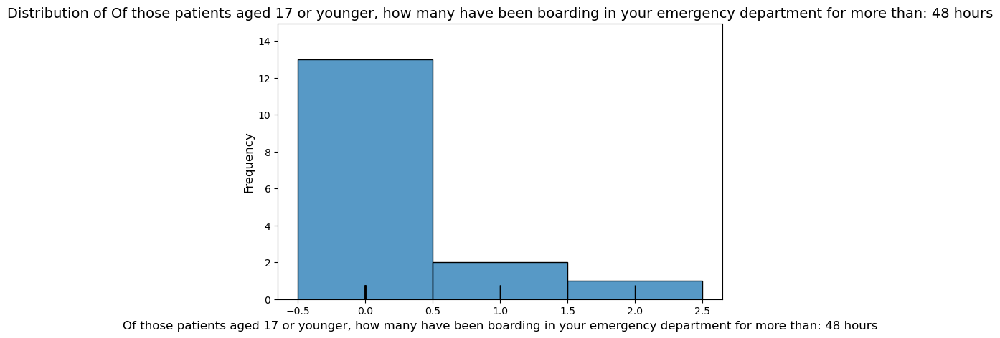

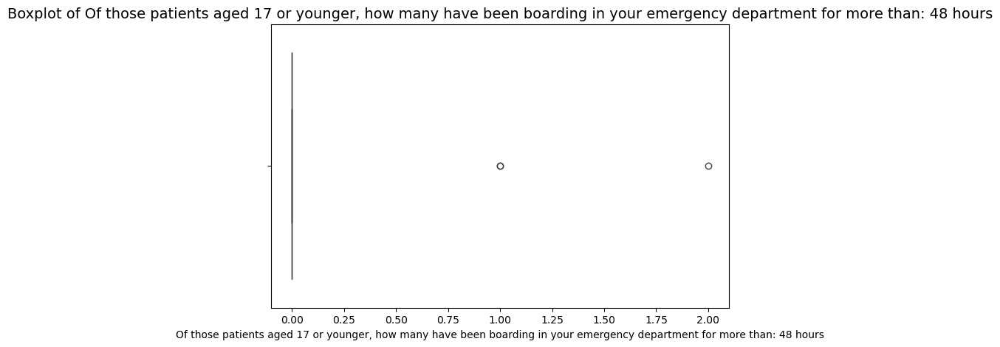

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >48 hours but less than one week
____________________________________________________________________________________________________
count    14.000000
mean      0.214286
std       0.425815
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >48 hours but less than one week, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >48 hours but less than one week:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 1

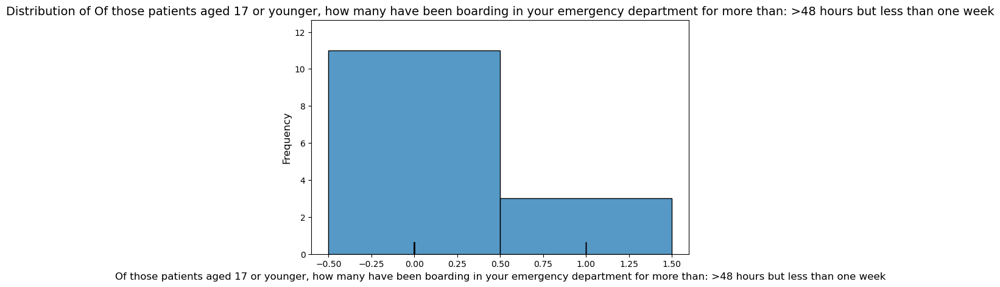

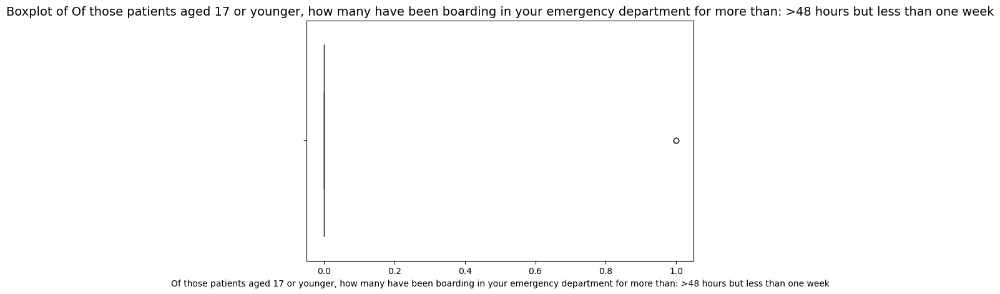

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 7 to 14 days
____________________________________________________________________________________________________
count    14.000000
mean      0.142857
std       0.363137
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 7 to 14 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 7 to 14 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0  

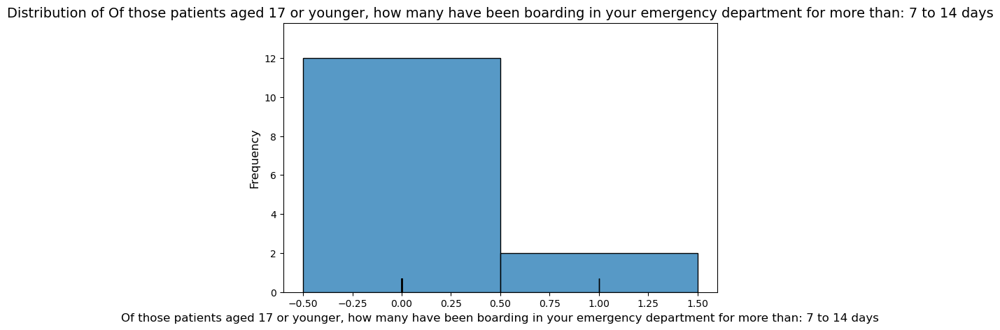

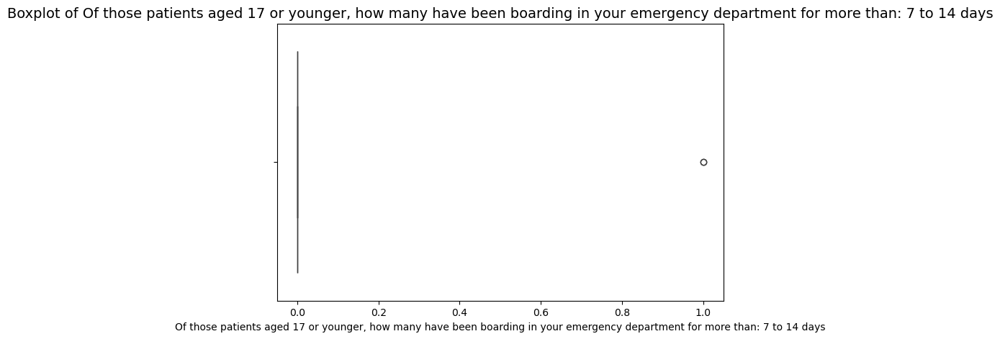

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 15 to 30 days
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 15 to 30 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 15 to 30 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                                       

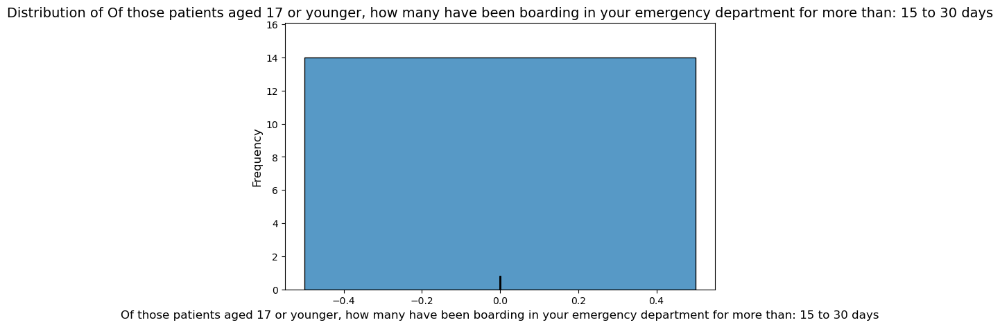

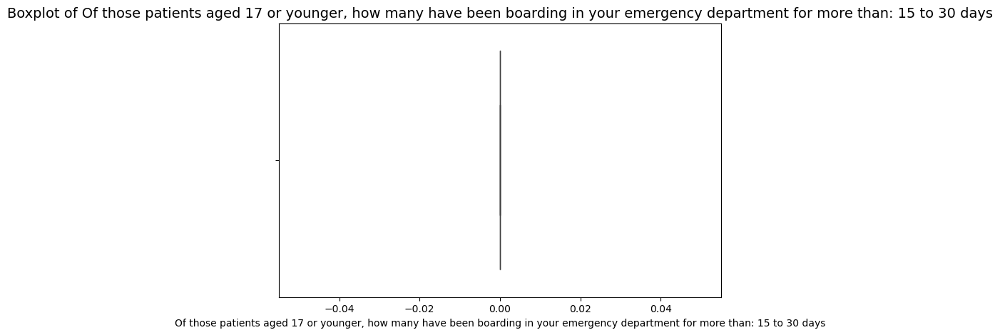

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 31 to 60 days
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 31 to 60 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 31 to 60 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                                       

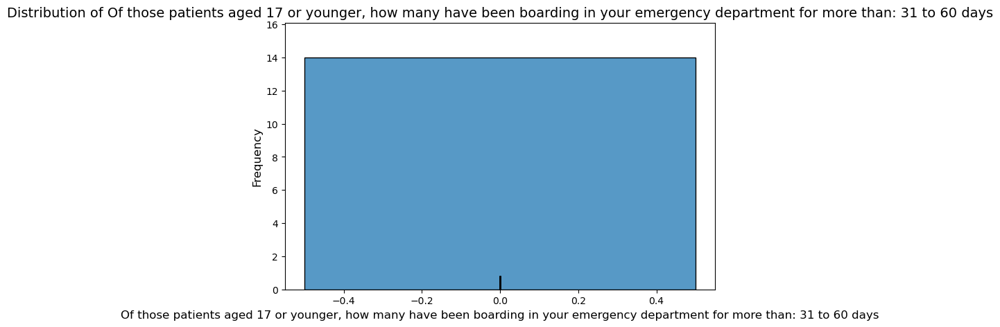

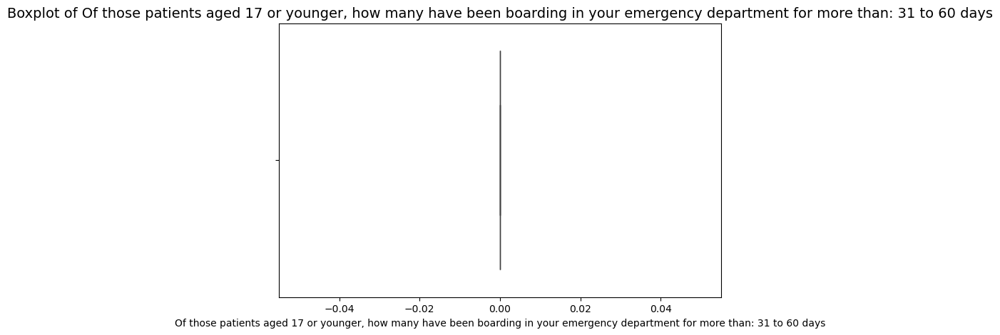

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 61 to 120 days
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 61 to 120 days, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: 61 to 120 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0                                    

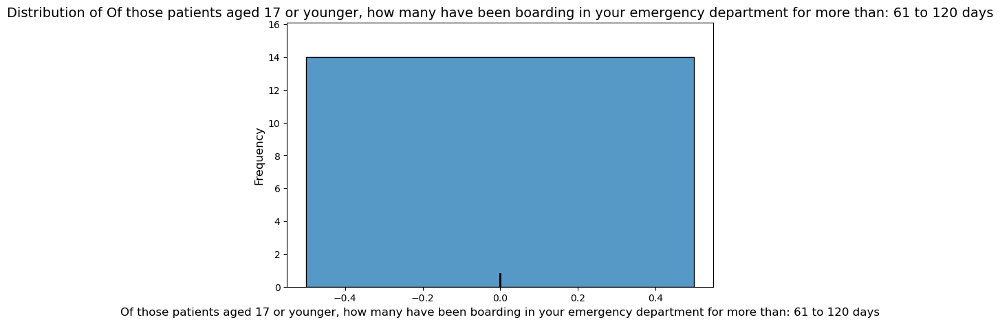

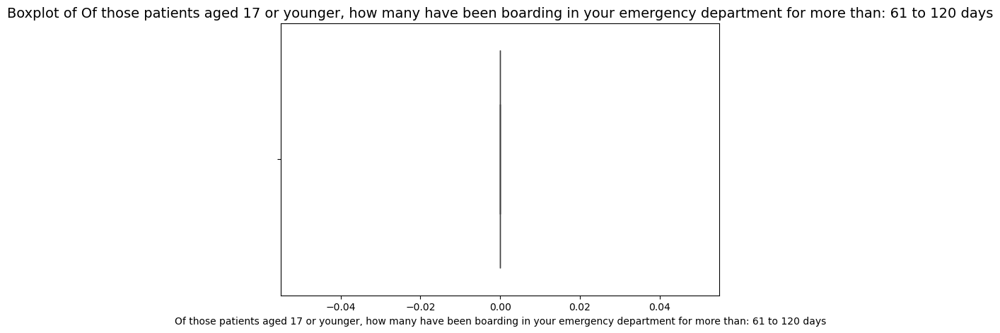

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >3 months
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >3 months, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than: >3 months:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 17 or younger, how many ...                            
0.0           

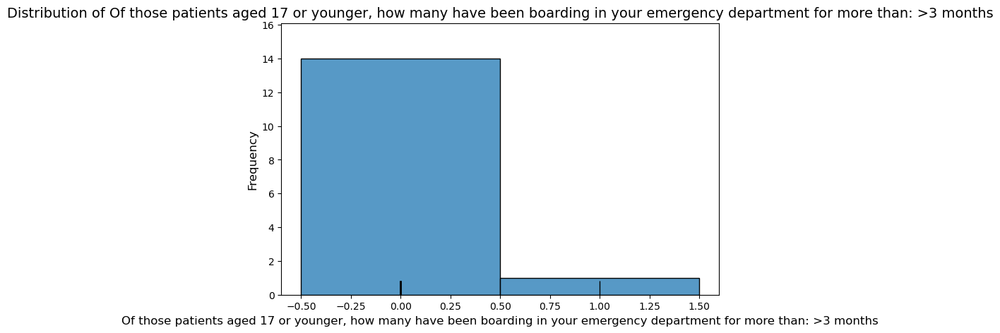

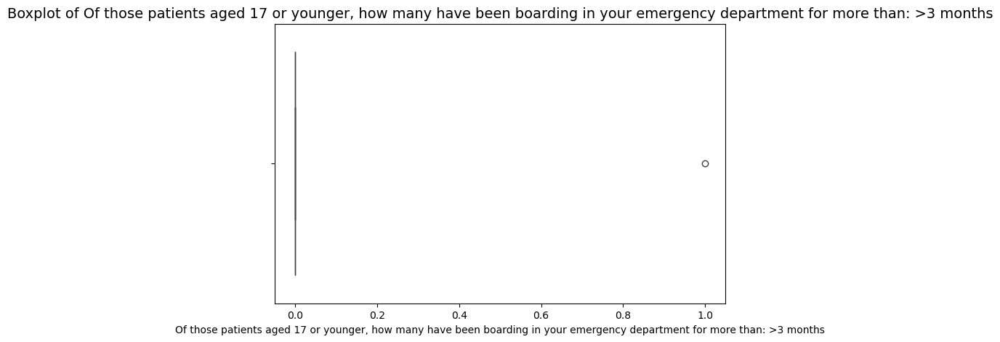

____________________________________________________________________________________________________
Attribute: Of those reported in question 4, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response
____________________________________________________________________________________________________
count    16.000000
mean      0.437500
std       0.629153
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       2.000000
Name: Of those reported in question 4, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response, dtype: float64


Frequency Distribution for Of those reported in question 4, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those reported in question 4, how many have ...                            
0.0  

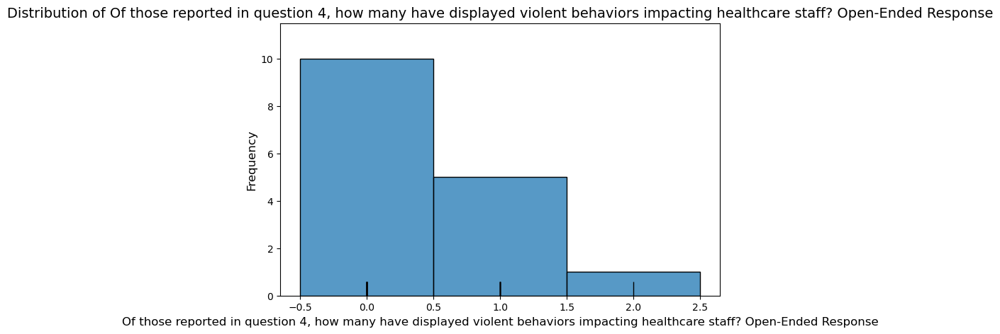

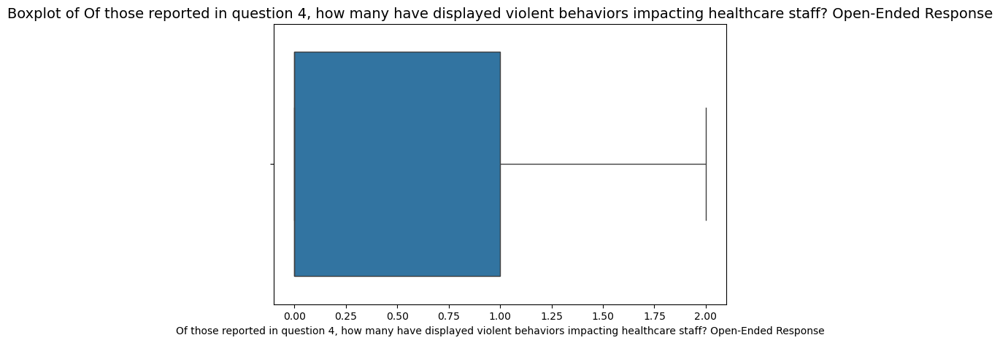

____________________________________________________________________________________________________
Attribute: If Yes, how many have been impacted in the past week? Open-Ended Response
____________________________________________________________________________________________________
count    17.000000
mean      2.411765
std       3.103603
min       0.000000
25%       0.000000
50%       2.000000
75%       3.000000
max      10.000000
Name: If Yes, how many have been impacted in the past week? Open-Ended Response, dtype: float64


Frequency Distribution for If Yes, how many have been impacted in the past week? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
If Yes, how many have been impacted in the past...                            
0.0                                                     5                 29.4
2.0                                                     4                

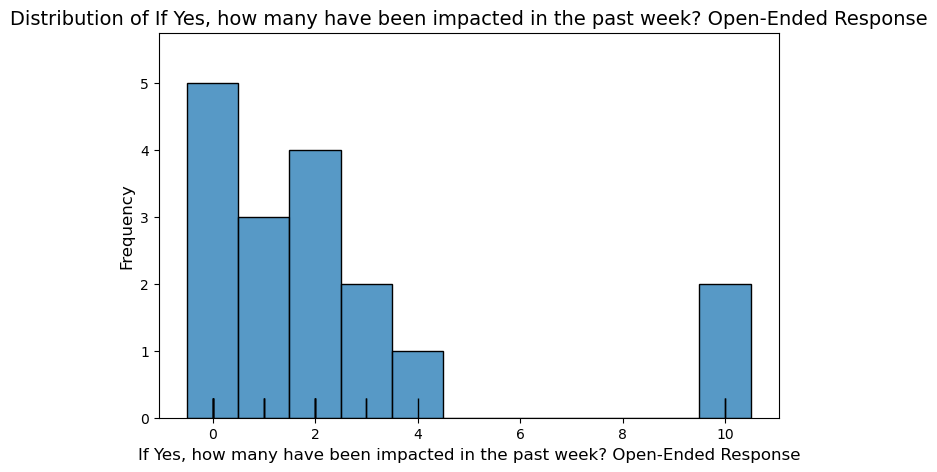

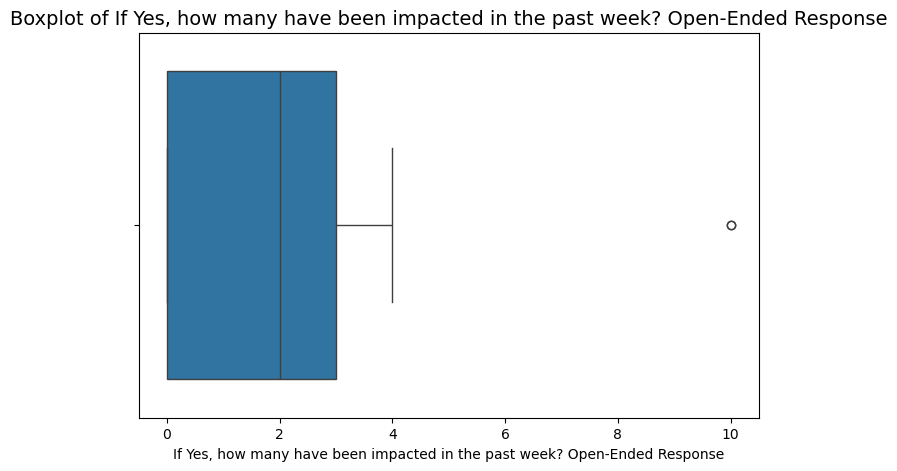

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Abandoned by Guardian:
____________________________________________________________________________________________________
count    15.000000
mean      0.266667
std       0.457738
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Abandoned by Guardian:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Abandoned by Guardian::
__________________________________________________
                                                    Cou

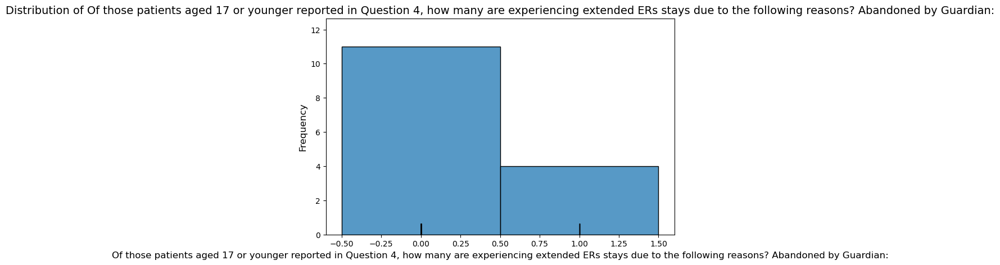

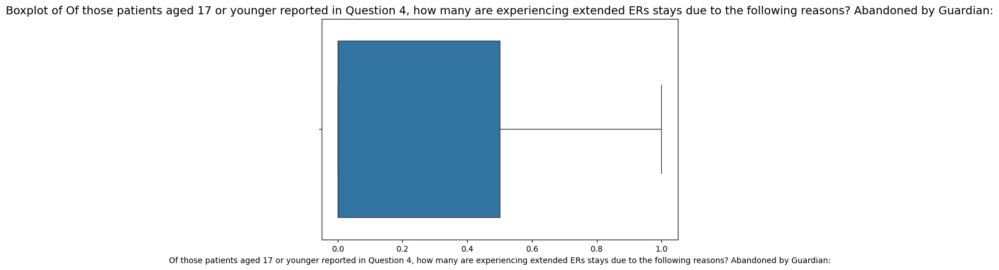

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Ambulance/transport Unavailable:
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Ambulance/transport Unavailable:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Ambulance/transport Unavailable::
__________________________________________________
                         

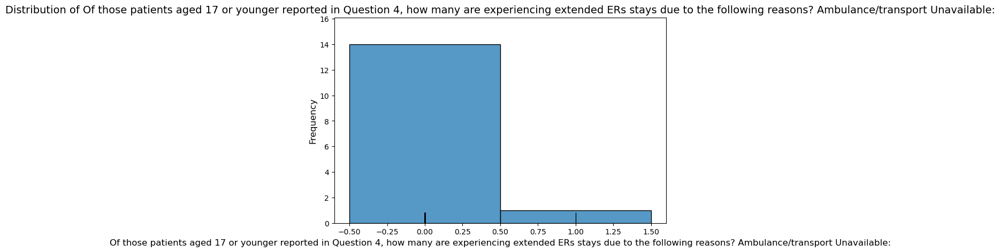

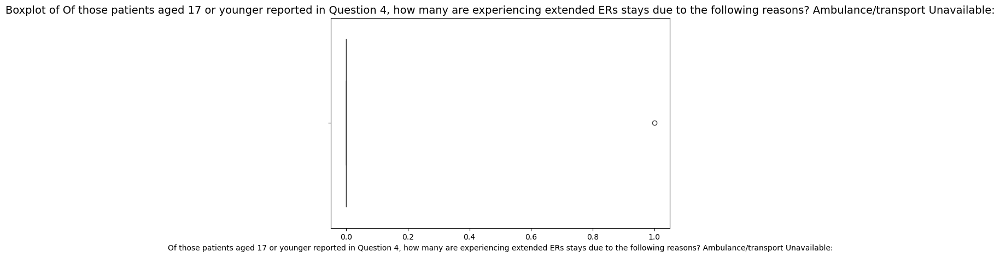

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of CCSU bed:
____________________________________________________________________________________________________
count    15.000000
mean      0.133333
std       0.351866
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of CCSU bed:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of CCSU bed::
__________________________________________________
                                              

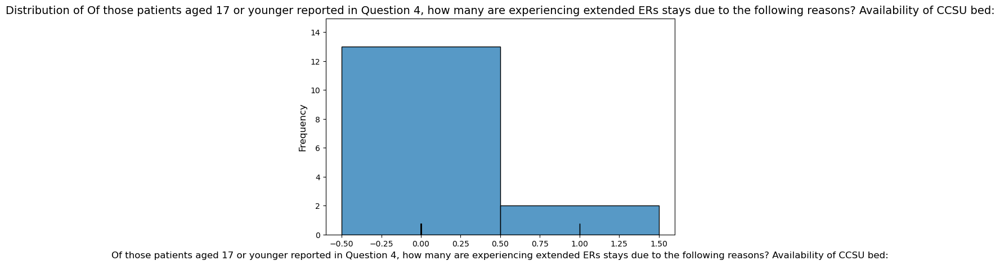

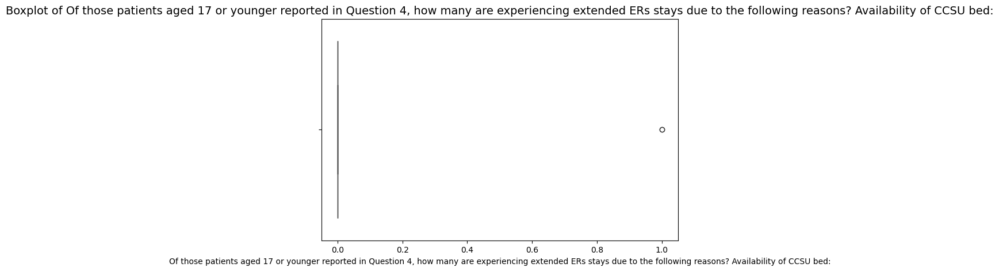

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Community Services:
____________________________________________________________________________________________________
count    15.000000
mean      0.133333
std       0.351866
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Community Services:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Community Services::
__________________________________________________
                

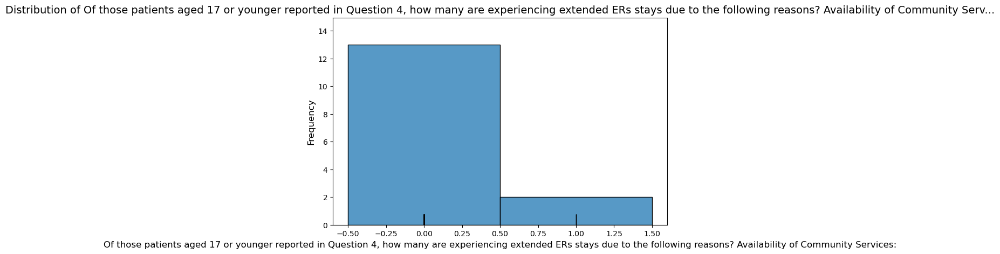

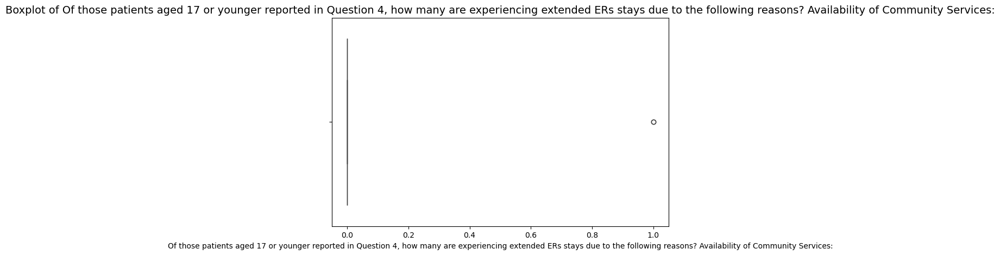

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Inpatient Bed:
____________________________________________________________________________________________________
count    16.000000
mean      0.125000
std       0.341565
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Inpatient Bed:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Inpatient Bed::
__________________________________________________
                               

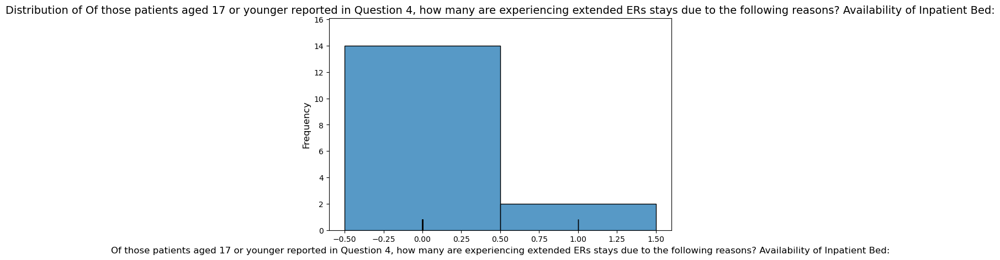

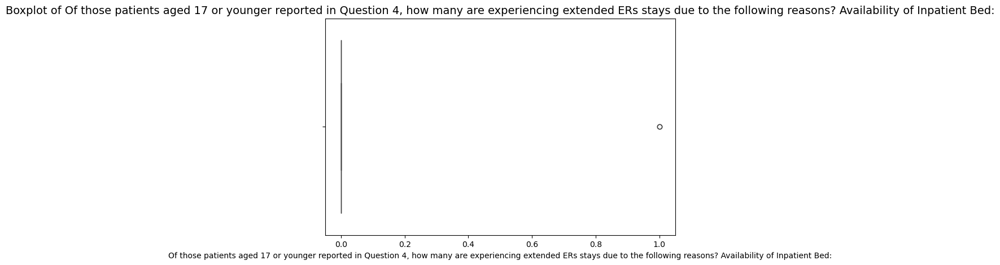

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:
____________________________________________________________________________________________________
count    16.000000
mean      0.312500
std       0.478714
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement::
_____________________________________

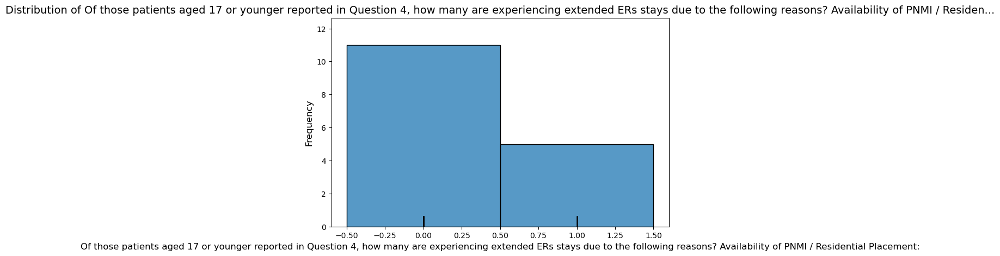

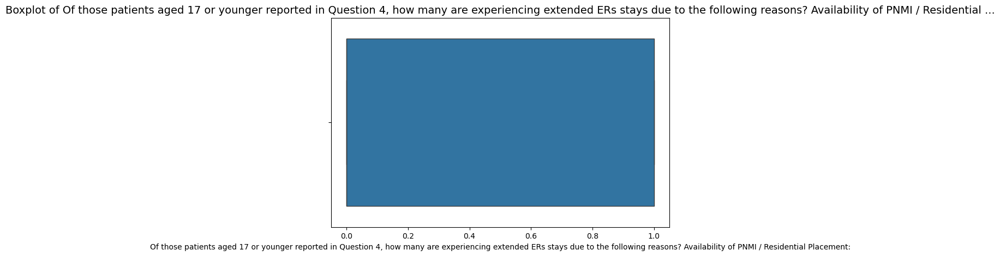

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Resource (Foster) Home Placement:
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Resource (Foster) Home Placement:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Availability of Resource (Foster) Home Placement::
__________________________________________________
              

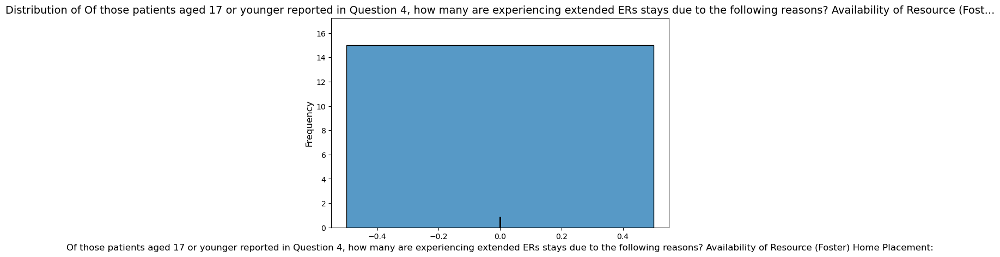

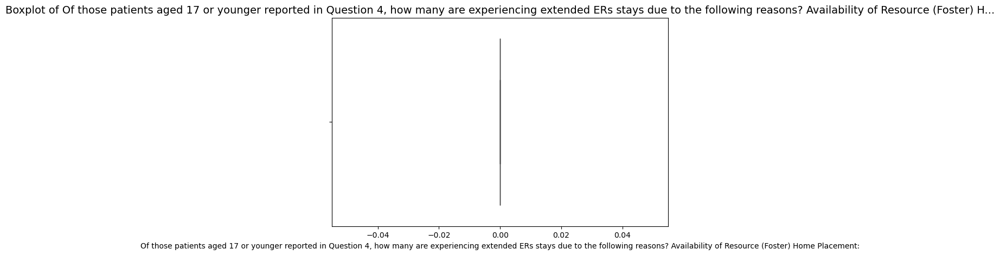

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? DHHS Guardian Unable to Secure Alternate Placement:
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? DHHS Guardian Unable to Secure Alternate Placement:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? DHHS Guardian Unable to Secure Alternate Placement::
___________________

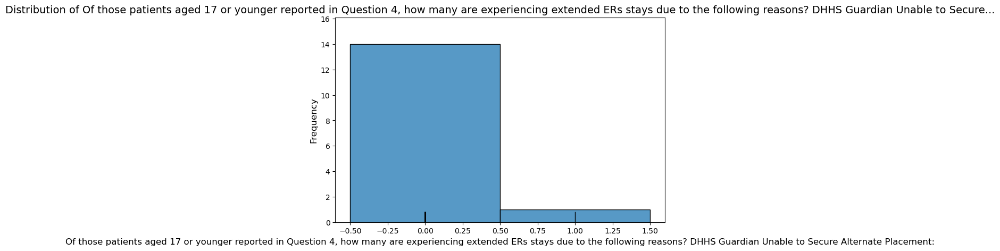

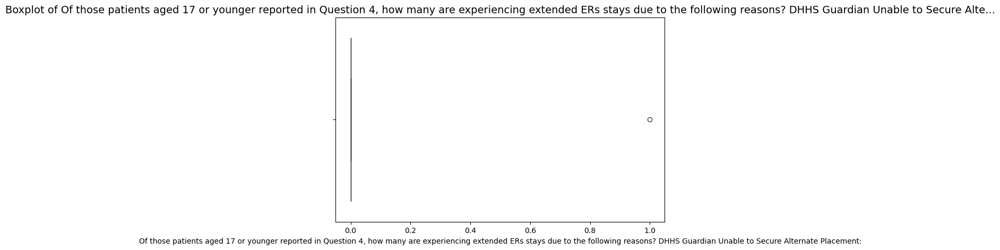

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Does Not Wish for Youth to Return to Their Home:
____________________________________________________________________________________________________
count    15.000000
mean      0.333333
std       0.617213
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       2.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Does Not Wish for Youth to Return to Their Home:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Does Not Wish for Youth to Return to Their Home::
_

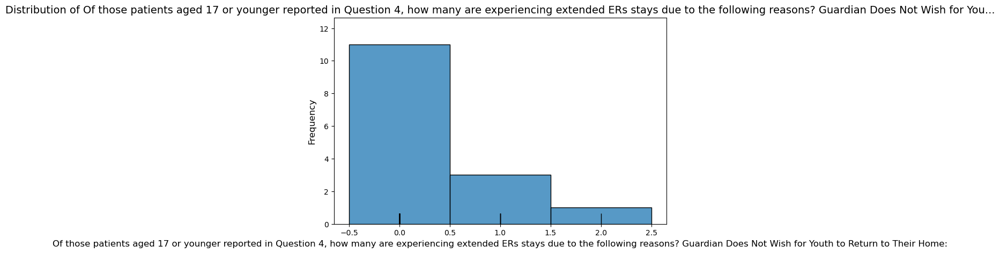

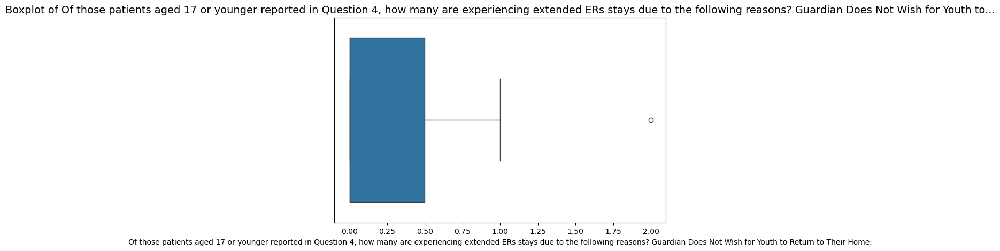

____________________________________________________________________________________________________
Attribute: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Unwilling to Accept Discharge Recommendation:
____________________________________________________________________________________________________
count    15.000000
mean      0.200000
std       0.560612
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Unwilling to Accept Discharge Recommendation:, dtype: float64


Frequency Distribution for Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons? Guardian Unwilling to Accept Discharge Recommendation::
__________

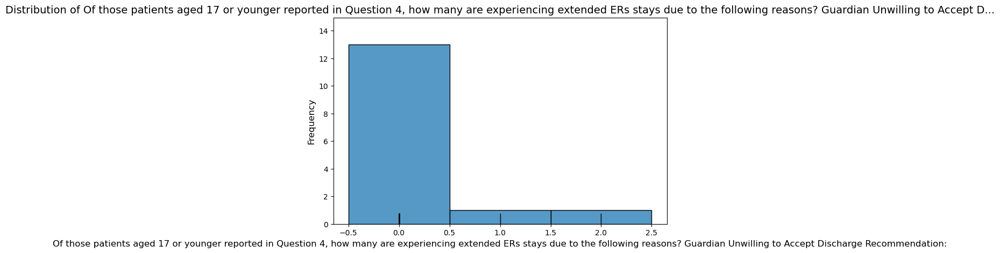

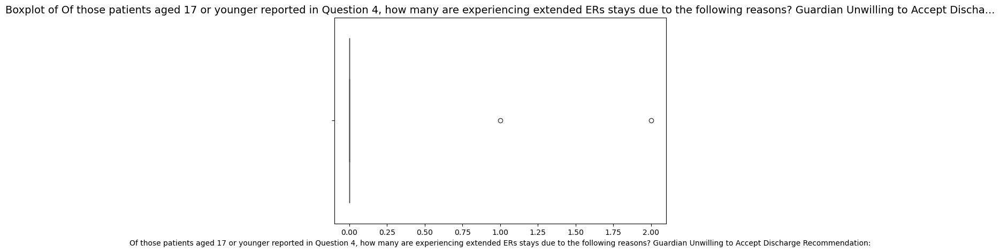

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient bed for medical management
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient bed for medical management, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient bed for medical management:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those pati

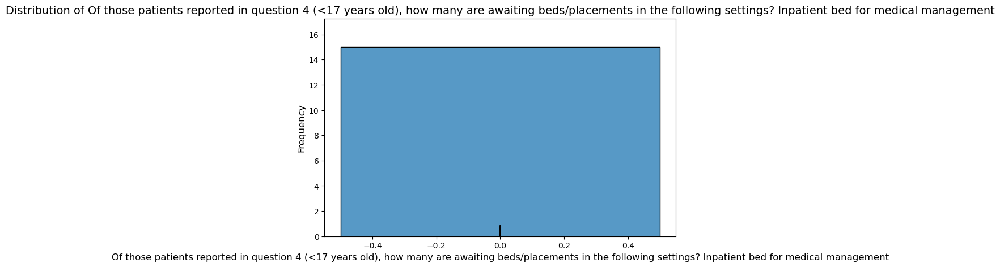

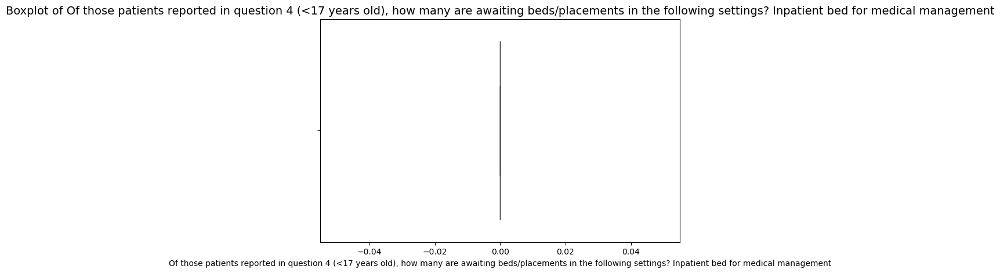

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 4 (<17 

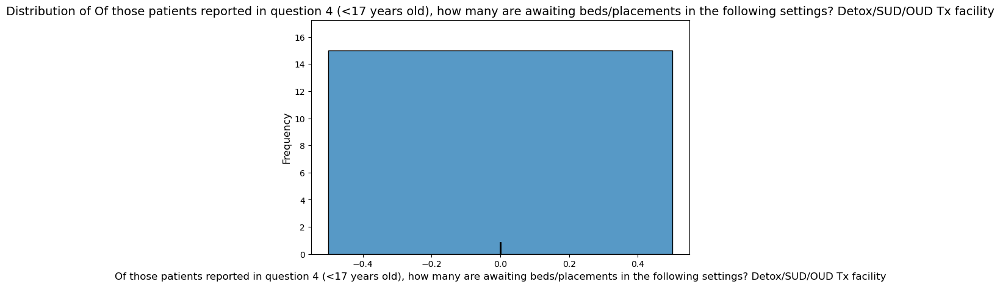

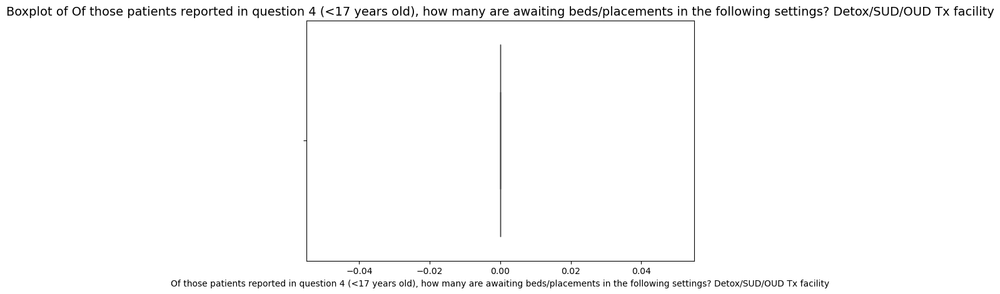

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient psychiatric
____________________________________________________________________________________________________
count    16.000000
mean      0.187500
std       0.403113
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient psychiatric, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Inpatient psychiatric:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients 

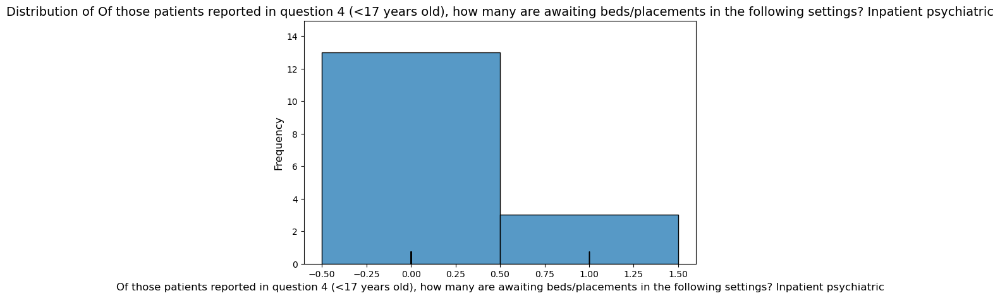

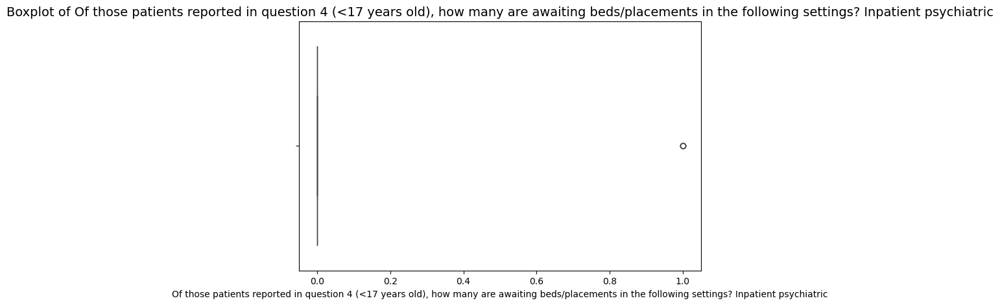

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility
____________________________________________________________________________________________________
count    15.000000
mean      0.333333
std       0.617213
min       0.000000
25%       0.000000
50%       0.000000
75%       0.500000
max       2.000000
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility:
__________________________________________________
                                        

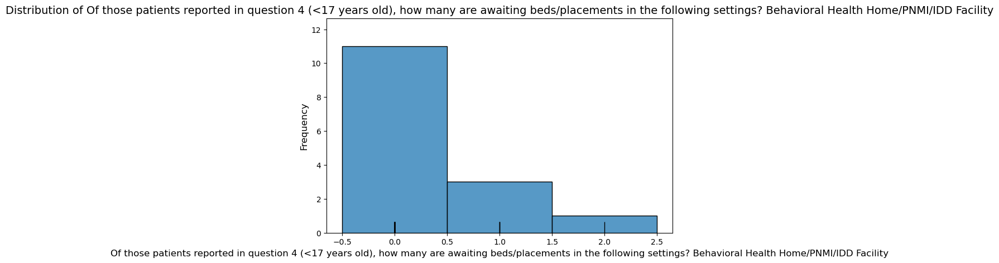

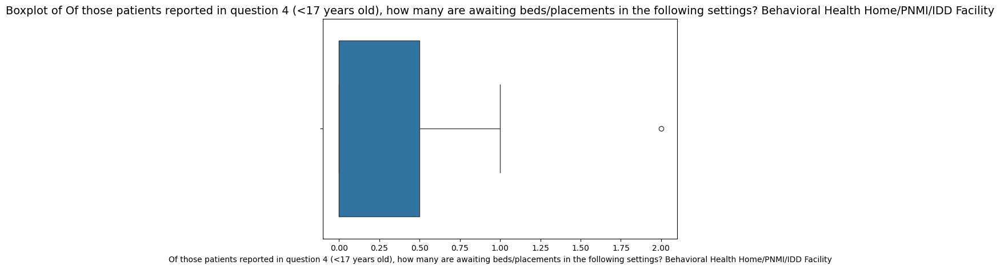

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Home
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Home, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Home:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 4 (<17 y...                            
0.0                           

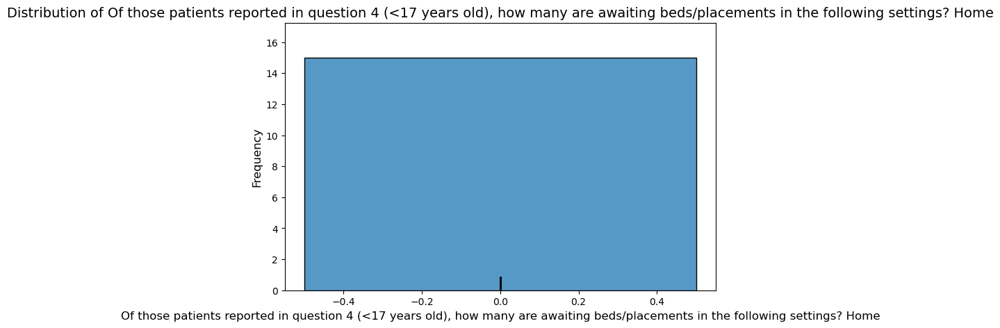

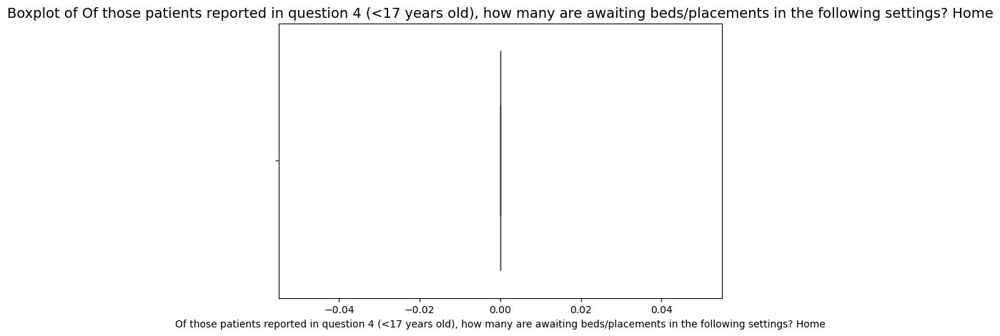

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Other
____________________________________________________________________________________________________
count    15.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Other, dtype: float64


Frequency Distribution for Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings? Other:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 4 (<17 y...                            
0.0                        

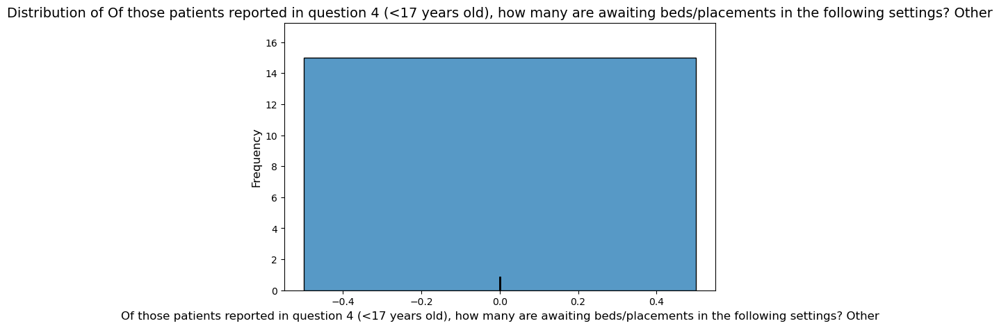

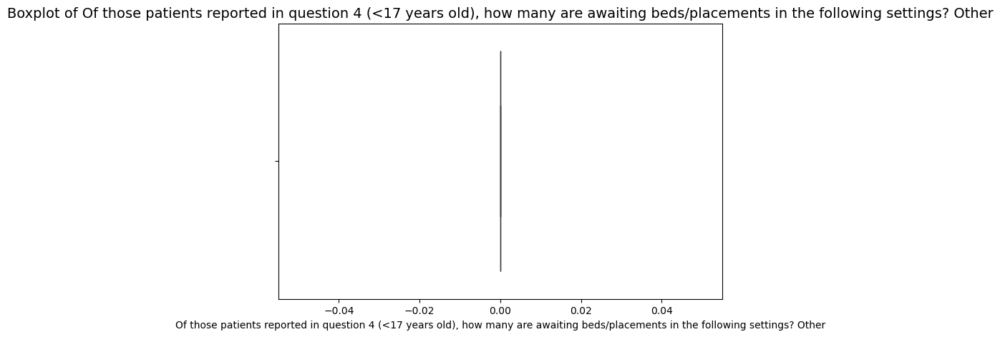

____________________________________________________________________________________________________
Attribute: Of those patients report in question 3, how many are 18 and older? Open-Ended Response
____________________________________________________________________________________________________
count    17.000000
mean     20.235294
std      17.144713
min       0.000000
25%       7.000000
50%      13.000000
75%      31.000000
max      57.000000
Name: Of those patients report in question 3, how many are 18 and older? Open-Ended Response, dtype: float64


Frequency Distribution for Of those patients report in question 3, how many are 18 and older? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients report in question 3, how man...                            
6.0                                                     2                 11.8
13.0                              

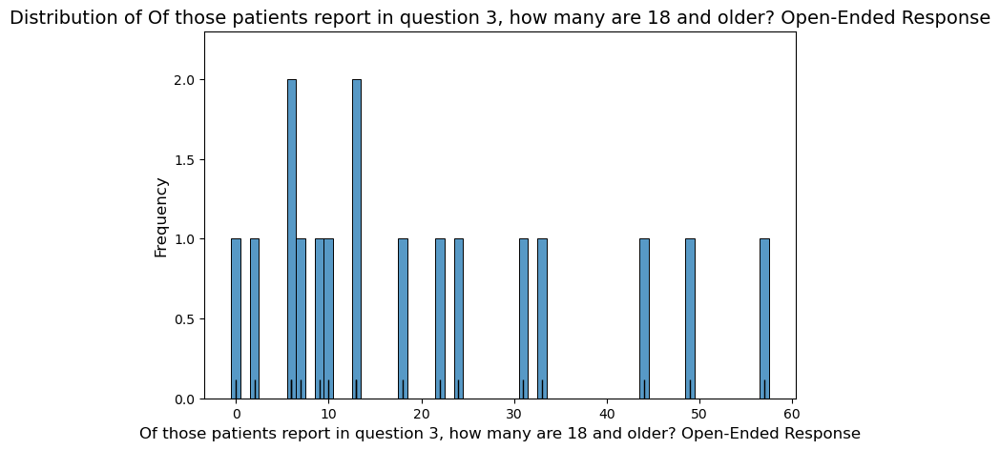

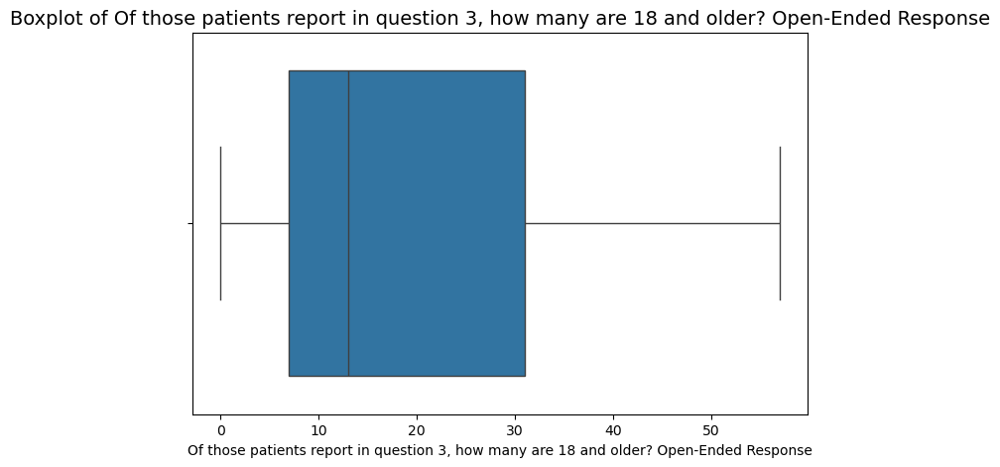

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 48 hours
____________________________________________________________________________________________________
count    17.000000
mean      3.588235
std      11.752972
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max      49.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 48 hours, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 48 hours:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                    

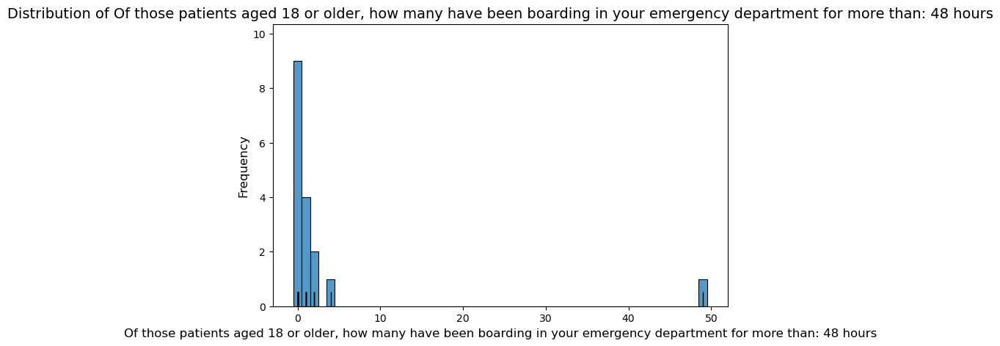

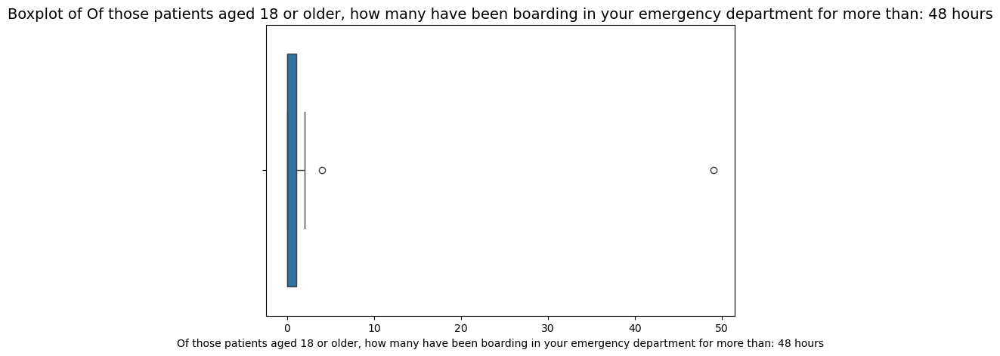

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >48 hours but less than one week
____________________________________________________________________________________________________
count    17.000000
mean      0.647059
std       0.996317
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >48 hours but less than one week, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >48 hours but less than one week:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or o

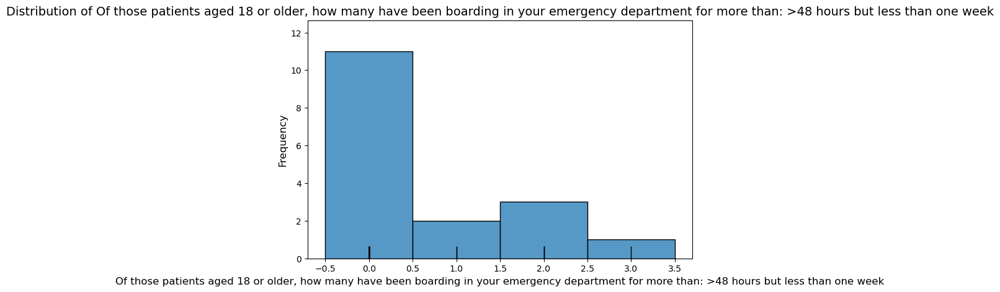

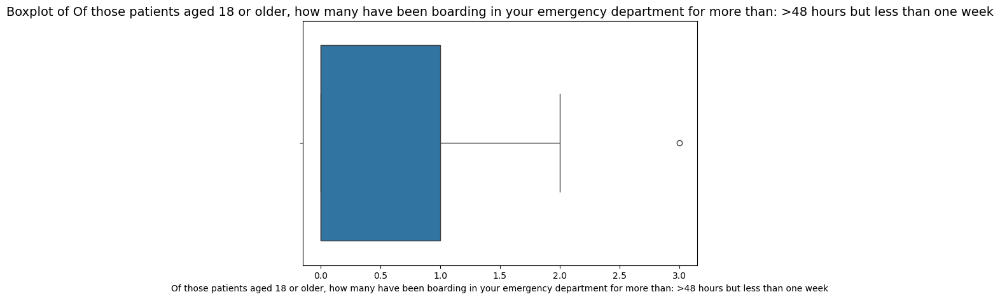

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 7 to 14 days
____________________________________________________________________________________________________
count    16.000000
mean      0.187500
std       0.403113
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 7 to 14 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 7 to 14 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0        

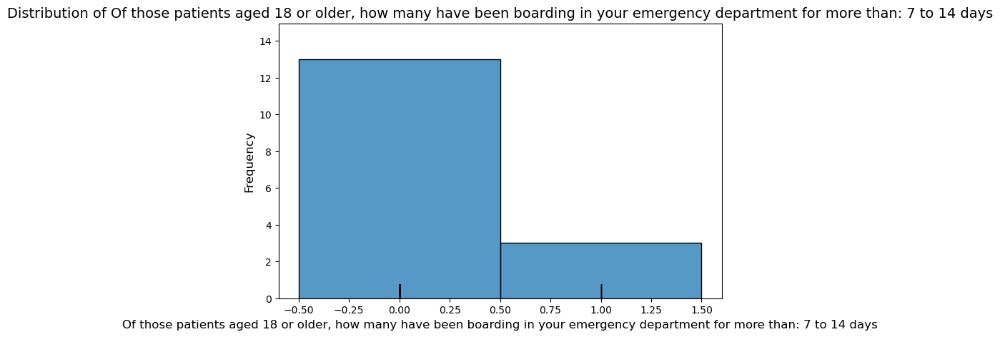

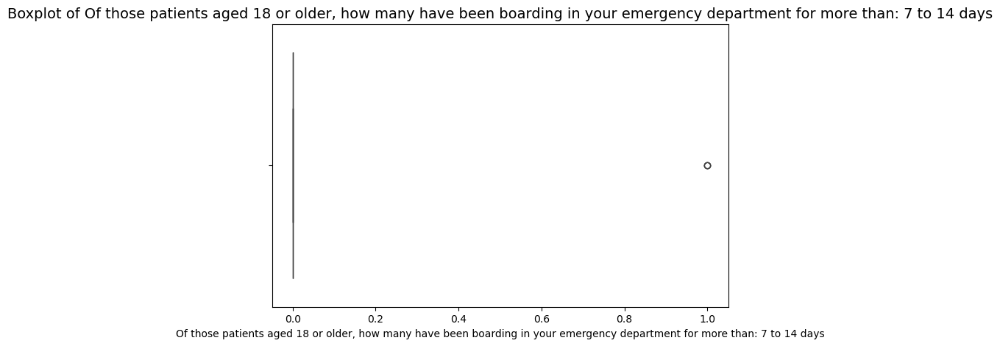

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 15 to 30 days
____________________________________________________________________________________________________
count    16.0000
mean      0.0625
std       0.2500
min       0.0000
25%       0.0000
50%       0.0000
75%       0.0000
max       1.0000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 15 to 30 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 15 to 30 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                     

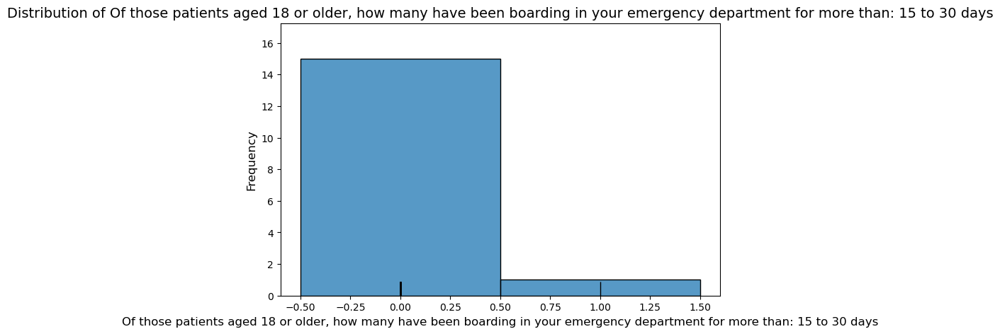

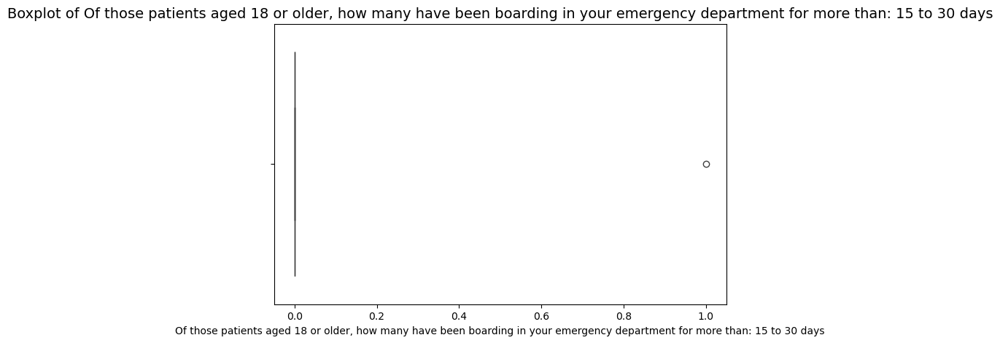

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 31 to 60 days
____________________________________________________________________________________________________
count    16.0000
mean      0.0625
std       0.2500
min       0.0000
25%       0.0000
50%       0.0000
75%       0.0000
max       1.0000
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 31 to 60 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 31 to 60 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                     

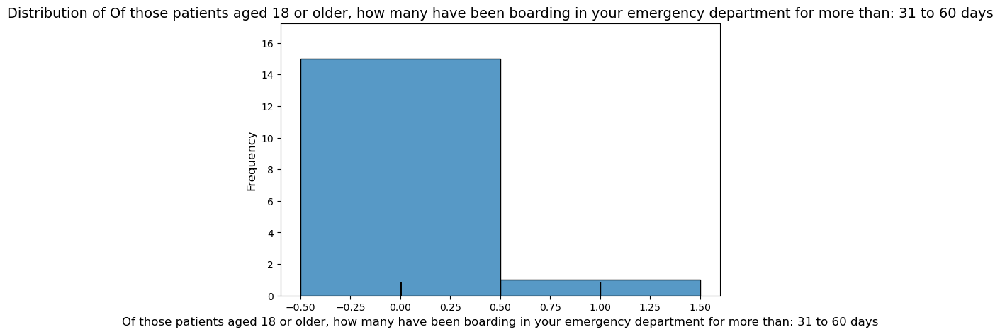

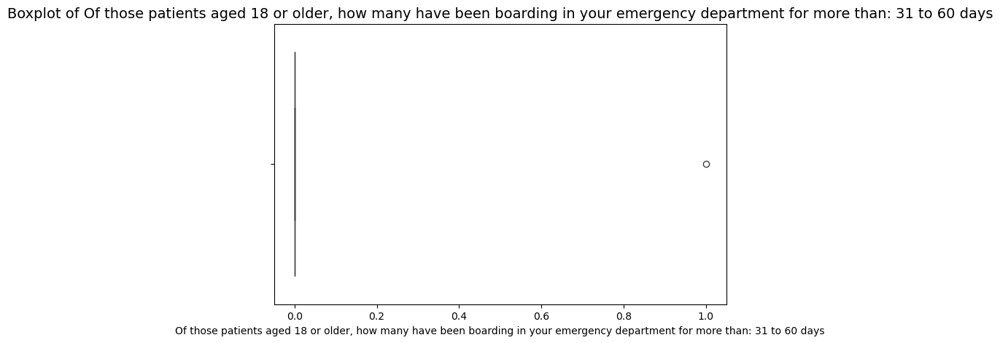

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 61 to 120 days
____________________________________________________________________________________________________
count    16.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 61 to 120 days, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: 61 to 120 days:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                                          

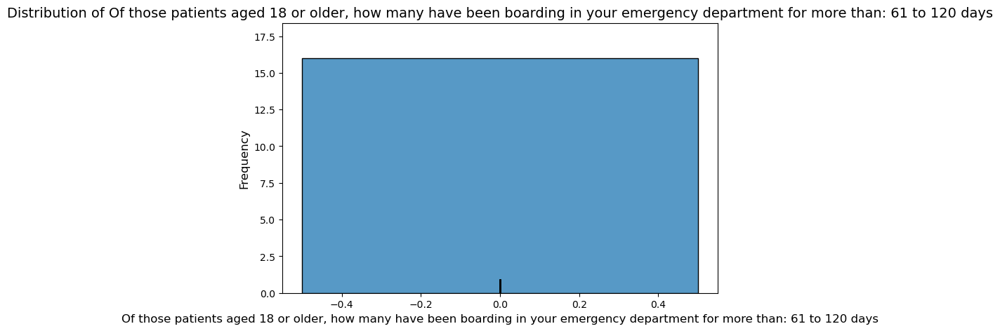

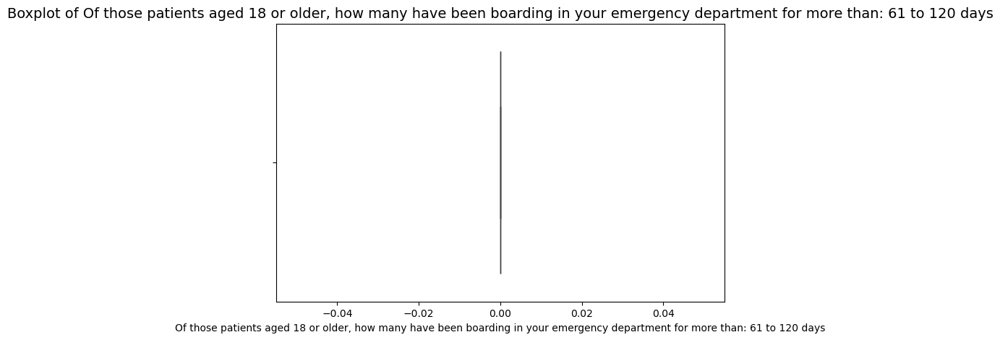

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >3 months
____________________________________________________________________________________________________
count    16.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >3 months, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many have been boarding in your emergency department for more than: >3 months:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ha...                            
0.0                                                    16   

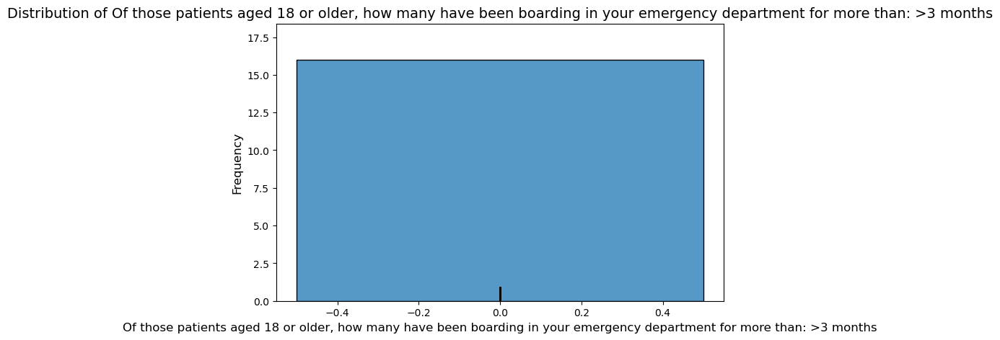

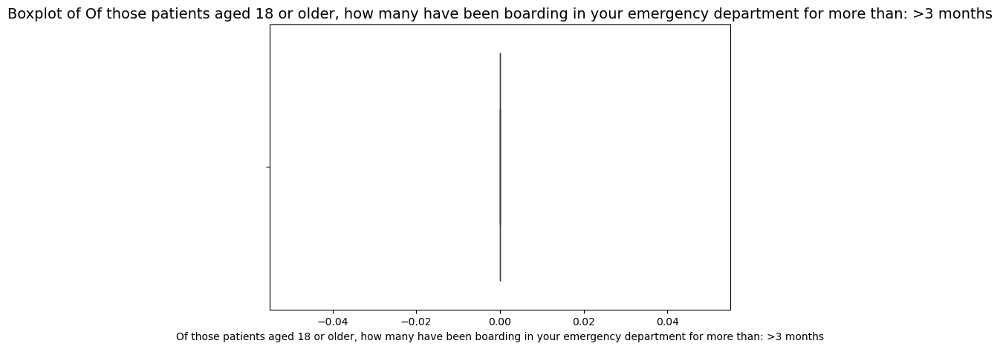

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Community Services:
____________________________________________________________________________________________________
count    14.000000
mean      0.428571
std       0.851631
min       0.000000
25%       0.000000
50%       0.000000
75%       0.750000
max       3.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Community Services:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Community Services::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 1

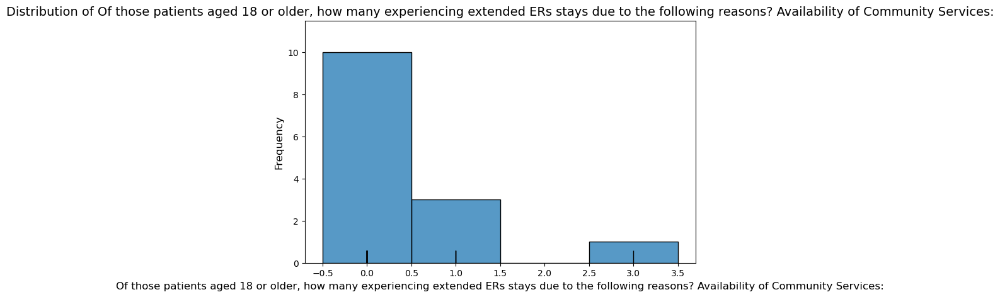

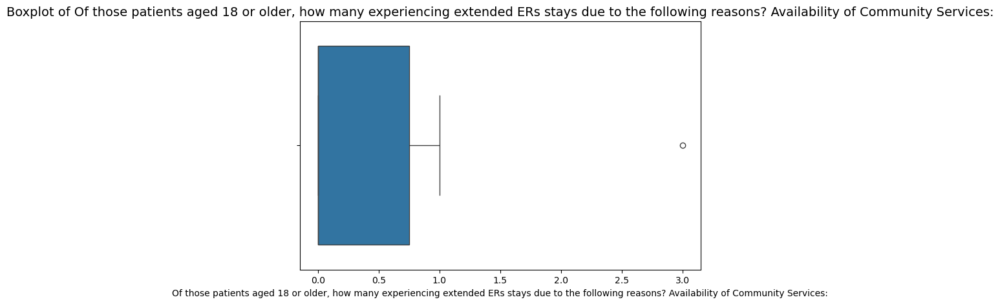

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in your hospital:
____________________________________________________________________________________________________
count    14.000000
mean      2.571429
std       6.641528
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      24.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in your hospital:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in your hospital::
__________________________________________________
                                           

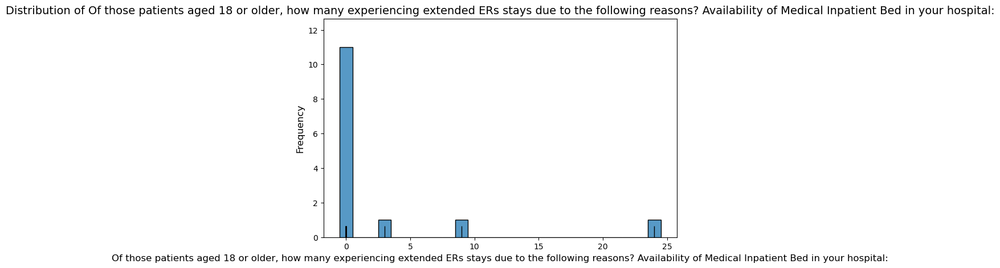

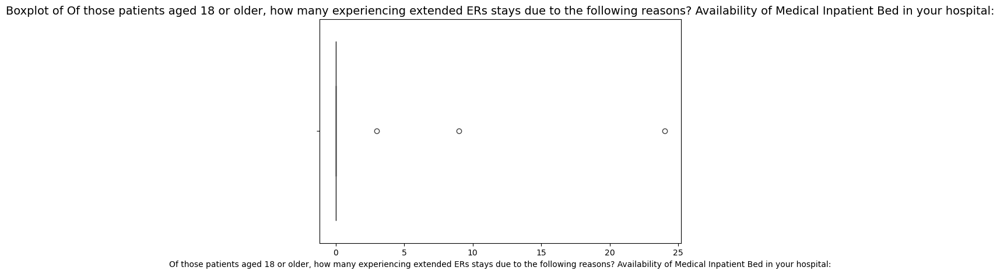

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in another hospital:
____________________________________________________________________________________________________
count    14.000000
mean      0.428571
std       0.755929
min       0.000000
25%       0.000000
50%       0.000000
75%       0.750000
max       2.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in another hospital:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Medical Inpatient Bed in another hospital::
__________________________________________________
                                  

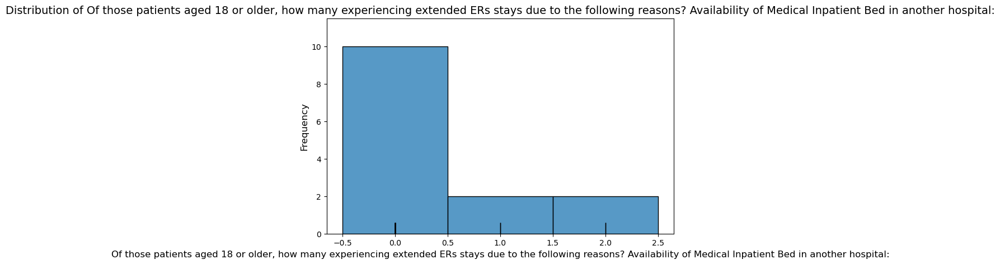

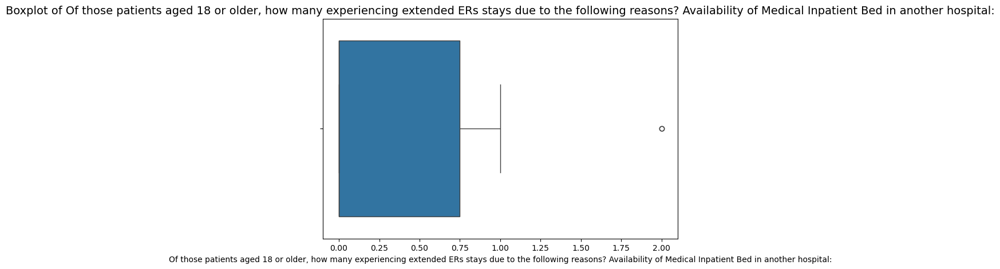

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:
____________________________________________________________________________________________________
count    14.000000
mean      0.071429
std       0.267261
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of PNMI / Residential Placement::
__________________________________________________
                                                    Count  Frequency_Rati

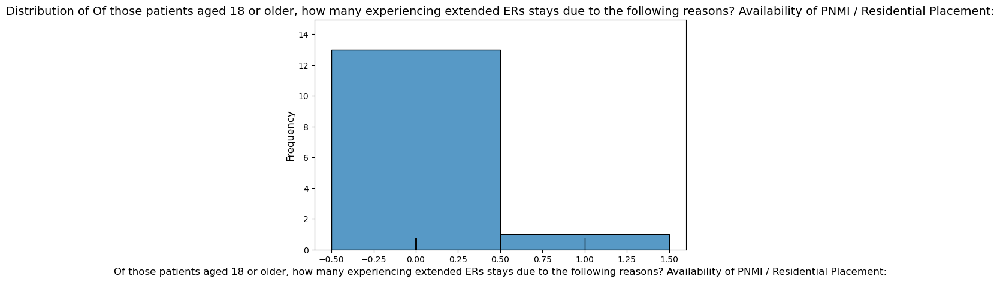

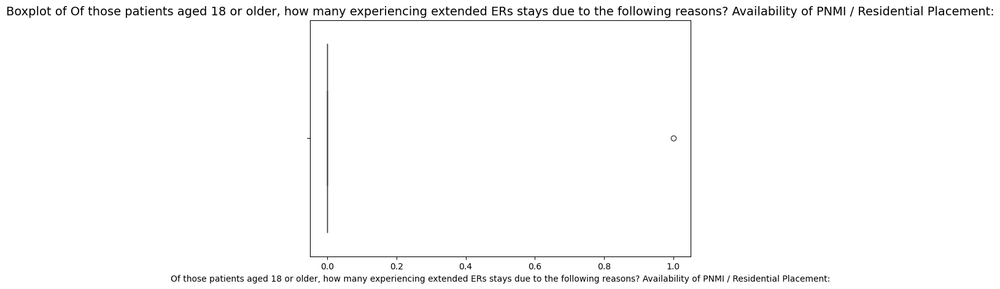

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Transport to Move Patient:
____________________________________________________________________________________________________
count    14.000000
mean      0.142857
std       0.363137
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Transport to Move Patient:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Transport to Move Patient::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 o

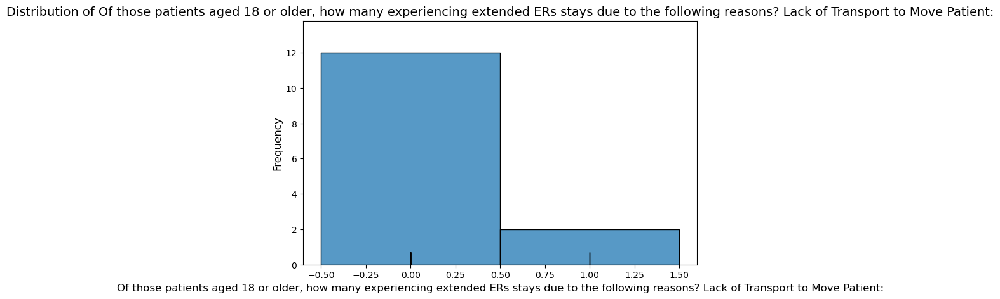

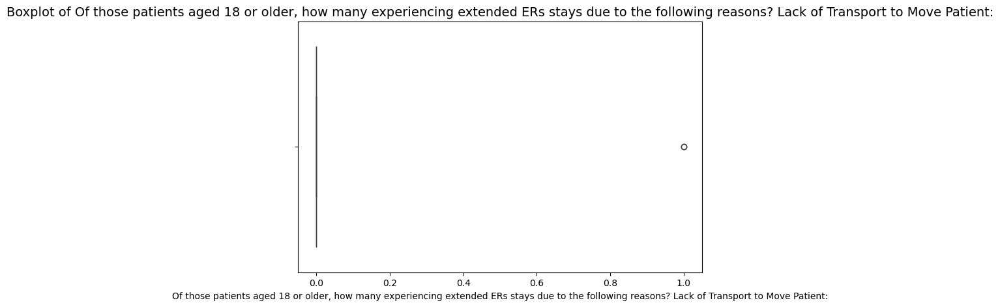

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Inpatient Psychiatric Bed:
____________________________________________________________________________________________________
count    17.000000
mean      0.588235
std       0.870260
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Inpatient Psychiatric Bed:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Inpatient Psychiatric Bed::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of 

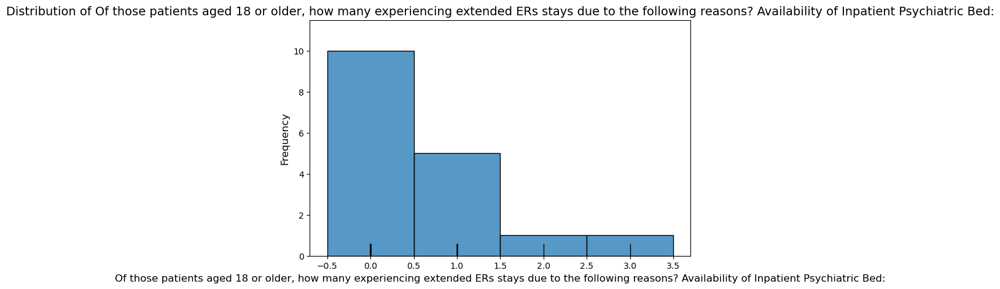

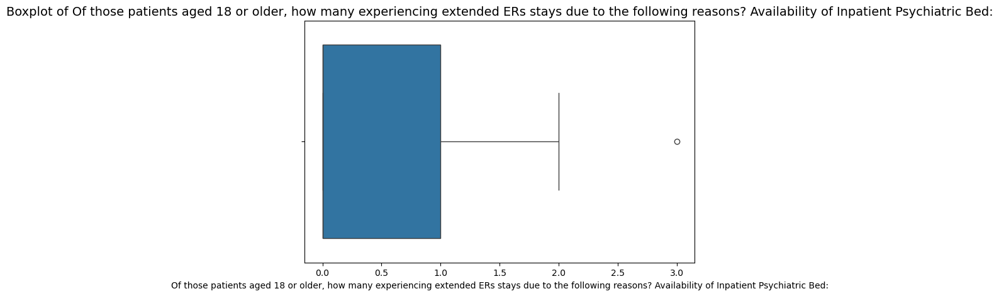

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Detox Bed:
____________________________________________________________________________________________________
count    14.0
mean      0.0
std       0.0
min       0.0
25%       0.0
50%       0.0
75%       0.0
max       0.0
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Detox Bed:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of Detox Bed::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...                            
0.0         

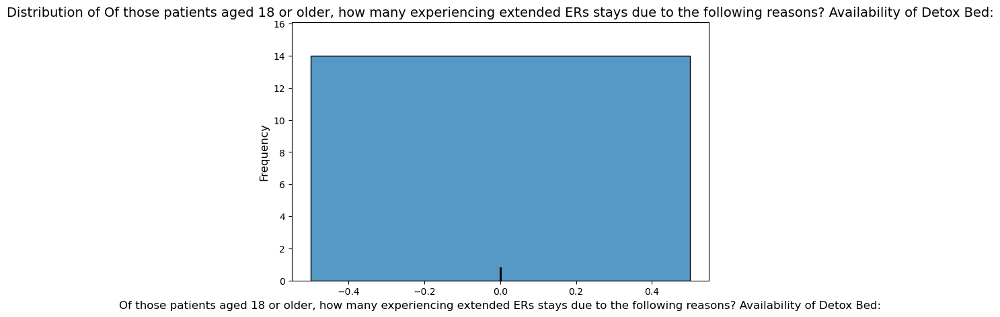

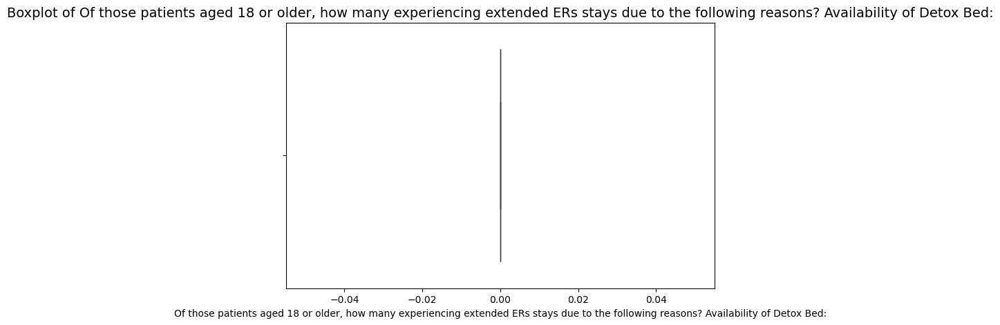

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of SNF bed:
____________________________________________________________________________________________________
count    15.000000
mean      0.466667
std       1.125463
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       4.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of SNF bed:, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Availability of SNF bed::
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...       

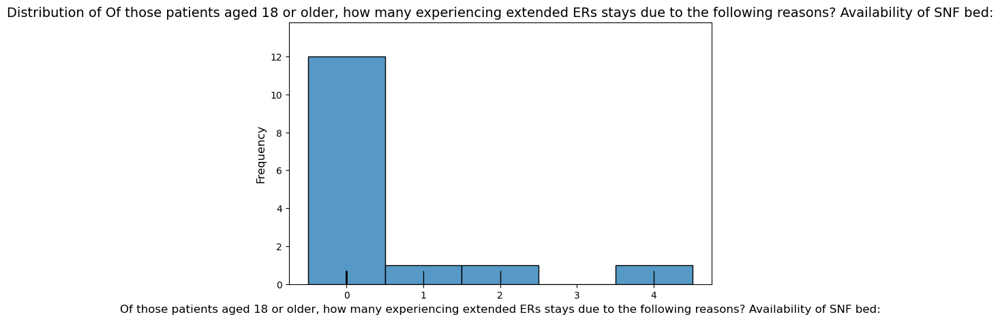

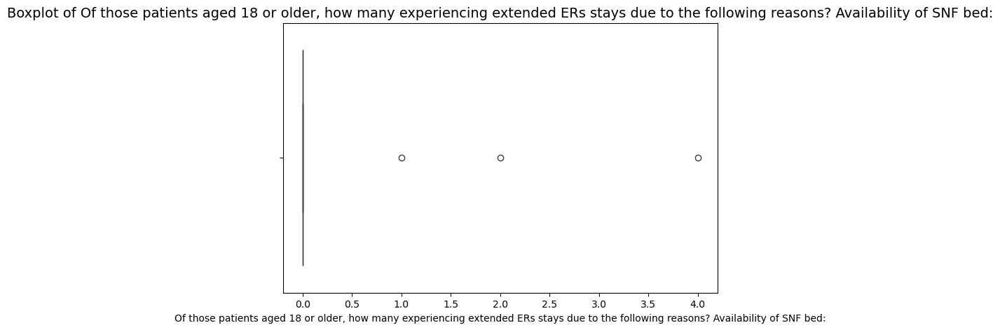

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Guardianship
____________________________________________________________________________________________________
count    15.000000
mean      0.133333
std       0.351866
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Guardianship, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Guardianship:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...                   

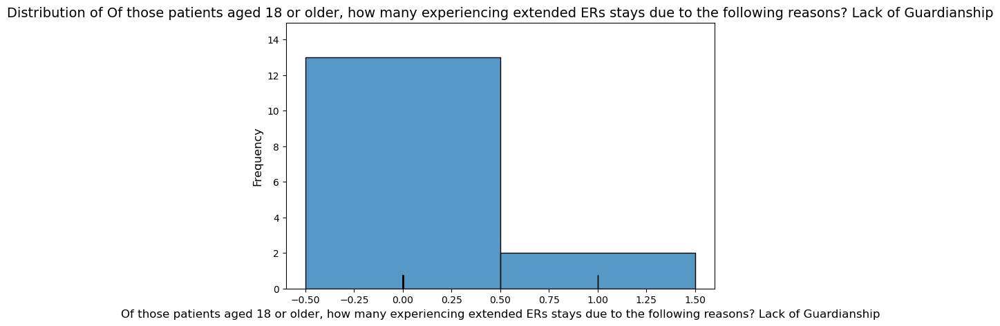

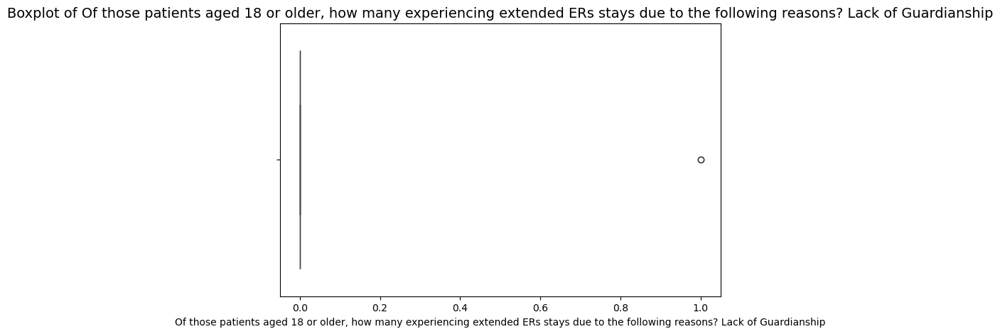

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Insurance
____________________________________________________________________________________________________
count    15.000000
mean      0.200000
std       0.560612
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Insurance, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Lack of Insurance:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients aged 18 or older, how many ex...                            

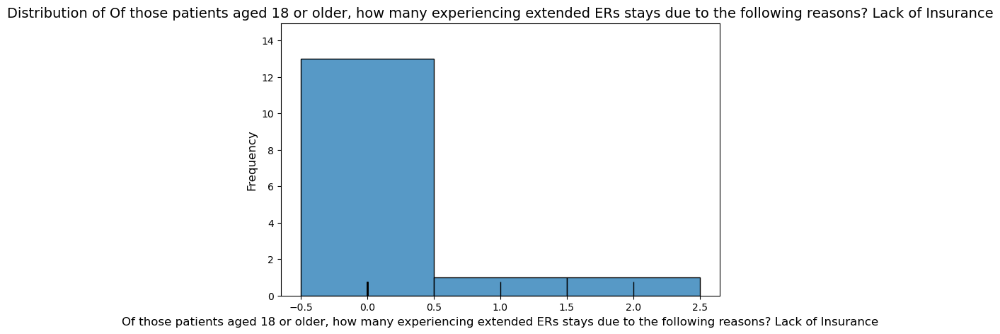

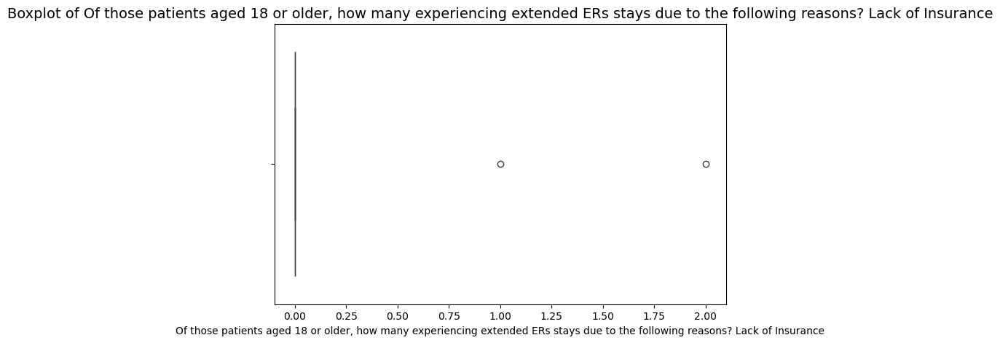

____________________________________________________________________________________________________
Attribute: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation
____________________________________________________________________________________________________
count    15.000000
mean      0.066667
std       0.258199
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation, dtype: float64


Frequency Distribution for Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation:
__________________________________________________
                            

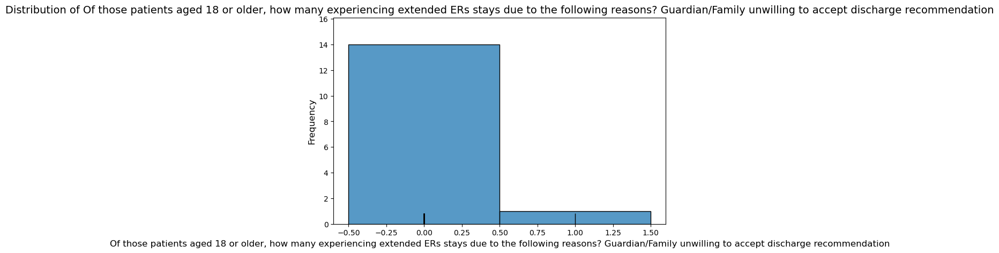

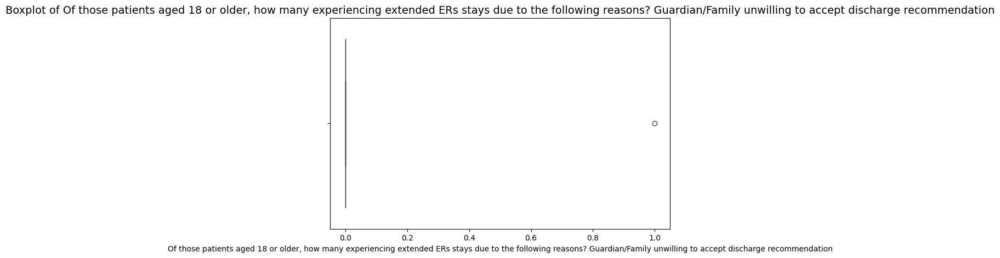

____________________________________________________________________________________________________
Attribute: Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response
____________________________________________________________________________________________________
count    18.000000
mean      0.777778
std       0.878204
min       0.000000
25%       0.000000
50%       1.000000
75%       1.000000
max       3.000000
Name: Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response, dtype: float64


Frequency Distribution for Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those reported in question 11, how many have...                            
0.

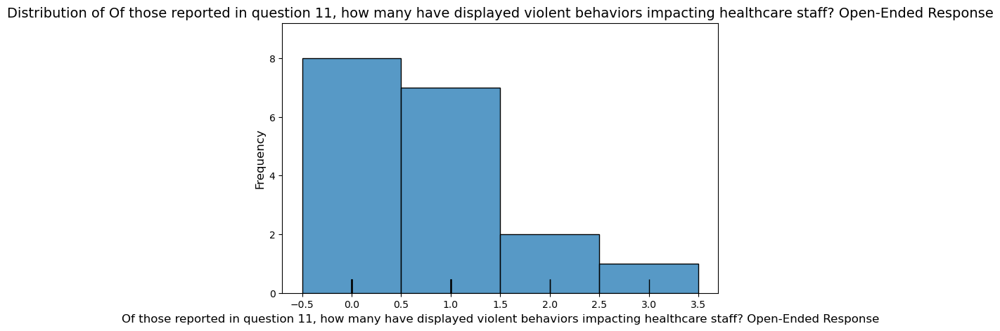

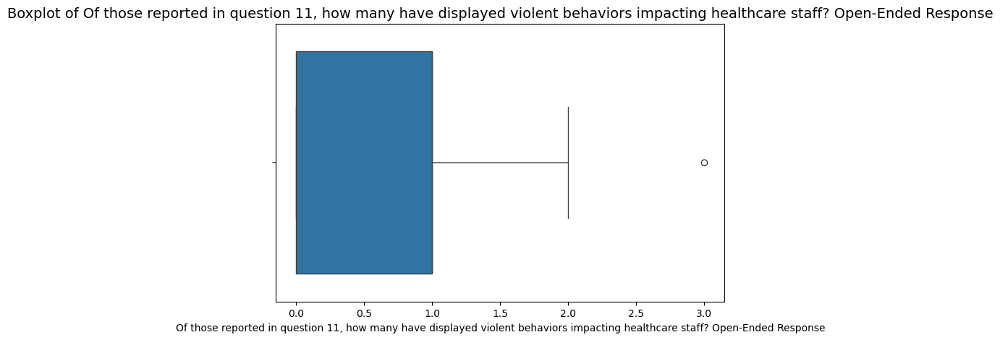

____________________________________________________________________________________________________
Attribute: If Yes, how many have been impacted in the past week?.1 Open-Ended Response
____________________________________________________________________________________________________
count    14.000000
mean      1.785714
std       3.555680
min       0.000000
25%       0.000000
50%       0.000000
75%       1.750000
max      10.000000
Name: If Yes, how many have been impacted in the past week?.1 Open-Ended Response, dtype: float64


Frequency Distribution for If Yes, how many have been impacted in the past week?.1 Open-Ended Response:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
If Yes, how many have been impacted in the past...                            
0.0                                                     9                 64.3
10.0                                                    2          

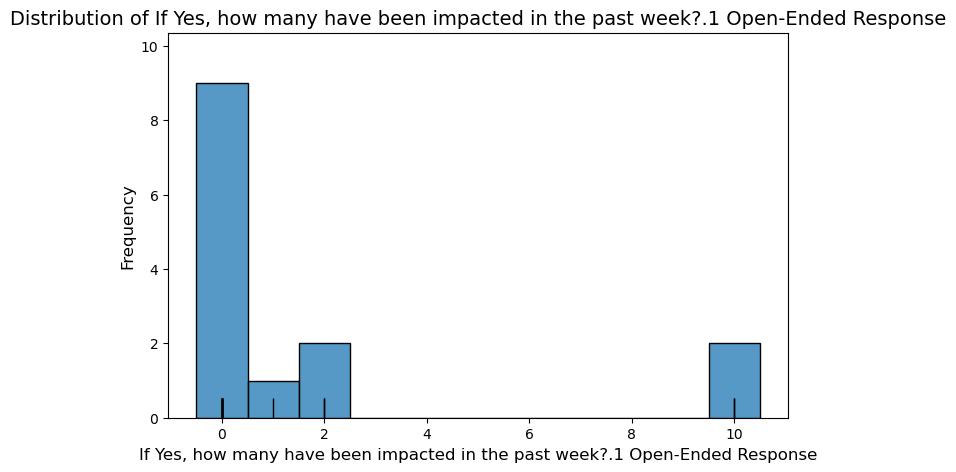

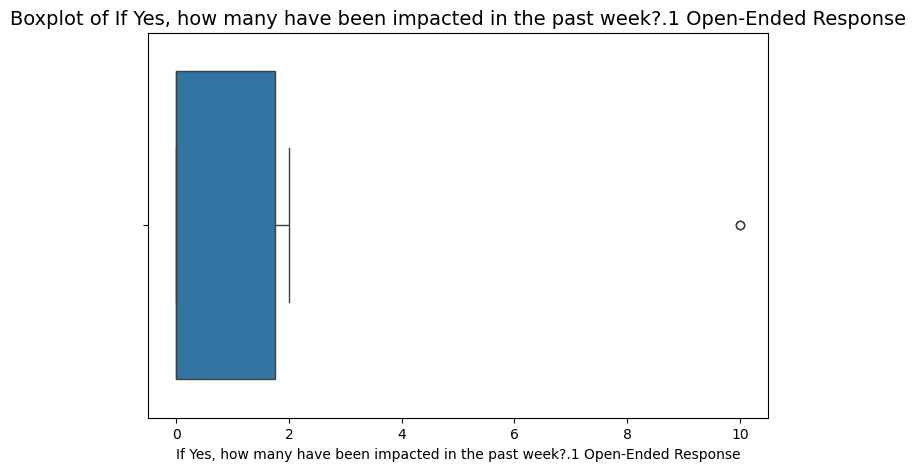

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)
____________________________________________________________________________________________________
count    14.000000
mean      3.642857
std       7.448357
min       0.000000
25%       0.000000
50%       0.000000
75%       3.250000
max      24.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital), dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital):
__________________________________________________
                                                 

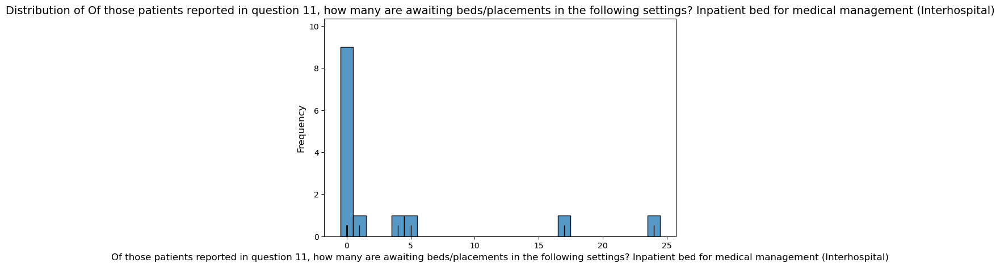

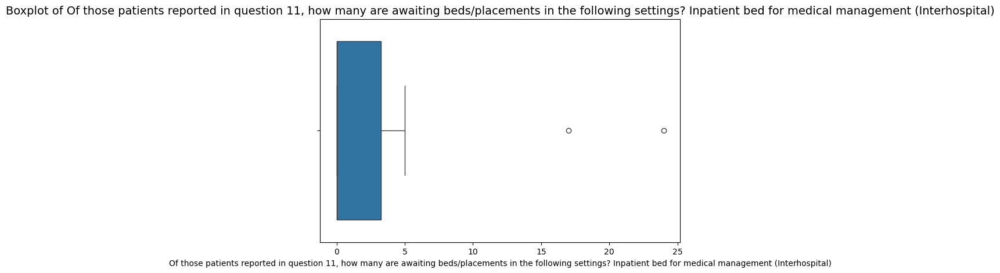

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)
____________________________________________________________________________________________________
count    15.000000
mean      0.266667
std       0.593617
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       2.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital), dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital):
__________________________________________________
                                                 

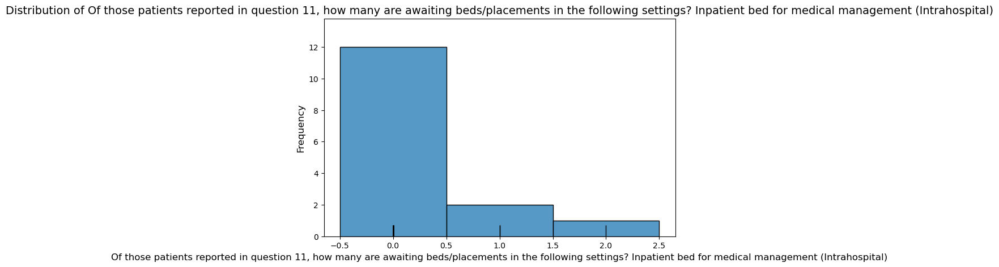

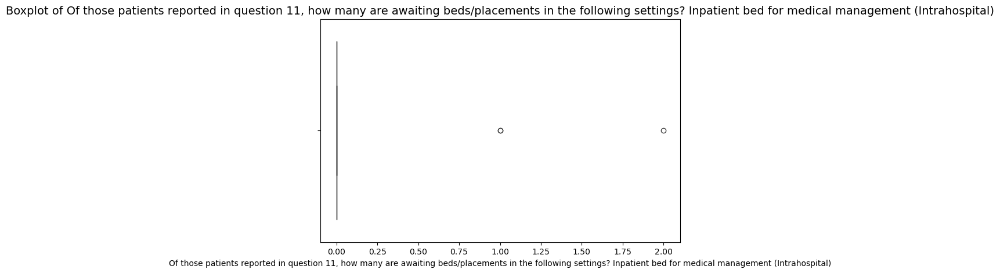

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility
____________________________________________________________________________________________________
count    13.000000
mean      0.076923
std       0.277350
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ... 

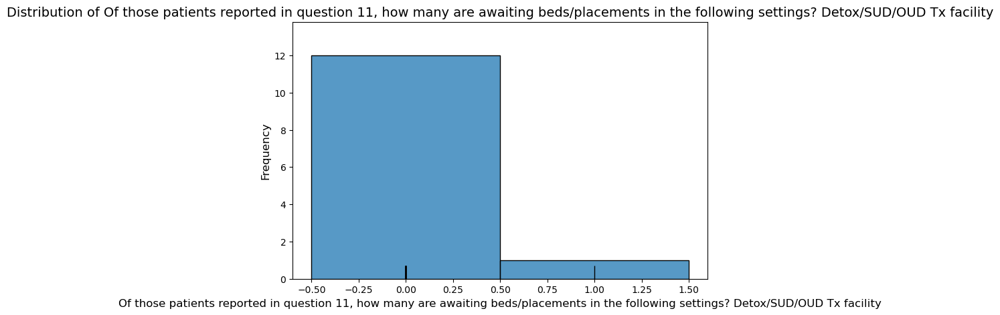

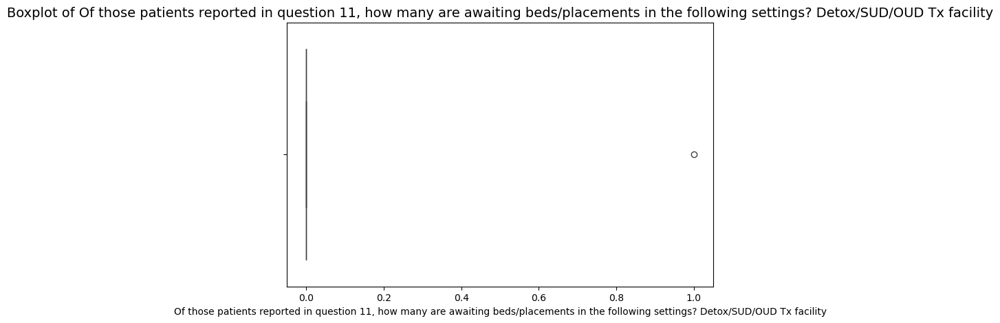

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric
____________________________________________________________________________________________________
count    17.000000
mean      0.882353
std       1.409005
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       5.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ...             

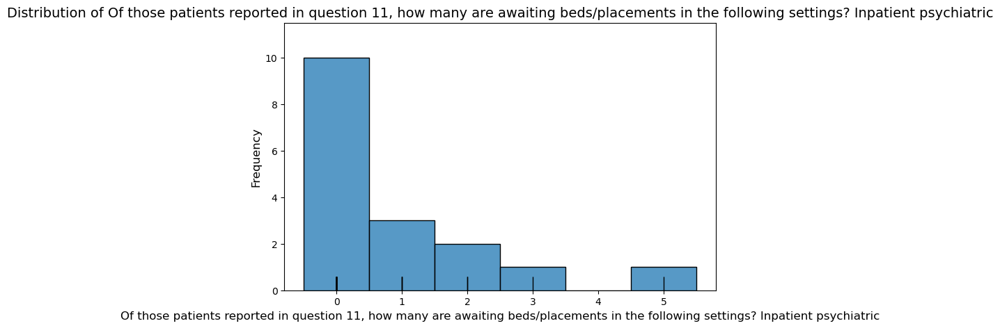

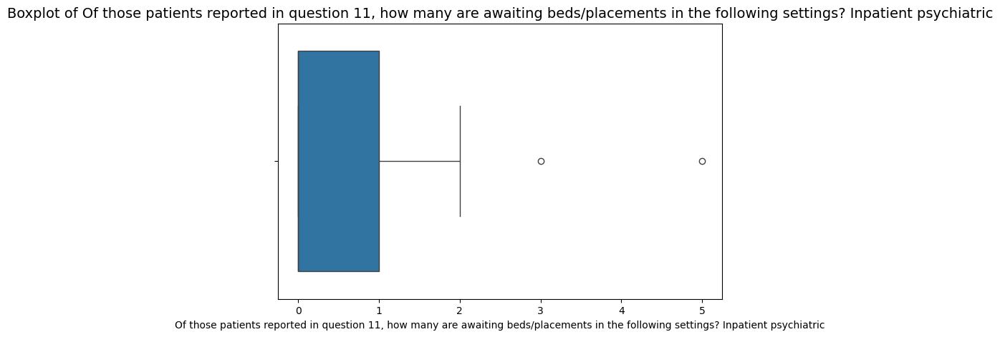

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF
____________________________________________________________________________________________________
count    15.000000
mean      0.600000
std       0.985611
min       0.000000
25%       0.000000
50%       0.000000
75%       1.000000
max       3.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ...                            
0.0                       

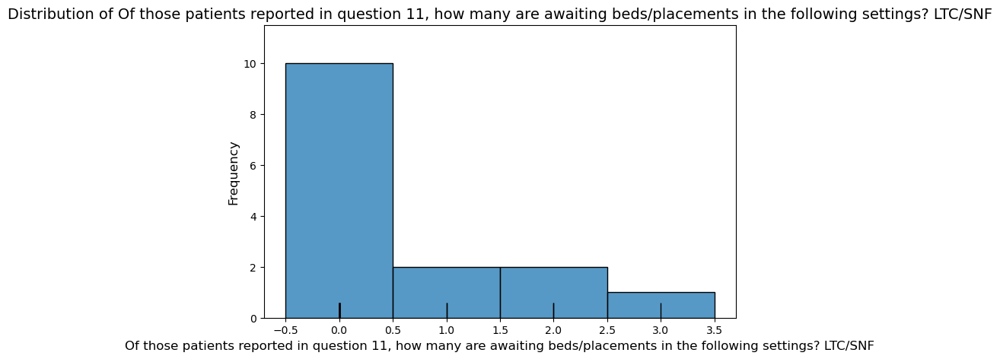

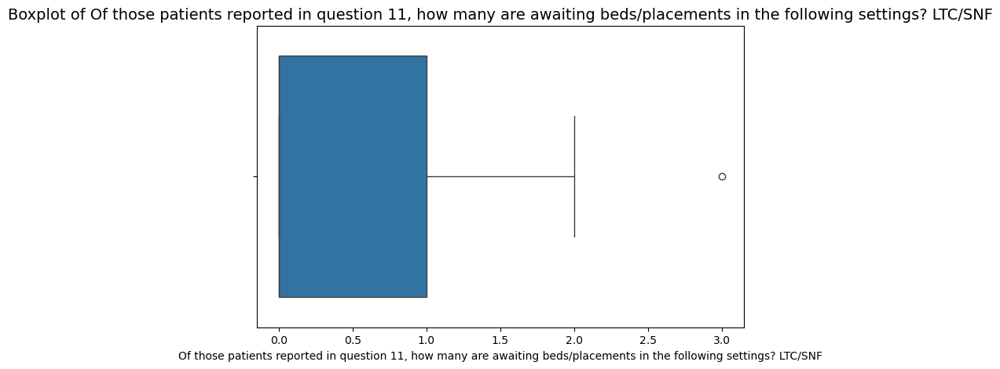

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility
____________________________________________________________________________________________________
count    14.000000
mean      0.071429
std       0.267261
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of tho

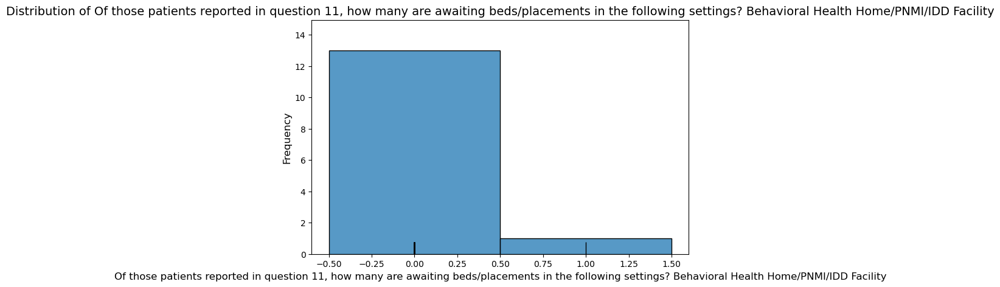

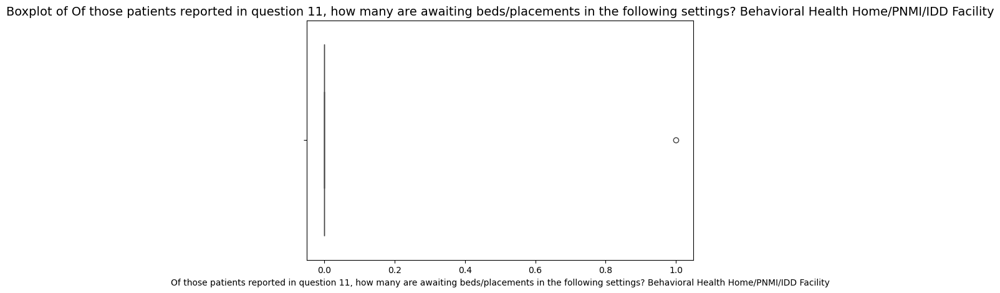

____________________________________________________________________________________________________
Attribute: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other
____________________________________________________________________________________________________
count    13.000000
mean      0.153846
std       0.375534
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max       1.000000
Name: Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other, dtype: float64


Frequency Distribution for Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other:
__________________________________________________
                                                    Count  Frequency_Ratio (%)
Of those patients reported in question 11, how ...                            
0.0                             

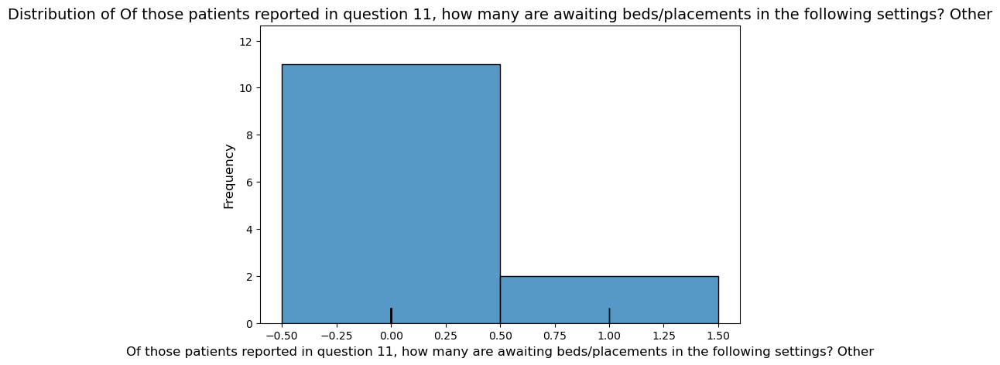

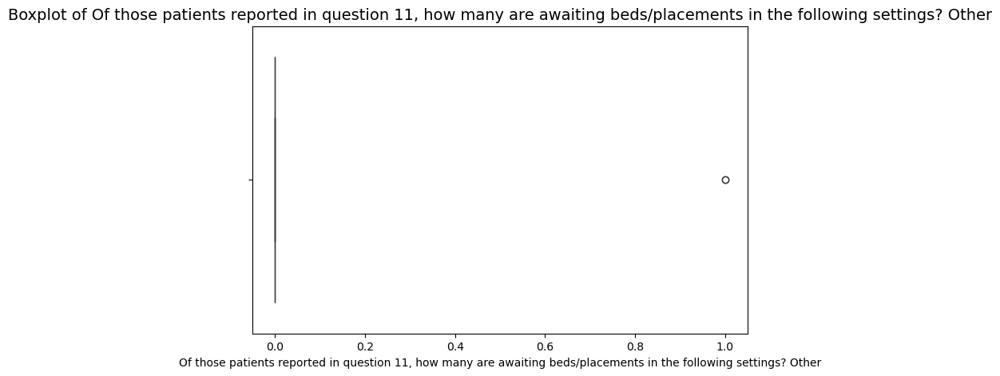

____________________________________________________________________________________________________
Attribute: region
____________________________________________________________________________________________________
count    25.000000
mean      3.720000
std       2.150969
min       1.000000
25%       2.000000
50%       4.000000
75%       6.000000
max       7.000000
Name: region, dtype: float64


Frequency Distribution for region:
__________________________________________________
        Count  Frequency_Ratio (%)
region                            
6.0         6                 24.0
1.0         6                 24.0
3.0         3                 12.0
2.0         3                 12.0
4.0         3                 12.0
7.0         2                  8.0
5.0         2                  8.0 


No significant outliers detected in region using Zscore with Threshold of 3.0 stds.

No significant outliers detected in region using IQR.

Plotting 'region' as discrete data.


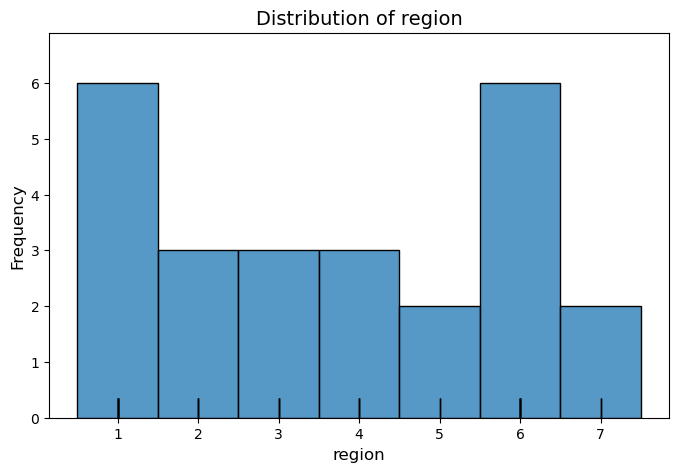

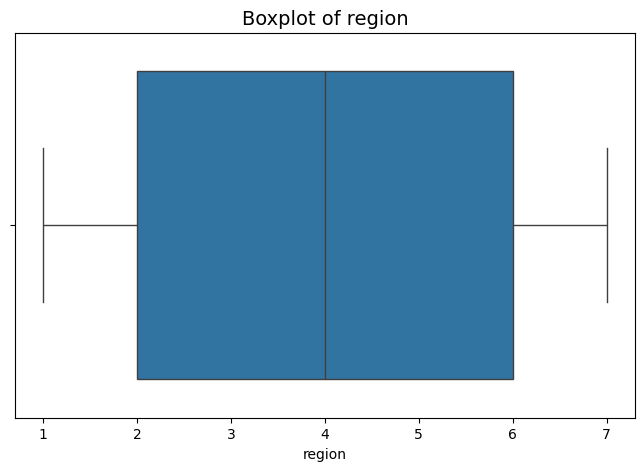

{'z_score_outliers': {'Collector ID': Index([], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):': Index([], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):': Index([23], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):': Index([19], dtype='int64'),
  'Total number of patients awaiting discharge to the following settings: Home Health:': Index([18], dtype='int64'),
  'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):': Index([0], dtype='int64'),
  'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):': Index([], dtype='int64'),
  'Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Resident

In [19]:
utils.numerical_eda(numerical_df)

####  1: Total number of patients awaiting discharge to the following settings:

,Total number of patients awaiting discharge to the following settings,Number of patients
0,Skilled Nursing Facility (SNF),108.0
1,Long Term Care Hospital (LTC),78.0
2,Residential Care Facility (RCF),38.0
3,Home Health,74.0


| Total number of patients awaiting discharge to the following settings   |   Number of patients |
|:------------------------------------------------------------------------|---------------------:|
| Skilled Nursing Facility (SNF)                                          |                  108 |
| Long Term Care Hospital (LTC)                                           |                   78 |
| Residential Care Facility (RCF)                                         |                   38 |
| Home Health                                                             |                   74 |


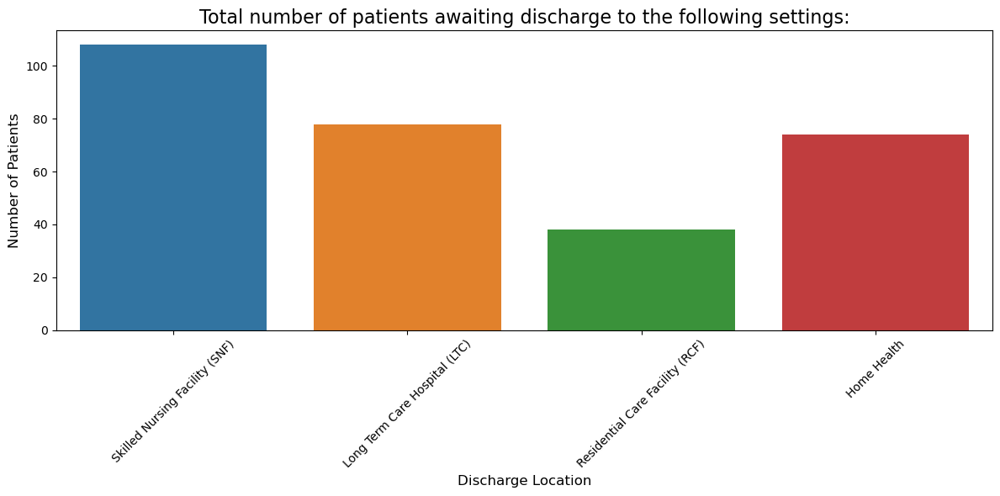

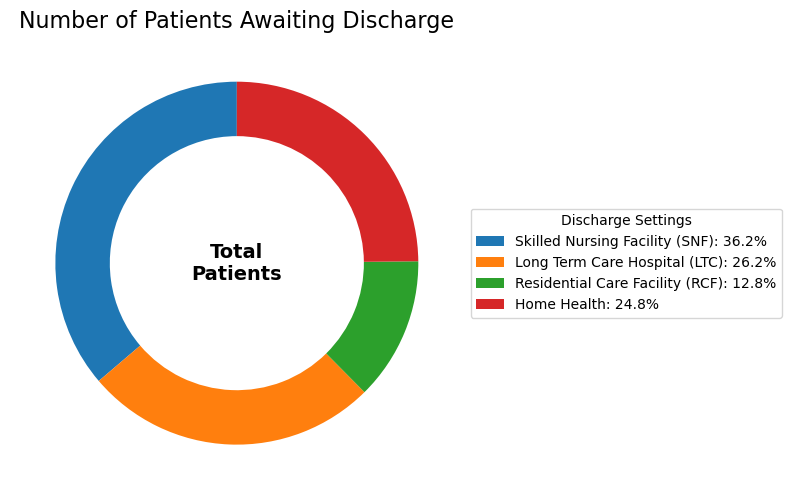

In [271]:
prefix = "Total number of patients awaiting discharge to the following settings:"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
filtered_columns.sum()

sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split(':')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split(':').str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)

display(sums_df)
print(sums_df.to_markdown(index=False))

plt.figure(figsize=(12, 6))
sns.barplot(x=column_name, y='Number of patients', hue=column_name, data=sums_df)
plt.title(prefix, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("figs/q1_bar.png")
plt.show()

# donut plot
sums_df["Percentage"] = sums_df["Number of patients"] / sums_df["Number of patients"].sum() * 100
plt.figure(figsize=(8, 8))
wedges, texts = plt.pie(
    sums_df["Number of patients"],
    labels=None, 
    startangle=90,
    wedgeprops={'width': 0.3},  
    textprops={'fontsize': 10}
)
plt.title("Number of Patients Awaiting Discharge", fontsize=16)
plt.text(0, 0, "Total\nPatients", ha='center', va='center', fontsize=14, weight='bold')
legend_labels = [
    f"{payer}: {percentage:.1f}%" for payer, percentage in zip(sums_df[column_name], sums_df["Percentage"])
]
plt.legend(
    wedges,
    legend_labels,
    title="Discharge Settings",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10
)
plt.tight_layout()
plt.savefig("figs/q1_donut.png")
plt.show()


/var/folders/92/fsnyg0n57cx169y7qtzjg3_w0000gn/T/ipykernel_42965/412703951.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_columns["region"] = numerical_df["region"].copy()


|   region |   Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF): |   Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC): |   Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF): |   Total number of patients awaiting discharge to the following settings: Home Health: |
|---------:|---------------------------------------------------------------------------------------------------------:|--------------------------------------------------------------------------------------------------------:|----------------------------------------------------------------------------------------------------------:|--------------------------------------------------------------------------------------:|
|        1 |                                                                                                       43 |                                     

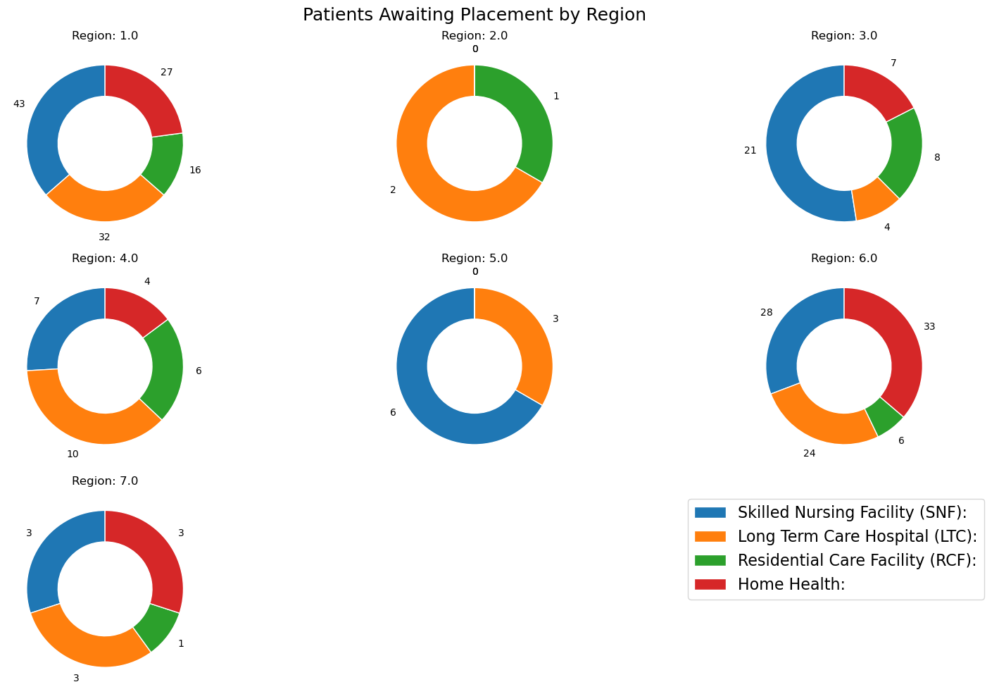

In [317]:
prefix = "Total number of patients awaiting discharge to the following settings:"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
filtered_columns["region"] = numerical_df["region"].copy()

# Display the filtered DataFrame
filtered_columns.sum()

df = pd.DataFrame(filtered_columns.groupby("region").sum()).reset_index()
print(df.to_markdown(index=False))



fig, axes = plt.subplots(3, 3, figsize=(15, 10))

axes = axes.flatten()

# Create a donut plot for each row
for i, (index, row) in enumerate(df.iterrows()):
    values = row[1:]  # Exclude the 'region' column
    
    wedges, _, _ = axes[i].pie(
        values,
        autopct=lambda p: f'{int(round(p * sum(values) / 100))}',
        startangle=90,
        pctdistance=1.2,
        wedgeprops={"width": 0.4, "edgecolor": "w"},
    )
    axes[i].set_title(f'Region: {row["region"]}')
    

labels = [col.split(":", maxsplit=1)[-1].strip() for col in df.columns[1:]]  
plt.legend(wedges, labels, loc="best", fontsize=16)
plt.suptitle("Patients Awaiting Placement by Region", fontsize=18)

for ax in axes[n_plots:]:
    ax.axis("off")

plt.tight_layout()
plt.savefig("figs/regions_donut.png")
plt.show()

### 2: Of the total patients reported in Question 1, how many patients require 1 to 1 supervision?

,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision",Number of patients
0,Skilled Nursing Facility (SNF):,4.0
1,Long Term Care Hospital (LTC):,10.0
2,Residential Care Facility (RCF):,3.0


| Of the total patients reported in Question 1, how many patients require 1 to 1 supervision   |   Number of patients |
|:---------------------------------------------------------------------------------------------|---------------------:|
| Skilled Nursing Facility (SNF):                                                              |                    4 |
| Long Term Care Hospital (LTC):                                                               |                   10 |
| Residential Care Facility (RCF):                                                             |                    3 |


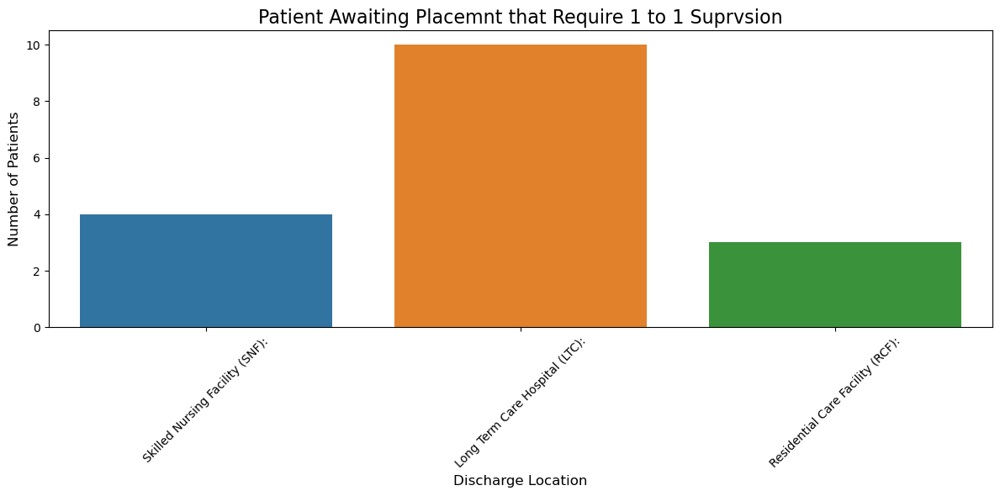

In [318]:
prefix = "Of the total patients reported in Question 1, how many patients require 1 to 1 supervision?"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
filtered_columns.sum()
sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)
sums_df = sums_df[sums_df['Number of patients'] != 0]

display(sums_df)
print(sums_df.to_markdown(index=False))

title = "Patient Awaiting Placemnt that Require 1 to 1 Suprvsion"
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=column_name, y='Number of patients', hue=column_name, data=sums_df)
plt.title(title, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("figs/q2.png")
plt.show()


### 3: Of the total patients reported in Question 1, how many patients are residents of other states?

,Out of State Residents Waiting on Placement,Number of patients
0,Skilled Nursing Facility (SNF):,1.0
1,Long Term Care Hospital (LTC):,1.0
3,Home Health:,3.0


| Out of State Residents Waiting on Placement   |   Number of patients |
|:----------------------------------------------|---------------------:|
| Skilled Nursing Facility (SNF):               |                    1 |
| Long Term Care Hospital (LTC):                |                    1 |
| Home Health:                                  |                    3 |


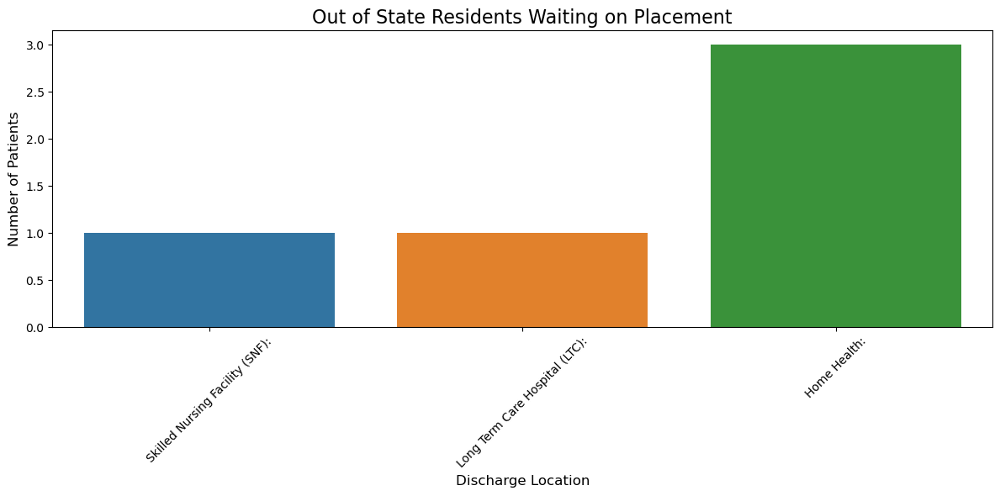

In [322]:
prefix = "Of the total patients reported in Question 1, how many patients are residents of other states"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
title = "Out of State Residents Waiting on Placement"
# Display the filtered DataFrame
filtered_columns.sum()

sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()

sums_df.rename(columns={'index': title, 0:'Number of patients'}, inplace=True)
sums_df = sums_df[sums_df['Number of patients'] != 0]

display(sums_df)
print(sums_df.to_markdown(index=False))


# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=title, y='Number of patients', hue=title, data=sums_df)
plt.title(title, fontsize=16)
plt.xlabel('Discharge Location', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("figs/q3.png")
plt.show()


#### 4-7: Of the total patients reported in Question 1, how many patients have been awaiting discharge for 7-13 days?

,Question,Sum,Time Interval,Discharge Location
0,"Of the total patients reported in Question 1, ...",30.0,7-13 days,Skilled Nursing Facility (SNF)
1,"Of the total patients reported in Question 1, ...",18.0,7-13 days,Long Term Care Hospital (LTC)
2,"Of the total patients reported in Question 1, ...",22.0,7-13 days,Residential Care Facility (RCF)
3,"Of the total patients reported in Question 1, ...",26.0,7-13 days,Home Health
4,"Of the total patients reported in Question 1, ...",18.0,14-29 days,Skilled Nursing Facility (SNF)
5,"Of the total patients reported in Question 1, ...",18.0,14-29 days,Long Term Care Hospital (LTC)
6,"Of the total patients reported in Question 1, ...",21.0,14-29 days,Residential Care Facility (RCF)
7,"Of the total patients reported in Question 1, ...",6.0,14-29 days,Home Health
8,"Of the total patients reported in Question 1, ...",17.0,30 days - 6 months,Skilled Nursing Facility (SNF)
9,"Of the total patients reported in Question 1, ...",40.0,30 days - 6 months,Long Term Care Hospital (LTC)


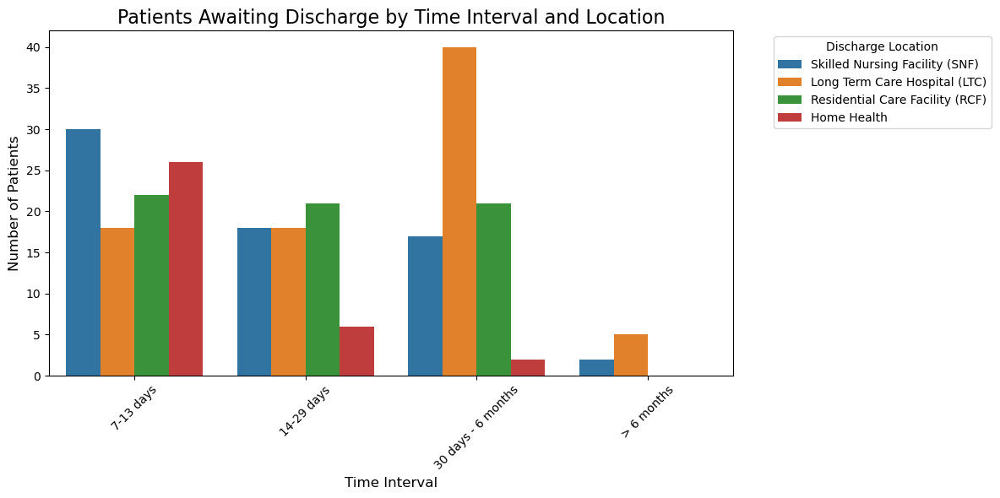

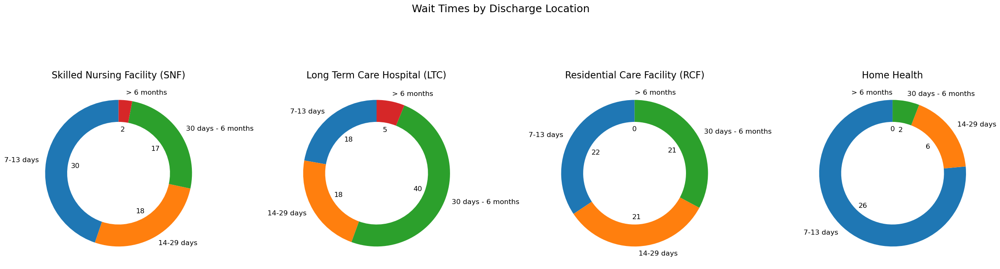

In [261]:
prefix = "Of the total patients reported in Question 1, how many patients have been awaiting discharge for"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

# Display the filtered DataFrame
col_sums = filtered_columns.sum()
col_sums

def parse_question(question):
    # Regex to extract the time interval and discharge location
    time_match = re.search(r'for (.+?)\?', question)
    location_match = re.search(r'\? (.+?):$', question)

    time_interval = time_match.group(1) if time_match else None
    discharge_location = location_match.group(1) if location_match else None

    return time_interval, discharge_location


sums_df = pd.DataFrame(col_sums).reset_index()
sums_df.columns = ['Question', 'Sum']
# Apply the parsing function to the DataFrame and create new columns
sums_df[['Time Interval', 'Discharge Location']] = sums_df['Question'].apply(lambda x: pd.Series(parse_question(x)))
sums_df = sums_df.replace({
    "more than 30 days but less than 6 months": "30 days - 6 months",
    "more than 6 months": "> 6 months"
})
display(sums_df)

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='Time Interval', y='Sum', hue='Discharge Location', data=sums_df)
plt.title('Patients Awaiting Discharge by Time Interval and Location', fontsize=16)
plt.xlabel('Time Interval', fontsize=12)
plt.ylabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Discharge Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("figs/q4-7_bar.png")
plt.show()

# donut plot
locations = sums_df["Discharge Location"].unique()
time_intervals = sums_df["Time Interval"].unique()

fig, axes = plt.subplots(1, len(locations), figsize=(24, 8))
for i, location in enumerate(locations):
    ax = axes[i]
    subset = sums_df[sums_df["Discharge Location"] == location]
    sizes = subset["Sum"]
    labels = subset["Time Interval"]
    wedges, texts, autotexts = ax.pie(
        sizes,
        labels=labels, 
        startangle=90,
        wedgeprops={'width': 0.3}, 
        autopct=lambda p: f'{int(round(p * sum(sizes) / 100))}',
        textprops={'fontsize': 12}
    )
    ax.set_title(location, fontsize=16)
fig.suptitle("Wait Times by Discharge Location", fontsize=18)
plt.tight_layout()
plt.savefig("figs/q4-7_donut.png")
plt.show()


### 8-10: Of the total patients reported in Question 1, how many require:

,Number of patients awaiting placement that require:,Number of patients
0,short-term rehabilitation beds in SNFs,70.0
1,PT/OT before they can be discharged,108.0
2,long-term care beds in SNFs,40.0


| Number of patients awaiting placement that require:   |   Number of patients |
|:------------------------------------------------------|---------------------:|
| short-term rehabilitation beds in SNFs                |                   70 |
| PT/OT before they can be discharged                   |                  108 |
| long-term care beds in SNFs                           |                   40 |


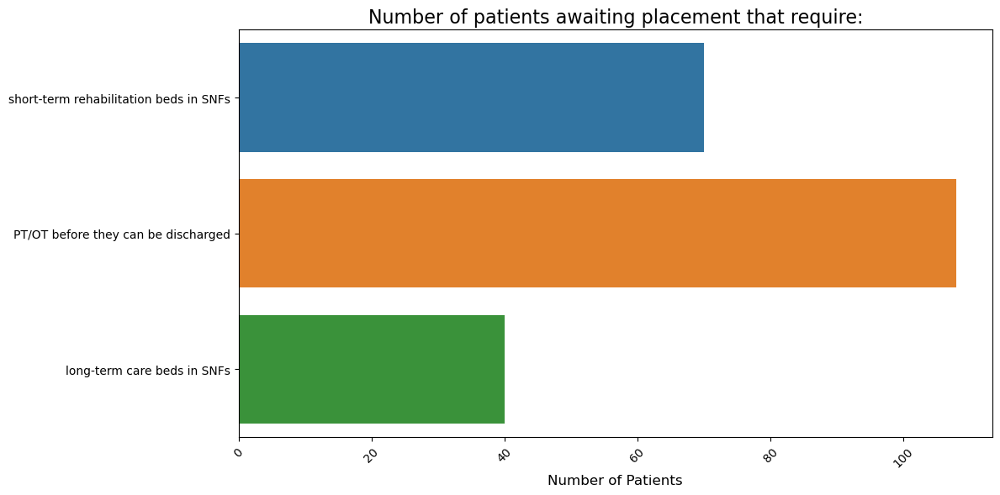

In [266]:
prefix = "Of the total patients reported in Question 1, how many require"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
title = "Number of patients awaiting placement that require:"

# Display the filtered DataFrame
filtered_columns.sum()


sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
text = sums_df['index'].iloc[0]

# Use re.split to split and retain "require" as a separate element
parts = re.split(r'(require)', text)
column_name = parts[0].strip() + ' ' + parts[1] + ':'

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('require').str[1].str.strip()
sums_df['index'] = sums_df['index'].str.split('?').str[0].str.strip()


sums_df.rename(columns={'index': title, 0:'Number of patients'}, inplace=True)


sums_df.iloc[1, 0] = 'PT/OT before they can be discharged'

display(sums_df)
print(sums_df.to_markdown(index=False))

# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(y=title, x='Number of patients', hue=title, data=sums_df)
plt.title(title, fontsize=16)
plt.ylabel('', fontsize=12)
plt.xlabel('Number of Patients', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("figs/q8-10.png")
plt.show()

### 11-17) 

In [211]:
prefix = "Of the total number of patients reported in Question 1, please provide"
filtered_columns = numerical_df.filter(like=prefix, axis=1)

#Display the filtered DataFrame
filtered_columns.sum()
sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()


def reshape_table(df, index_column, value_column):
    """
    Reshapes a DataFrame where long question text is split into 'Group' and 'Question' columns.
    
    Args:
        df (pd.DataFrame): The input DataFrame.
        index_column (str): The column name containing the full question text.
        value_column (str): The column name containing the values (e.g., response counts).
    """
    # Extract group name and main question
    df["Group"] = df[index_column].str.extract(r": (.+?):?$")
    df["Question"] = df[index_column].str.split(":").str[0]
    
    # Drop the original index column
    df = df.drop(columns=[index_column])
    
    # Pivot the table
    reshaped_df = df.pivot(index="Group", columns="Question", values=value_column).reset_index()
    
    # Clean column names
    reshaped_df.columns.name = None
    reshaped_df.rename_axis(None, inplace=True)
    
    return reshaped_df

complications = sums_df.loc[0:3, :].copy()
index_column="index"
new_column_name="Of the patients awaiting discharge:"
complications[index_column] = complications[index_column].str.extract(r'provide the (.+?):')[0].str.capitalize()
complications.rename(columns={index_column: new_column_name}, inplace=True)
print(complications.to_markdown(index=False))



| Of the patients awaiting discharge:                                                                                                         |   0 |
|:--------------------------------------------------------------------------------------------------------------------------------------------|----:|
| Number awaiting discharge to snf beds with geri-psych capabilities                                                                          |  14 |
| Number of patients awaiting discharge who require snf care and tracheostomy and percutaneous endoscopic gastrostomy (ie. "trached & peged") |   6 |
| Number of patients with dementia diagnoses awaiting discharge who require snf care in a secure facility                                     |  28 |
| Number of patients who are waiting for placement due to an inability to find an appropriate facility within their geographic area           |  95 |


In [185]:
alcohol_use = sums_df.loc[4:7, :].copy()
alcohol_use = reshape_table(alcohol_use, index_column="index", value_column=0)
print(alcohol_use.to_markdown(index=False))

| Group                           |   Of the total number of patients reported in Question 1, please provide the number awaiting discharge to facilities with Alcohol Use Disorder/Substance Use Disorder capabilities, which may include, but are not limited to, providing IV antibiotics and SUD/OUD treatment |
|:--------------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------:|
| Home Health                     |                                                                                                                                                                                                                                                                             1 |
| Long Term Care Hospital (LTC)   |                                         

In [186]:
substance_use = sums_df.loc[8:, :].copy()
substance_use = reshape_table(substance_use, index_column="index", value_column=0)
print(substance_use.to_markdown(index=False))

| Group                           |   Of the total number of patients reported in Question 1, please provide the number of patients awaiting discharge with Substance Use Disorder (SUD) for the whom the barrier is the facility's ability to coordinate methadone/suboxone for the patient |
|:--------------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------:|
| Home Health                     |                                                                                                                                                                                                                                                        0 |
| Long Term Care Hospital (LTC)   |                                                                                                        

### 21:

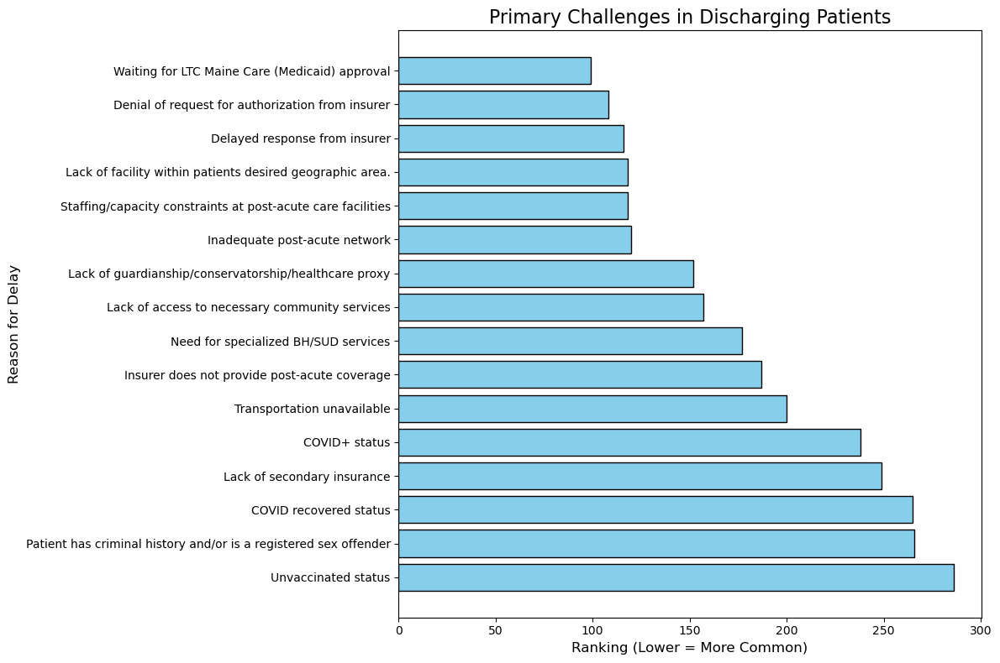

In [267]:
data = {
    "Reason for Delay": [
        "Denial of request for authorization from insurer",
        "Delayed response from insurer",
        "Inadequate post-acute network",
        "Insurer does not provide post-acute coverage",
        "COVID+ status",
        "COVID recovered status",
        "Unvaccinated status",
        "Staffing/capacity constraints at post-acute care facilities",
        "Need for specialized BH/SUD services",
        "Transportation unavailable",
        "Lack of facility within patients desired geographic area.",
        "Lack of access to necessary community services",
        "Lack of guardianship/conservatorship/healthcare proxy",
        "Lack of secondary insurance",
        "Waiting for LTC Maine Care (Medicaid) approval",
        "Patient has criminal history and/or is a registered sex offender"
    ],
    "Ranking": [
        108, 116, 120, 187, 238, 265, 286, 118, 177, 200, 118, 157, 152, 249, 99, 266
    ]
}

df = pd.DataFrame(data)
df = df.sort_values(by="Ranking", ascending=False)

plt.figure(figsize=(12, 8))
plt.barh(df["Reason for Delay"], df["Ranking"], color="skyblue", edgecolor="black")
plt.title("Primary Challenges in Discharging Patients", fontsize=16)
plt.xlabel("Ranking (Lower = More Common)", fontsize=12)
plt.ylabel("Reason for Delay", fontsize=12)
plt.tight_layout()
plt.savefig("figs/q21.png")
plt.show()



### 22: Healthcare Coverage

| Payer                            |   Number of Patients |
|:---------------------------------|---------------------:|
| Medicare Non-Managed             |                   38 |
| Medicare Advantage               |                   52 |
| MaineCare                        |                   34 |
| Medicaid Presumptive Eligibility |                    7 |
| Dual Eligible                    |                    5 |
| Commercial Insurer               |                    3 |
| Self-Pay                         |                    3 |
| Other State                      |                    1 |
| Other                            |                    0 |


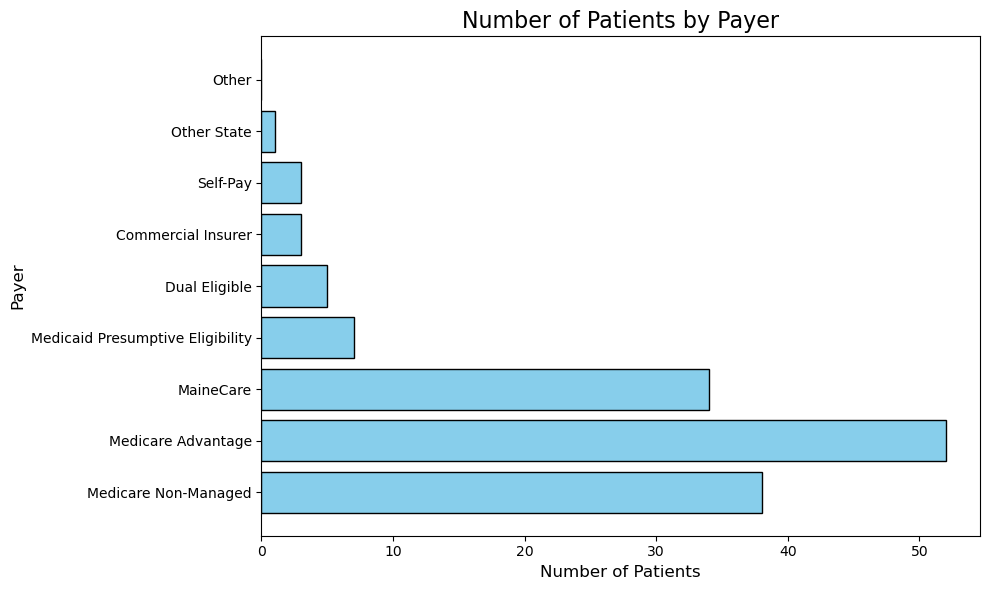

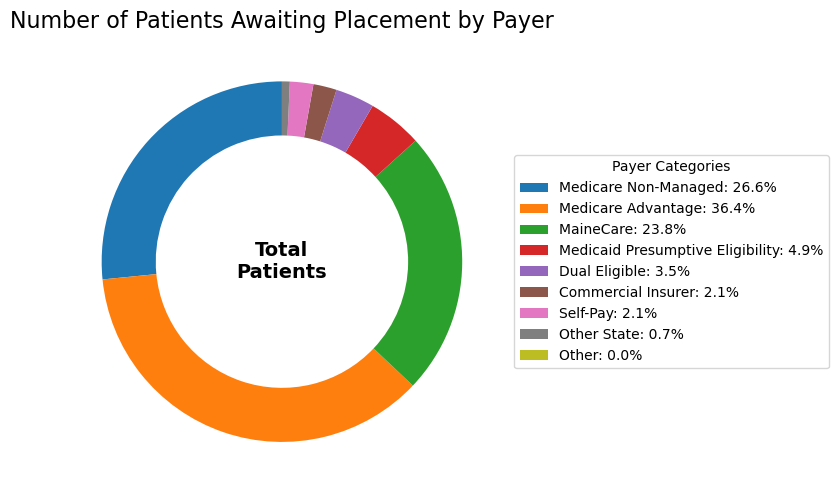

In [268]:
import squarify
import plotly.express as px


# Data preparation
data = {
    "Payer": [
        "Medicare Non-Managed",
        "Medicare Advantage",
        "MaineCare",
        "Medicaid Presumptive Eligibility",
        "Dual Eligible",
        "Commercial Insurer",
        "Self-Pay",
        "Other State",
        "Other"
    ],
    "Number of Patients": [38.0, 52.0, 34.0, 7.0, 5.0, 3.0, 3.0, 1.0, 0.0]
}

df = pd.DataFrame(data)

print(df.to_markdown(index=False))


plt.figure(figsize=(10, 6))
plt.barh(df["Payer"], df["Number of Patients"], color="skyblue", edgecolor="black")
plt.title("Number of Patients by Payer", fontsize=16)
plt.xlabel("Number of Patients", fontsize=12)
plt.ylabel("Payer", fontsize=12)
plt.tight_layout()
plt.savefig("figs/q22_bar.png")
plt.show()


df["Percentage"] = df["Number of Patients"] / df["Number of Patients"].sum() * 100
plt.figure(figsize=(8, 8))
wedges, texts = plt.pie(
    df["Number of Patients"],
    labels=None, 
    startangle=90,
    wedgeprops={'width': 0.3},  
    textprops={'fontsize': 10}
)
plt.title("Number of Patients Awaiting Placement by Payer", fontsize=16)
plt.text(0, 0, "Total\nPatients", ha='center', va='center', fontsize=14, weight='bold')
legend_labels = [
    f"{payer}: {percentage:.1f}%" for payer, percentage in zip(df["Payer"], df["Percentage"])
]
plt.legend(
    wedges,
    legend_labels,
    title="Payer Categories",
    loc="center left",
    bbox_to_anchor=(1, 0.5),
    fontsize=10
)
plt.tight_layout()
plt.savefig("figs/q1_donut.png")
plt.show()

## Section 2

### 1-6:

In [174]:
data = {
    "Question": [
        "Number of homeless or housing unstable inpatients awaiting discharge to shelters",
        "Number of patients awaiting discharge to shelters for more than 7 days",
        "Number of homeless patients with behavioral health issues or SUD",
        "Number of medically cleared patients awaiting discharge due to lack of transportation",
        "Maximum wait time for transportation (in past two weeks)",
        "Patients unable to find a bed due to lack of reimbursement for outpatient hemodialysis"
    ],
    "Response": [27.0, 14.0, 34.0, 9.0, 34.0, 3.0]
}

df = pd.DataFrame(data)
print(df.to_markdown(index=False))

| Question                                                                               |   Response |
|:---------------------------------------------------------------------------------------|-----------:|
| Number of homeless or housing unstable inpatients awaiting discharge to shelters       |         27 |
| Number of patients awaiting discharge to shelters for more than 7 days                 |         14 |
| Number of homeless patients with behavioral health issues or SUD                       |         34 |
| Number of medically cleared patients awaiting discharge due to lack of transportation  |          9 |
| Maximum wait time for transportation (in past two weeks)                               |         34 |
| Patients unable to find a bed due to lack of reimbursement for outpatient hemodialysis |          3 |


## Emeregency Department

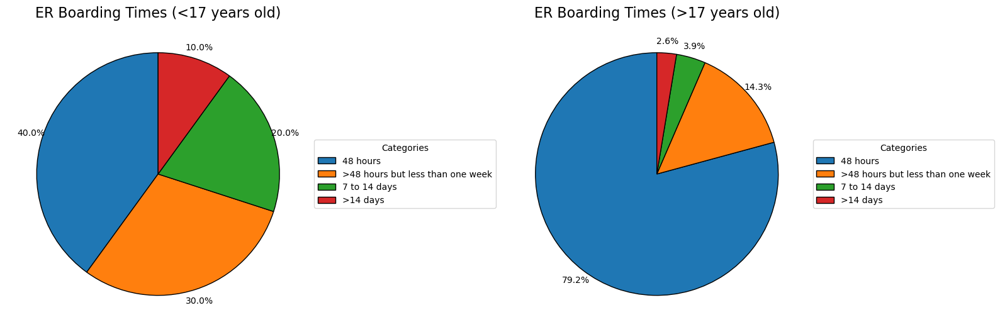

In [245]:


# Define a reusable function for processing data and generating pie chart inputs
def process_ER_data(prefix, numerical_df, delineator, combine_rows=True, combined_label=">14 days"):
    # Filter and process relevant columns
    filtered_columns = numerical_df.filter(like=prefix, axis=1)
    sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()
    
    # Extract and rename columns
    column_name = sums_df['index'].iloc[0].split(delineator)[0].strip()
    sums_df['index'] = sums_df['index'].str.split(delineator).str[1].str.strip()
    sums_df.rename(columns={'index': column_name, 0: 'Number of patients'}, inplace=True)
    sums_df = sums_df[sums_df['Number of patients'] != 0]

    if combine_rows:
        # Combine rows with low counts
        rows_to_combine = sums_df[sums_df["Number of patients"] < 2]
        combined_row = rows_to_combine.sum(numeric_only=True)
        combined_row[column_name] = combined_label
        sums_df = sums_df[sums_df["Number of patients"] >= 2]
        sums_df = pd.concat([sums_df, pd.DataFrame([combined_row])], ignore_index=True)
    
    return sums_df, column_name

# Process data for both groups
prefix1 = "Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than:"
sums_df1, column_name1 = process_ER_data(prefix1, numerical_df, delineator=':')
labels1 = sums_df1[column_name1]
sizes1 = sums_df1['Number of patients']
title1 = "ER Boarding Times (<17 years old)"

prefix2 = "Of those patients aged 18 or older, how many have been boarding in your emergency department for more than:"
sums_df2, column_name2 = process_ER_data(prefix2, numerical_df, delineator=':')
labels2 = sums_df2[column_name2]
sizes2 = sums_df2['Number of patients']
title2 = "ER Boarding Times (>17 years old)"

# Create pie charts
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# Function to generate pie chart
def plot_pie(ax, sizes, labels, title):
    wedges, _, _ = ax.pie(
        sizes, 
        autopct='%1.1f%%', 
        startangle=90, 
        pctdistance=1.1, 
        wedgeprops={'edgecolor': 'black'}
    )
    ax.legend(
        wedges, labels, 
        title="Categories", 
        loc='center left', 
        bbox_to_anchor=(1, 0.5)
    )
    ax.set_title(title, fontsize=16)

# Plot both charts
plot_pie(axes[0], sizes1, labels1, title1)
plot_pie(axes[1], sizes2, labels2, title2)

# Adjust layout
plt.tight_layout()
plt.show()

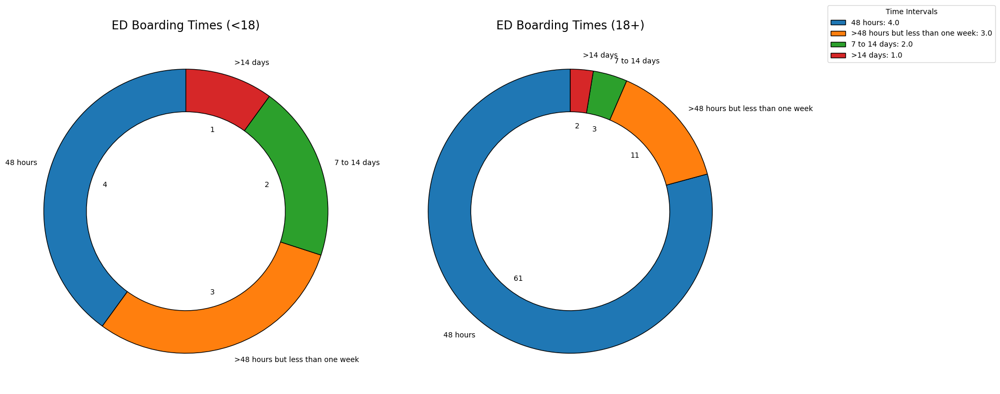

In [270]:
def plot_donut(ax, sizes, labels, title):
    wedges, _, autotexts = ax.pie(
        sizes,
        autopct=lambda p: f'{int(round(p * sum(sizes) / 100))}',
        startangle=90,
        labels=labels,
        pctdistance=0.6,
        wedgeprops={'width': 0.3, 'edgecolor': 'black'}  
    )
    ax.set_title(title, fontsize=16)
    return wedges

# Process data for both groups
prefix1 = "Of those patients aged 17 or younger, how many have been boarding in your emergency department for more than:"
sums_df1, column_name1 = process_ER_data(prefix1, numerical_df, delineator=':')
labels1 = sums_df1[column_name1]
sizes1 = sums_df1['Number of patients']
title1 = "ED Boarding Times (<18)"

prefix2 = "Of those patients aged 18 or older, how many have been boarding in your emergency department for more than:"
sums_df2, column_name2 = process_ER_data(prefix2, numerical_df, delineator=':')
labels2 = sums_df2[column_name2]
sizes2 = sums_df2['Number of patients']
title2 = "ED Boarding Times (18+)"

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
wedges1 = plot_donut(axes[0], sizes1, labels1, title1)
wedges2 = plot_donut(axes[1], sizes2, labels2, title2)
legend_labels1 = [f"{label}: {size}" for label, size in zip(labels1, sizes1)]

fig.legend(
    wedges1,  
    legend_labels1,  
    title="Time Intervals",
    loc='upper right',
    bbox_to_anchor=(1.2, 1),
    fontsize=10
)
plt.tight_layout()
plt.savefig("figs/ed1_donut.png")
plt.show()

,"Of those patients reported in question 11, how many are awaiting beds/placements in the following settings",Number of patients
0,Inpatient bed for medical management (Interhos...,51.0
1,Inpatient bed for medical management (Intrahos...,4.0
2,Detox/SUD/OUD Tx facility,1.0
3,Inpatient psychiatric,15.0
4,LTC/SNF,9.0
5,Behavioral Health Home/PNMI/IDD Facility,1.0
6,Other,2.0


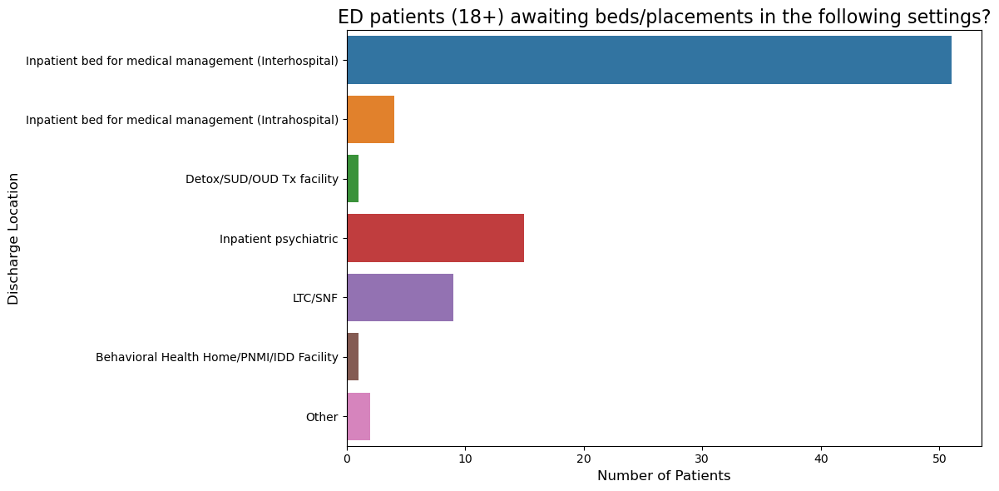

In [281]:
prefix = "Of those patients reported in question 11, how many are awaiting beds/placements in the following settings?"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
sums_df = filtered_columns.sum()
sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()
sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)
display(sums_df)

title = 'ED patients (18+) awaiting beds/placements in the following settings?'
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(y=column_name, x='Number of patients', hue=column_name, data=sums_df)
plt.title(title, fontsize=16)
plt.ylabel('Discharge Location', fontsize=12)
plt.xlabel('Number of Patients', fontsize=12)
plt.xticks(rotation=None)
plt.tight_layout()
plt.savefig("figs/ed17.png")
plt.show()

,"Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings",Number of patients
2,Inpatient psychiatric,3.0
3,Behavioral Health Home/PNMI/IDD Facility,5.0


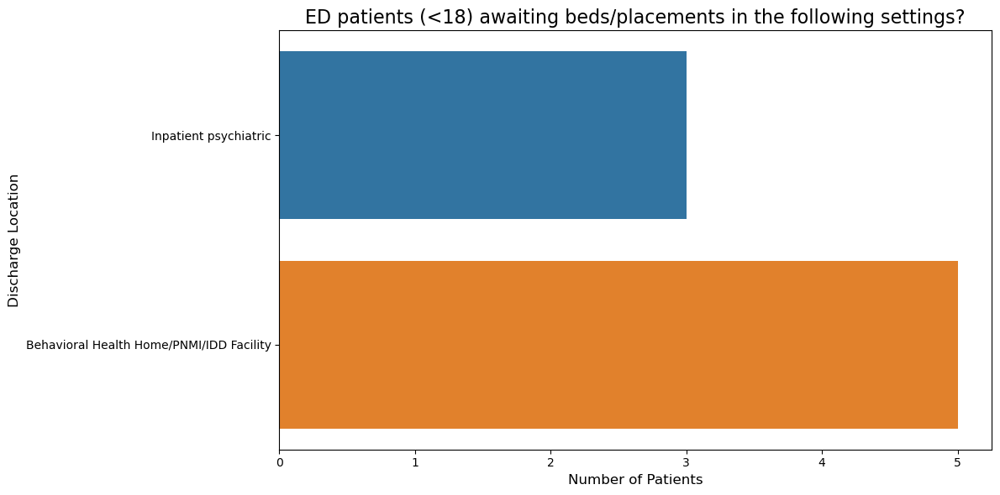

In [280]:
prefix = "Of those patients reported in question 4 (<17 years old), how many are awaiting beds/placements in the following settings?"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
sums_df = filtered_columns.sum()
sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()
sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)
sums_df = sums_df[sums_df["Number of patients"] != 0]
display(sums_df)

title = 'ED patients (<18) awaiting beds/placements in the following settings?'
plt.figure(figsize=(12, 6))
sns.barplot(y=column_name, x='Number of patients', hue=column_name, data=sums_df)
plt.title(title, fontsize=16)
plt.ylabel('Discharge Location', fontsize=12)
plt.xlabel('Number of Patients', fontsize=12)
plt.xticks(rotation=None)
plt.tight_layout()
plt.savefig("figs/ed10.png")
plt.show()

,"Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons",Number of patients
0,Availability of Community Services:,6.0
1,Availability of Medical Inpatient Bed in your ...,36.0
2,Availability of Medical Inpatient Bed in anoth...,6.0
3,Availability of PNMI / Residential Placement:,1.0
4,Lack of Transport to Move Patient:,2.0
5,Availability of Inpatient Psychiatric Bed:,10.0
6,Availability of Detox Bed:,0.0
7,Availability of SNF bed:,7.0
8,Lack of Guardianship,2.0
9,Lack of Insurance,3.0


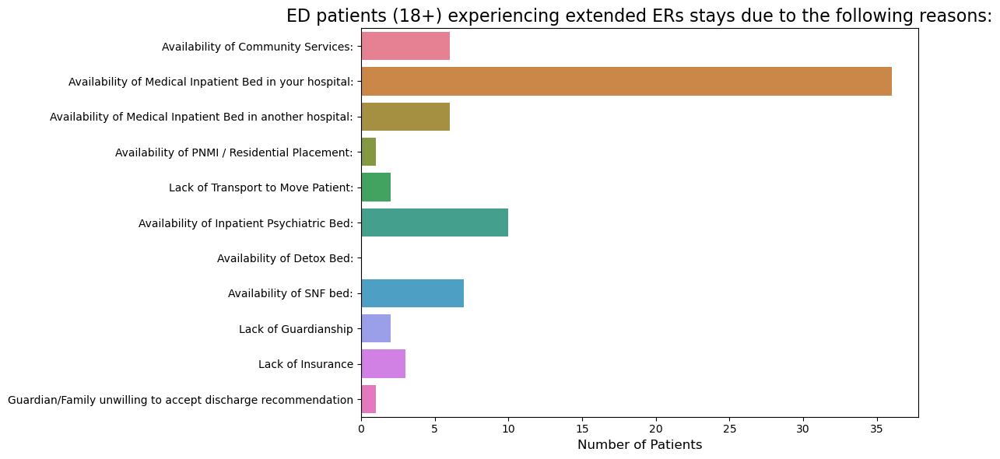

In [282]:
prefix = "Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons?"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
sums_df = filtered_columns.sum()

sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()

# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split('?')[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split('?').str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)

display(sums_df)

title = 'ED patients (18+) experiencing extended ERs stays due to the following reasons:'
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(y=column_name, x='Number of patients', hue=column_name, data=sums_df)
plt.title(title, fontsize=16)
plt.ylabel('', fontsize=12)
plt.xlabel('Number of Patients', fontsize=12)
plt.xticks(rotation=None)
plt.tight_layout()
plt.savefig("figs/ed13.png")

plt.show()

,"Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons",Number of patients
0,Abandoned by Guardian:,4.0
1,Ambulance/transport Unavailable:,1.0
2,Availability of CCSU bed:,2.0
3,Availability of Community Services:,2.0
4,Availability of Inpatient Bed:,2.0
5,Availability of PNMI / Residential Placement:,5.0
6,Availability of Resource (Foster) Home Placement:,0.0
7,DHHS Guardian Unable to Secure Alternate Place...,1.0
8,Guardian Does Not Wish for Youth to Return to ...,5.0
9,Guardian Unwilling to Accept Discharge Recomme...,3.0


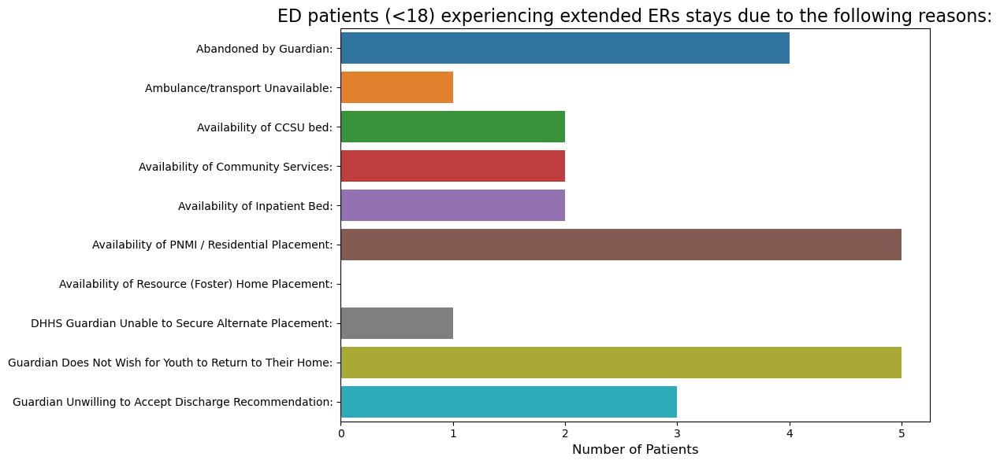

In [283]:
prefix = "Of those patients aged 17 or younger reported in Question 4, how many are experiencing extended ERs stays due to the following reasons?"
filtered_columns = numerical_df.filter(like=prefix, axis=1)
sums_df = pd.DataFrame(filtered_columns.sum()).reset_index()
delineator = "?"
# Extract the text before the colon to use as the column name
column_name = sums_df['index'].iloc[0].split(delineator)[0].strip()

# Extract the values after the colon
sums_df['index'] = sums_df['index'].str.split(delineator).str[1].str.strip()

sums_df.rename(columns={'index': column_name, 0:'Number of patients'}, inplace=True)

display(sums_df)

title = 'ED patients (<18) experiencing extended ERs stays due to the following reasons:'
# Create a grouped bar plot
plt.figure(figsize=(12, 6))
sns.barplot(y=column_name, x='Number of patients', hue=column_name, data=sums_df)
plt.title(title, fontsize=16)
plt.ylabel("")
plt.xlabel('Number of Patients', fontsize=12)
plt.xticks(rotation=None)
plt.tight_layout()
plt.savefig("figs/ed9.png")

plt.show()

## Region breakdown

In [197]:
region_df = numerical_df.groupby('region').sum()
region_df

,Collector ID,Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):,Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):,Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):,Total number of patients awaiting discharge to the following settings: Home Health:,"Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):","Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:","Of the total patients reported in Question 1, how many patients are residents of other states that you are seeking to discharge them back to (aka, repatriating patients)? Skilled Nursing Facility (SNF):",...,"Of those patients aged 18 or older, how many experiencing extended ERs stays due to the following reasons? Guardian/Family unwilling to accept discharge recommendation","Of those reported in question 11, how many have displayed violent behaviors impacting healthcare staff? Open-Ended Response","If Yes, how many have been impacted in the past week?.1 Open-Ended Response","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Interhospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient bed for medical management (Intrahospital)","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Detox/SUD/OUD Tx facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Inpatient psychiatric","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? LTC/SNF","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Behavioral Health Home/PNMI/IDD Facility","Of those patients reported in question 11, how many are awaiting beds/placements in the following settings? Other"
region,,,,,,,,,,,,,,,,,,,,,
1.0,2.743899e+09,43.0,32.0,16.0,27.0,0.0,4.0,3.0,0.0,1.0,...,0.0,4.0,10.0,29.0,0.0,0.0,8.0,2.0,0.0,1.0
2.0,1.371950e+09,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3.0,1.371950e+09,21.0,4.0,8.0,7.0,3.0,1.0,0.0,0.0,0.0,...,0.0,3.0,12.0,0.0,0.0,0.0,3.0,2.0,0.0,0.0
4.0,1.371950e+09,7.0,10.0,6.0,4.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,1.0,4.0,2.0,1.0,1.0,4.0,0.0,0.0
5.0,9.146331e+08,6.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
6.0,2.743899e+09,28.0,24.0,6.0,33.0,1.0,5.0,0.0,0.0,0.0,...,0.0,1.0,2.0,18.0,1.0,0.0,2.0,1.0,1.0,0.0
7.0,9.146331e+08,3.0,3.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [278]:
import os
# Get the parent directory
parent_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))

# Change the current working directory to the parent directory
os.chdir(parent_dir)

# Verify the current working directory
print("Current Working Directory:", os.getcwd())


Current Working Directory: /Users/mikey/Library/Mobile Documents/com~apple~CloudDocs/Code/code_projects/MHA_throughput/Analysis/patient-throughput


In [ ]:
column_sums = numerical_df.sum()




Collector ID: 11432913425.0
Total number of patients awaiting discharge to the following settings: Skilled Nursing Facility (SNF):: 108.0
Total number of patients awaiting discharge to the following settings: Long Term Care Hospital (LTC):: 78.0
Total number of patients awaiting discharge to the following settings: Residential Care Facility (RCF):: 38.0
Total number of patients awaiting discharge to the following settings: Home Health:: 74.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Skilled Nursing Facility (SNF):: 4.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Long Term Care Hospital (LTC):: 10.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Residential Care Facility (RCF):: 3.0
Of the total patients reported in Question 1, how many patients require 1 to 1 supervision? Home Health:: 0.0
Of the total patients reported in Question 1, how many p